In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

# Use the kagglehub client library to attach Kaggle resources like competitions, datasets, and models to your session
# Learn more about kagglehub: https://github.com/Kaggle/kagglehub/blob/main/README.md

import kagglehub
# kagglehub.dataset_download('<owner>/<dataset-slug>')

Install timm

In [1]:
!pip install -q timm

Import Required Libraries

In [2]:
import gc
import json
import random
import shutil
import time
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from PIL import Image

import torch
import torch.nn as nn

from torch.utils.data import (
    Dataset,
    DataLoader,
    WeightedRandomSampler
)

from torchvision import transforms

import timm

from sklearn.model_selection import (
    GroupShuffleSplit,
    StratifiedGroupKFold
)

from sklearn.metrics import (
    accuracy_score,
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    classification_report,
    confusion_matrix,
    ConfusionMatrixDisplay
)

print("All required libraries imported successfully.")
print("PyTorch version:", torch.__version__)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

All required libraries imported successfully.
PyTorch version: 2.10.0+cu128
CUDA available: True
GPU: Tesla T4


Experiment Configuration

In [3]:
MODEL_NAME = "vit_base_patch16_224.augreg_in21k_ft_in1k"
EXPERIMENT_NAME = "vit_b16_5fold_finetuning"

SEED = 42
IMAGE_SIZE = 224

K_FOLDS = 5
FINAL_TEST_SIZE = 0.15

BATCH_SIZE = 16
NUM_WORKERS = 2

TOTAL_EPOCHS = 50
HEAD_EPOCHS = 5

HEAD_LEARNING_RATE = 3e-4
BACKBONE_LEARNING_RATE = 1e-5
FINETUNE_HEAD_LEARNING_RATE = 5e-5

WEIGHT_DECAY = 0.05
LABEL_SMOOTHING = 0.10
GRADIENT_CLIP_NORM = 1.0

MODEL_DROPOUT = 0.10
DROP_PATH_RATE = 0.10

DEVICE = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)

USE_AMP = DEVICE.type == "cuda"

OUTPUT_DIR = Path(
    "/kaggle/working/vit_b16_5fold"
)

OUTPUT_DIR.mkdir(
    parents=True,
    exist_ok=True
)


def set_random_seed(seed):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)

    if torch.cuda.is_available():
        torch.cuda.manual_seed(seed)
        torch.cuda.manual_seed_all(seed)


set_random_seed(SEED)


if torch.cuda.is_available():
    torch.backends.cudnn.benchmark = True


print("Experiment:", EXPERIMENT_NAME)
print("Model:", MODEL_NAME)
print("Device:", DEVICE)
print("Mixed precision:", USE_AMP)
print("Number of folds:", K_FOLDS)
print("Final test size:", FINAL_TEST_SIZE)
print("Image size:", IMAGE_SIZE)
print("Batch size:", BATCH_SIZE)
print("Total epochs per fold:", TOTAL_EPOCHS)
print("Head training epochs:", HEAD_EPOCHS)
print(
    "Full fine-tuning begins at epoch:",
    HEAD_EPOCHS + 1
)
print("Output directory:", OUTPUT_DIR)

Experiment: vit_b16_5fold_finetuning
Model: vit_base_patch16_224.augreg_in21k_ft_in1k
Device: cuda
Mixed precision: True
Number of folds: 5
Final test size: 0.15
Image size: 224
Batch size: 16
Total epochs per fold: 50
Head training epochs: 5
Full fine-tuning begins at epoch: 6
Output directory: /kaggle/working/vit_b16_5fold


Locate and Load HAM10000 Dataset

In [5]:
metadata_candidates = list(
    Path("/kaggle/input").rglob(
        "HAM10000_metadata.csv"
    )
)

if not metadata_candidates:
    raise FileNotFoundError(
        "HAM10000_metadata.csv was not found. "
        "Add the HAM10000 dataset to the notebook."
    )

METADATA_PATH = metadata_candidates[0]
DATASET_DIR = METADATA_PATH.parent

metadata_dataframe = pd.read_csv(
    METADATA_PATH
)

required_columns = {
    "lesion_id",
    "image_id",
    "dx"
}

missing_columns = (
    required_columns
    - set(metadata_dataframe.columns)
)

if missing_columns:
    raise ValueError(
        f"Missing metadata columns: {missing_columns}"
    )

metadata_dataframe["image_id"] = (
    metadata_dataframe["image_id"].astype(str)
)

valid_image_ids = set(
    metadata_dataframe["image_id"]
)

image_extensions = {
    ".jpg",
    ".jpeg",
    ".png"
}

all_image_paths = [
    path
    for path in DATASET_DIR.rglob("*")
    if (
        path.is_file()
        and path.suffix.lower() in image_extensions
        and path.stem in valid_image_ids
    )
]

if not all_image_paths:
    raise FileNotFoundError(
        "No HAM10000 image files were found."
    )


def image_path_priority(path):
    path_text = str(path).lower()

    preferred_folder = (
        "ham10000_images_part_1" in path_text
        or "ham10000_images_part_2" in path_text
    )

    return (
        0 if preferred_folder else 1,
        len(path_text),
        path_text
    )


all_image_paths = sorted(
    all_image_paths,
    key=image_path_priority
)

image_path_mapping = {}
duplicate_image_paths = {}

for image_path in all_image_paths:
    image_id = image_path.stem
    image_path_text = str(image_path)

    if image_id not in image_path_mapping:
        image_path_mapping[image_id] = (
            image_path_text
        )
    else:
        duplicate_image_paths.setdefault(
            image_id,
            [image_path_mapping[image_id]]
        ).append(image_path_text)


metadata_dataframe["path"] = (
    metadata_dataframe["image_id"].map(
        image_path_mapping
    )
)

missing_image_count = int(
    metadata_dataframe["path"].isna().sum()
)

if missing_image_count > 0:
    missing_image_ids = (
        metadata_dataframe.loc[
            metadata_dataframe["path"].isna(),
            "image_id"
        ]
        .drop_duplicates()
        .tolist()
    )

    print(
        "Metadata rows without an image:",
        missing_image_count
    )

    print(
        "First missing image IDs:",
        missing_image_ids[:10]
    )

metadata_dataframe = (
    metadata_dataframe
    .dropna(subset=["path"])
    .reset_index(drop=True)
)

if metadata_dataframe["lesion_id"].isna().any():
    raise ValueError(
        "Missing lesion IDs were found."
    )

if metadata_dataframe["image_id"].duplicated().any():
    raise ValueError(
        "Duplicate image IDs were found in metadata."
    )

print("Metadata path:", METADATA_PATH)
print("Dataset directory:", DATASET_DIR)

print(
    "Matching image files discovered:",
    len(all_image_paths)
)

print(
    "Unique image IDs mapped:",
    len(image_path_mapping)
)

print(
    "Image IDs with duplicate file copies:",
    len(duplicate_image_paths)
)

print(
    "Usable metadata rows:",
    len(metadata_dataframe)
)

print(
    "Unique images:",
    metadata_dataframe["image_id"].nunique()
)

print(
    "Unique lesions:",
    metadata_dataframe["lesion_id"].nunique()
)

print(
    "Diagnosis classes:",
    metadata_dataframe["dx"].nunique()
)

display(
    metadata_dataframe.head()
)

Metadata path: /kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000/HAM10000_metadata.csv
Dataset directory: /kaggle/input/datasets/kmader/skin-cancer-mnist-ham10000
Matching image files discovered: 20030
Unique image IDs mapped: 10015
Image IDs with duplicate file copies: 10015
Usable metadata rows: 10015
Unique images: 10015
Unique lesions: 7470
Diagnosis classes: 7


,lesion_id,image_id,dx,dx_type,age,sex,localization,path
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,/kaggle/input/datasets/kmader/skin-cancer-mnis...
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,/kaggle/input/datasets/kmader/skin-cancer-mnis...
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,/kaggle/input/datasets/kmader/skin-cancer-mnis...
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,/kaggle/input/datasets/kmader/skin-cancer-mnis...
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,/kaggle/input/datasets/kmader/skin-cancer-mnis...


Encode the Seven Diagnosis Classes

In [6]:
class_names = sorted(
    metadata_dataframe["dx"]
    .dropna()
    .unique()
    .tolist()
)

class_to_idx = {
    class_name: class_index
    for class_index, class_name
    in enumerate(class_names)
}

idx_to_class = {
    class_index: class_name
    for class_name, class_index
    in class_to_idx.items()
}

diagnosis_full_names = {
    "akiec": "Actinic Keratoses",
    "bcc": "Basal Cell Carcinoma",
    "bkl": "Benign Keratosis-like Lesions",
    "df": "Dermatofibroma",
    "mel": "Melanoma",
    "nv": "Melanocytic Nevi",
    "vasc": "Vascular Lesions"
}

metadata_dataframe["label"] = (
    metadata_dataframe["dx"].map(
        class_to_idx
    )
)

if metadata_dataframe["label"].isna().any():
    raise ValueError(
        "Some diagnosis classes could not be encoded."
    )

metadata_dataframe["label"] = (
    metadata_dataframe["label"].astype(int)
)

NUM_CLASSES = len(class_names)

if NUM_CLASSES != 7:
    raise ValueError(
        f"Expected 7 diagnosis classes, found {NUM_CLASSES}."
    )


class_distribution = (
    metadata_dataframe["dx"]
    .value_counts()
    .reindex(class_names)
    .rename_axis("class_code")
    .reset_index(name="image_count")
)

class_distribution["label"] = (
    class_distribution["class_code"].map(
        class_to_idx
    )
)

class_distribution["diagnosis"] = (
    class_distribution["class_code"].map(
        diagnosis_full_names
    )
)

class_distribution["percentage"] = (
    class_distribution["image_count"]
    / len(metadata_dataframe)
    * 100
)


print("Number of classes:", NUM_CLASSES)
print("\nClass mapping:")

for class_index in range(NUM_CLASSES):
    class_code = idx_to_class[class_index]

    print(
        f"{class_index}: "
        f"{class_code} - "
        f"{diagnosis_full_names[class_code]}"
    )

print("\nFull dataset class distribution:")

display(
    class_distribution[
        [
            "label",
            "class_code",
            "diagnosis",
            "image_count",
            "percentage"
        ]
    ]
)

Number of classes: 7

Class mapping:
0: akiec - Actinic Keratoses
1: bcc - Basal Cell Carcinoma
2: bkl - Benign Keratosis-like Lesions
3: df - Dermatofibroma
4: mel - Melanoma
5: nv - Melanocytic Nevi
6: vasc - Vascular Lesions

Full dataset class distribution:


,label,class_code,diagnosis,image_count,percentage
0,0,akiec,Actinic Keratoses,327,3.265102
1,1,bcc,Basal Cell Carcinoma,514,5.132302
2,2,bkl,Benign Keratosis-like Lesions,1099,10.973540
3,3,df,Dermatofibroma,115,1.148278
4,4,mel,Melanoma,1113,11.113330
5,5,nv,Melanocytic Nevi,6705,66.949576
6,6,vasc,Vascular Lesions,142,1.417873


Create the Untouched Final Test Set

In [7]:
def class_proportions(dataframe):
    return (
        dataframe["label"]
        .value_counts(normalize=True)
        .reindex(
            range(NUM_CLASSES),
            fill_value=0.0
        )
        .sort_index()
    )


full_class_proportions = class_proportions(
    metadata_dataframe
)

best_split = None
best_split_score = float("inf")

NUMBER_OF_SPLIT_CANDIDATES = 200


for candidate_index in range(
    NUMBER_OF_SPLIT_CANDIDATES
):
    splitter = GroupShuffleSplit(
        n_splits=1,
        test_size=FINAL_TEST_SIZE,
        random_state=SEED + candidate_index
    )

    development_indices, test_indices = next(
        splitter.split(
            metadata_dataframe,
            y=metadata_dataframe["label"],
            groups=metadata_dataframe["lesion_id"]
        )
    )

    candidate_development = (
        metadata_dataframe
        .iloc[development_indices]
    )

    candidate_test = (
        metadata_dataframe
        .iloc[test_indices]
    )

    development_classes = set(
        candidate_development["label"].unique()
    )

    test_classes = set(
        candidate_test["label"].unique()
    )

    required_classes = set(
        range(NUM_CLASSES)
    )

    if development_classes != required_classes:
        continue

    if test_classes != required_classes:
        continue

    candidate_test_proportions = (
        class_proportions(candidate_test)
    )

    class_distribution_difference = (
        candidate_test_proportions
        - full_class_proportions
    ).abs().mean()

    candidate_test_fraction = (
        len(candidate_test)
        / len(metadata_dataframe)
    )

    size_difference = abs(
        candidate_test_fraction
        - FINAL_TEST_SIZE
    )

    split_score = (
        class_distribution_difference
        + size_difference
    )

    if split_score < best_split_score:
        best_split_score = split_score

        best_split = (
            development_indices,
            test_indices,
            SEED + candidate_index
        )


if best_split is None:
    raise RuntimeError(
        "A valid lesion-level test split "
        "containing all classes could not be created."
    )


(
    development_indices,
    final_test_indices,
    selected_split_seed
) = best_split


development_dataframe = (
    metadata_dataframe
    .iloc[development_indices]
    .reset_index(drop=True)
)

final_test_dataframe = (
    metadata_dataframe
    .iloc[final_test_indices]
    .reset_index(drop=True)
)


development_lesions = set(
    development_dataframe["lesion_id"]
)

final_test_lesions = set(
    final_test_dataframe["lesion_id"]
)

lesion_overlap = (
    development_lesions
    & final_test_lesions
)

if lesion_overlap:
    raise ValueError(
        "Lesion leakage was detected between "
        "development and final test data."
    )


if (
    development_dataframe["image_id"]
    .isin(final_test_dataframe["image_id"])
    .any()
):
    raise ValueError(
        "Image leakage was detected between "
        "development and final test data."
    )


development_fraction = (
    len(development_dataframe)
    / len(metadata_dataframe)
)

final_test_fraction = (
    len(final_test_dataframe)
    / len(metadata_dataframe)
)


development_distribution = (
    development_dataframe["dx"]
    .value_counts()
    .reindex(class_names, fill_value=0)
)

final_test_distribution = (
    final_test_dataframe["dx"]
    .value_counts()
    .reindex(class_names, fill_value=0)
)

split_distribution = pd.DataFrame(
    {
        "development_count": (
            development_distribution
        ),
        "final_test_count": (
            final_test_distribution
        ),
        "development_percentage": (
            development_dataframe["dx"]
            .value_counts(normalize=True)
            .reindex(class_names, fill_value=0)
            * 100
        ),
        "final_test_percentage": (
            final_test_dataframe["dx"]
            .value_counts(normalize=True)
            .reindex(class_names, fill_value=0)
            * 100
        )
    }
)

split_distribution.index.name = "class_code"


print("Selected split seed:", selected_split_seed)

print(
    "Development images:",
    len(development_dataframe),
    f"({development_fraction * 100:.2f}%)"
)

print(
    "Final test images:",
    len(final_test_dataframe),
    f"({final_test_fraction * 100:.2f}%)"
)

print(
    "Development lesions:",
    development_dataframe[
        "lesion_id"
    ].nunique()
)

print(
    "Final test lesions:",
    final_test_dataframe[
        "lesion_id"
    ].nunique()
)

print(
    "Lesion overlap:",
    len(lesion_overlap)
)

print("\nClass distribution:")
display(split_distribution)

Selected split seed: 171
Development images: 8509 (84.96%)
Final test images: 1506 (15.04%)
Development lesions: 6349
Final test lesions: 1121
Lesion overlap: 0

Class distribution:


,development_count,final_test_count,development_percentage,final_test_percentage
class_code,,,,
akiec,277,50,3.255377,3.320053
bcc,438,76,5.147491,5.046481
bkl,935,164,10.988365,10.889774
df,100,15,1.175226,0.996016
mel,946,167,11.117640,11.088977
nv,5691,1014,66.882125,67.330677
vasc,122,20,1.433776,1.328021


Create 5 Stratified Lesion-Level Folds

In [8]:
development_dataframe = (
    development_dataframe
    .copy()
    .reset_index(drop=True)
)

development_dataframe["fold"] = -1

fold_splitter = StratifiedGroupKFold(
    n_splits=K_FOLDS,
    shuffle=True,
    random_state=SEED
)

fold_splits = list(
    fold_splitter.split(
        X=development_dataframe,
        y=development_dataframe["label"],
        groups=development_dataframe["lesion_id"]
    )
)

fold_summary_records = []

for fold_index, (
    fold_train_indices,
    fold_validation_indices
) in enumerate(fold_splits):

    development_dataframe.loc[
        fold_validation_indices,
        "fold"
    ] = fold_index

    fold_train_dataframe = (
        development_dataframe
        .iloc[fold_train_indices]
    )

    fold_validation_dataframe = (
        development_dataframe
        .iloc[fold_validation_indices]
    )

    train_lesions = set(
        fold_train_dataframe["lesion_id"]
    )

    validation_lesions = set(
        fold_validation_dataframe["lesion_id"]
    )

    overlapping_lesions = (
        train_lesions
        & validation_lesions
    )

    if overlapping_lesions:
        raise ValueError(
            f"Lesion leakage detected in fold "
            f"{fold_index + 1}."
        )

    train_classes = set(
        fold_train_dataframe["label"].unique()
    )

    validation_classes = set(
        fold_validation_dataframe[
            "label"
        ].unique()
    )

    required_classes = set(
        range(NUM_CLASSES)
    )

    if train_classes != required_classes:
        raise ValueError(
            f"Fold {fold_index + 1} training data "
            "does not contain all classes."
        )

    if validation_classes != required_classes:
        raise ValueError(
            f"Fold {fold_index + 1} validation data "
            "does not contain all classes."
        )

    fold_summary_records.append(
        {
            "fold": fold_index + 1,
            "training_images": len(
                fold_train_dataframe
            ),
            "validation_images": len(
                fold_validation_dataframe
            ),
            "training_lesions": (
                fold_train_dataframe[
                    "lesion_id"
                ].nunique()
            ),
            "validation_lesions": (
                fold_validation_dataframe[
                    "lesion_id"
                ].nunique()
            ),
            "lesion_overlap": len(
                overlapping_lesions
            )
        }
    )


if (
    development_dataframe["fold"] < 0
).any():
    raise ValueError(
        "Some development images were not assigned "
        "to a fold."
    )


fold_assignment_counts = (
    development_dataframe["fold"]
    .value_counts()
    .sort_index()
)

if fold_assignment_counts.sum() != len(
    development_dataframe
):
    raise ValueError(
        "Fold assignment count does not match "
        "the development dataset size."
    )


fold_summary_dataframe = pd.DataFrame(
    fold_summary_records
)

fold_class_distribution = pd.crosstab(
    development_dataframe["fold"] + 1,
    development_dataframe["dx"]
).reindex(
    columns=class_names,
    fill_value=0
)

fold_class_distribution.index.name = "fold"


print("Five stratified lesion-level folds created.")
print(
    "Development images assigned:",
    len(development_dataframe)
)
print(
    "Final test images excluded:",
    len(final_test_dataframe)
)

print("\nFold summary:")
display(fold_summary_dataframe)

print("\nValidation class distribution per fold:")
display(fold_class_distribution)

print(
    "\nAll folds contain all seven classes "
    "with zero lesion overlap."
)

Five stratified lesion-level folds created.
Development images assigned: 8509
Final test images excluded: 1506

Fold summary:


,fold,training_images,validation_images,training_lesions,validation_lesions,lesion_overlap
0,1,6771,1738,5079,1270,0
1,2,6811,1698,5080,1269,0
2,3,6842,1667,5079,1270,0
3,4,6801,1708,5078,1271,0
4,5,6811,1698,5080,1269,0



Validation class distribution per fold:


dx,akiec,bcc,bkl,df,mel,nv,vasc
fold,,,,,,,
1,60,84,194,20,198,1156,26
2,48,79,210,19,204,1112,26
3,53,97,174,21,157,1141,24
4,71,101,174,29,196,1110,27
5,45,77,183,11,191,1172,19



All folds contain all seven classes with zero lesion overlap.


Define Training Augmentation and Evaluation Transforms

In [9]:
IMAGENET_MEAN = (
    0.485,
    0.456,
    0.406
)

IMAGENET_STD = (
    0.229,
    0.224,
    0.225
)


train_transform = transforms.Compose(
    [
        transforms.RandomResizedCrop(
            size=IMAGE_SIZE,
            scale=(0.75, 1.00),
            ratio=(0.90, 1.10),
            antialias=True
        ),

        transforms.RandomHorizontalFlip(
            p=0.50
        ),

        transforms.RandomVerticalFlip(
            p=0.50
        ),

        transforms.RandomRotation(
            degrees=20
        ),

        transforms.ColorJitter(
            brightness=0.15,
            contrast=0.15,
            saturation=0.12,
            hue=0.02
        ),

        transforms.RandomApply(
            [
                transforms.GaussianBlur(
                    kernel_size=3,
                    sigma=(0.10, 1.00)
                )
            ],
            p=0.10
        ),

        transforms.ToTensor(),

        transforms.Normalize(
            mean=IMAGENET_MEAN,
            std=IMAGENET_STD
        )
    ]
)


validation_transform = transforms.Compose(
    [
        transforms.Resize(
            size=256,
            antialias=True
        ),

        transforms.CenterCrop(
            size=IMAGE_SIZE
        ),

        transforms.ToTensor(),

        transforms.Normalize(
            mean=IMAGENET_MEAN,
            std=IMAGENET_STD
        )
    ]
)


final_test_transform = transforms.Compose(
    [
        transforms.Resize(
            size=256,
            antialias=True
        ),

        transforms.CenterCrop(
            size=IMAGE_SIZE
        ),

        transforms.ToTensor(),

        transforms.Normalize(
            mean=IMAGENET_MEAN,
            std=IMAGENET_STD
        )
    ]
)


print("Training transform:")
print(train_transform)

print("\nValidation transform:")
print(validation_transform)

print("\nFinal test transform:")
print(final_test_transform)

print(
    "\nRandom augmentation is enabled only "
    "for fold training data."
)

Training transform:
Compose(
    RandomResizedCrop(size=(224, 224), scale=(0.75, 1.0), ratio=(0.9, 1.1), interpolation=bilinear, antialias=True)
    RandomHorizontalFlip(p=0.5)
    RandomVerticalFlip(p=0.5)
    RandomRotation(degrees=[-20.0, 20.0], interpolation=nearest, expand=False, fill=0)
    ColorJitter(brightness=(0.85, 1.15), contrast=(0.85, 1.15), saturation=(0.88, 1.12), hue=(-0.02, 0.02))
    RandomApply(
    p=0.1
    GaussianBlur(kernel_size=(3, 3), sigma=(0.1, 1.0))
)
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
)

Validation transform:
Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(0.229, 0.224, 0.225))
)

Final test transform:
Compose(
    Resize(size=256, interpolation=bilinear, max_size=None, antialias=True)
    CenterCrop(size=(224, 224))
    ToTensor()
    Normalize(mean=(0.485, 0.456, 0.406), std=(

Dataset Class and Fold DataLoaders

In [10]:
class HAM10000Dataset(Dataset):
    def __init__(
        self,
        dataframe,
        transform
    ):
        self.dataframe = (
            dataframe
            .copy()
            .reset_index(drop=True)
        )

        self.transform = transform

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, index):
        row = self.dataframe.iloc[index]

        image_path = row["path"]
        label = int(row["label"])
        image_id = str(row["image_id"])

        with Image.open(image_path) as image:
            image = image.convert("RGB")

        if self.transform is not None:
            image = self.transform(image)

        return image, label, image_id


def seed_worker(worker_id):
    worker_seed = (
        torch.initial_seed() % (2 ** 32)
    )

    np.random.seed(worker_seed)
    random.seed(worker_seed)


def create_fold_data_loaders(fold_number):
    if fold_number < 1 or fold_number > K_FOLDS:
        raise ValueError(
            f"Fold number must be between "
            f"1 and {K_FOLDS}."
        )

    fold_index = fold_number - 1

    fold_training_dataframe = (
        development_dataframe.loc[
            development_dataframe["fold"]
            != fold_index
        ]
        .copy()
        .reset_index(drop=True)
    )

    fold_validation_dataframe = (
        development_dataframe.loc[
            development_dataframe["fold"]
            == fold_index
        ]
        .copy()
        .reset_index(drop=True)
    )

    training_lesions = set(
        fold_training_dataframe["lesion_id"]
    )

    validation_lesions = set(
        fold_validation_dataframe["lesion_id"]
    )

    lesion_overlap = (
        training_lesions
        & validation_lesions
    )

    if lesion_overlap:
        raise ValueError(
            f"Lesion leakage detected in "
            f"fold {fold_number}."
        )

    training_dataset = HAM10000Dataset(
        dataframe=fold_training_dataframe,
        transform=train_transform
    )

    validation_dataset = HAM10000Dataset(
        dataframe=fold_validation_dataframe,
        transform=validation_transform
    )

    class_counts = (
        fold_training_dataframe["label"]
        .value_counts()
        .reindex(
            range(NUM_CLASSES),
            fill_value=0
        )
        .sort_index()
        .to_numpy()
    )

    if np.any(class_counts == 0):
        raise ValueError(
            f"Fold {fold_number} training data "
            "does not contain every class."
        )

    inverse_class_frequencies = (
        1.0 / class_counts
    )

    sample_weights = (
        fold_training_dataframe["label"]
        .map(
            {
                class_index:
                inverse_class_frequencies[
                    class_index
                ]
                for class_index
                in range(NUM_CLASSES)
            }
        )
        .to_numpy()
    )

    sampler_generator = (
        torch.Generator()
        .manual_seed(
            SEED + fold_number
        )
    )

    balanced_sampler = WeightedRandomSampler(
        weights=torch.as_tensor(
            sample_weights,
            dtype=torch.double
        ),
        num_samples=len(sample_weights),
        replacement=True,
        generator=sampler_generator
    )

    loader_generator = (
        torch.Generator()
        .manual_seed(
            SEED + 100 + fold_number
        )
    )

    training_loader = DataLoader(
        training_dataset,
        batch_size=BATCH_SIZE,
        sampler=balanced_sampler,
        num_workers=NUM_WORKERS,
        pin_memory=USE_AMP,
        persistent_workers=(
            NUM_WORKERS > 0
        ),
        worker_init_fn=seed_worker,
        generator=loader_generator
    )

    validation_loader = DataLoader(
        validation_dataset,
        batch_size=BATCH_SIZE,
        shuffle=False,
        num_workers=NUM_WORKERS,
        pin_memory=USE_AMP,
        persistent_workers=(
            NUM_WORKERS > 0
        ),
        worker_init_fn=seed_worker
    )

    return {
        "fold_number": fold_number,
        "training_dataframe": (
            fold_training_dataframe
        ),
        "validation_dataframe": (
            fold_validation_dataframe
        ),
        "training_dataset": training_dataset,
        "validation_dataset": validation_dataset,
        "training_loader": training_loader,
        "validation_loader": validation_loader,
        "class_counts": class_counts
    }


final_test_dataset = HAM10000Dataset(
    dataframe=final_test_dataframe,
    transform=final_test_transform
)

final_test_loader = DataLoader(
    final_test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    num_workers=NUM_WORKERS,
    pin_memory=USE_AMP,
    persistent_workers=(
        NUM_WORKERS > 0
    ),
    worker_init_fn=seed_worker
)


fold_one_data = create_fold_data_loaders(
    fold_number=1
)

sample_images, sample_labels, sample_image_ids = next(
    iter(
        fold_one_data["training_loader"]
    )
)


print("Fold 1 training images:", len(
    fold_one_data["training_dataframe"]
))

print("Fold 1 validation images:", len(
    fold_one_data["validation_dataframe"]
))

print("Final test images:", len(
    final_test_dataframe
))

print(
    "Training batch image shape:",
    sample_images.shape
)

print(
    "Training batch label shape:",
    sample_labels.shape
)

print(
    "Training class counts:",
    fold_one_data["class_counts"]
)

print(
    "Training augmentation:",
    "Enabled"
)

print(
    "Validation augmentation:",
    "Disabled"
)

print(
    "Final test augmentation:",
    "Disabled"
)

Fold 1 training images: 6771
Fold 1 validation images: 1738
Final test images: 1506
Training batch image shape: torch.Size([16, 3, 224, 224])
Training batch label shape: torch.Size([16])
Training class counts: [ 217  354  741   80  748 4535   96]
Training augmentation: Enabled
Validation augmentation: Disabled
Final test augmentation: Disabled


Create the Pretrained ViT-B/16 Model

In [11]:
class ViTB16Classifier(nn.Module):
    def __init__(
        self,
        num_classes,
        dropout_rate,
        drop_path_rate
    ):
        super().__init__()

        self.network = timm.create_model(
            MODEL_NAME,
            pretrained=True,
            num_classes=num_classes,
            drop_rate=dropout_rate,
            drop_path_rate=drop_path_rate
        )

    def forward(self, images):
        return self.network(images)

    def get_classifier_module(self):
        classifier_module = (
            self.network.get_classifier()
        )

        if not isinstance(
            classifier_module,
            nn.Module
        ):
            raise TypeError(
                "The model classifier could not "
                "be identified."
            )

        return classifier_module

    def freeze_backbone(self):
        for parameter in self.network.parameters():
            parameter.requires_grad = False

        classifier_module = (
            self.get_classifier_module()
        )

        for parameter in classifier_module.parameters():
            parameter.requires_grad = True

    def unfreeze_all(self):
        for parameter in self.network.parameters():
            parameter.requires_grad = True

    def classifier_parameters(self):
        return list(
            self.get_classifier_module().parameters()
        )

    def backbone_parameters(self):
        classifier_parameter_ids = {
            id(parameter)
            for parameter
            in self.classifier_parameters()
        }

        return [
            parameter
            for parameter
            in self.network.parameters()
            if id(parameter)
            not in classifier_parameter_ids
        ]


def count_parameters(model):
    total_parameters = sum(
        parameter.numel()
        for parameter in model.parameters()
    )

    trainable_parameters = sum(
        parameter.numel()
        for parameter in model.parameters()
        if parameter.requires_grad
    )

    return (
        total_parameters,
        trainable_parameters
    )


def create_vit_model():
    model = ViTB16Classifier(
        num_classes=NUM_CLASSES,
        dropout_rate=MODEL_DROPOUT,
        drop_path_rate=DROP_PATH_RATE
    )

    return model.to(DEVICE)


test_model = create_vit_model()

total_parameters, trainable_parameters = (
    count_parameters(test_model)
)

print("ViT-B/16 model created successfully.")
print("Model name:", MODEL_NAME)
print("Output classes:", NUM_CLASSES)
print(
    "Classifier:",
    test_model.get_classifier_module()
)
print(
    "Total parameters:",
    f"{total_parameters:,}"
)
print(
    "Initially trainable parameters:",
    f"{trainable_parameters:,}"
)


test_model.freeze_backbone()

(
    _,
    head_trainable_parameters
) = count_parameters(test_model)

print(
    "Trainable parameters during head training:",
    f"{head_trainable_parameters:,}"
)


test_model.unfreeze_all()

(
    _,
    finetuning_trainable_parameters
) = count_parameters(test_model)

print(
    "Trainable parameters during full fine-tuning:",
    f"{finetuning_trainable_parameters:,}"
)


with torch.no_grad():
    sample_input = torch.randn(
        2,
        3,
        IMAGE_SIZE,
        IMAGE_SIZE,
        device=DEVICE
    )

    sample_output = test_model(
        sample_input
    )

print(
    "Test output shape:",
    sample_output.shape
)

if sample_output.shape != (
    2,
    NUM_CLASSES
):
    raise ValueError(
        "The model output shape is incorrect."
    )


del test_model
del sample_input
del sample_output

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

ViT-B/16 model created successfully.
Model name: vit_base_patch16_224.augreg_in21k_ft_in1k
Output classes: 7
Classifier: Linear(in_features=768, out_features=7, bias=True)
Total parameters: 85,804,039
Initially trainable parameters: 85,804,039
Trainable parameters during head training: 5,383
Trainable parameters during full fine-tuning: 85,804,039
Test output shape: torch.Size([2, 7])


Loss, AdamW Optimizer and Learning-Rate Schedulers

In [12]:
TRAINING_CRITERION = nn.CrossEntropyLoss(
    label_smoothing=LABEL_SMOOTHING
)

VALIDATION_CRITERION = nn.CrossEntropyLoss()

HEAD_WARMUP_EPOCHS = 1
FINETUNING_WARMUP_EPOCHS = 2

MINIMUM_LEARNING_RATE = 1e-7


def split_decay_parameters(
    named_parameters,
    learning_rate
):
    decay_parameters = []
    no_decay_parameters = []

    for parameter_name, parameter in named_parameters:
        if not parameter.requires_grad:
            continue

        use_no_weight_decay = (
            parameter.ndim <= 1
            or parameter_name.endswith(".bias")
            or "pos_embed" in parameter_name
            or "cls_token" in parameter_name
            or "dist_token" in parameter_name
        )

        if use_no_weight_decay:
            no_decay_parameters.append(parameter)
        else:
            decay_parameters.append(parameter)

    parameter_groups = []

    if decay_parameters:
        parameter_groups.append(
            {
                "params": decay_parameters,
                "lr": learning_rate,
                "weight_decay": WEIGHT_DECAY
            }
        )

    if no_decay_parameters:
        parameter_groups.append(
            {
                "params": no_decay_parameters,
                "lr": learning_rate,
                "weight_decay": 0.0
            }
        )

    return parameter_groups


def create_warmup_cosine_scheduler(
    optimizer,
    total_phase_epochs,
    warmup_epochs
):
    if total_phase_epochs <= 0:
        raise ValueError(
            "The number of phase epochs must be positive."
        )

    warmup_epochs = min(
        warmup_epochs,
        total_phase_epochs - 1
    )

    if warmup_epochs <= 0:
        return torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer,
            T_max=total_phase_epochs,
            eta_min=MINIMUM_LEARNING_RATE
        )

    warmup_scheduler = (
        torch.optim.lr_scheduler.LinearLR(
            optimizer,
            start_factor=0.20,
            end_factor=1.00,
            total_iters=warmup_epochs
        )
    )

    cosine_epochs = (
        total_phase_epochs - warmup_epochs
    )

    cosine_scheduler = (
        torch.optim.lr_scheduler.CosineAnnealingLR(
            optimizer,
            T_max=cosine_epochs,
            eta_min=MINIMUM_LEARNING_RATE
        )
    )

    scheduler = (
        torch.optim.lr_scheduler.SequentialLR(
            optimizer,
            schedulers=[
                warmup_scheduler,
                cosine_scheduler
            ],
            milestones=[warmup_epochs]
        )
    )

    return scheduler


def create_head_training_components(model):
    model.freeze_backbone()

    classifier_module = (
        model.get_classifier_module()
    )

    classifier_named_parameters = list(
        classifier_module.named_parameters()
    )

    optimizer_groups = split_decay_parameters(
        named_parameters=classifier_named_parameters,
        learning_rate=HEAD_LEARNING_RATE
    )

    optimizer = torch.optim.AdamW(
        optimizer_groups,
        betas=(0.9, 0.999)
    )

    scheduler = create_warmup_cosine_scheduler(
        optimizer=optimizer,
        total_phase_epochs=HEAD_EPOCHS,
        warmup_epochs=HEAD_WARMUP_EPOCHS
    )

    return optimizer, scheduler


def create_finetuning_components(model):
    model.unfreeze_all()

    classifier_parameter_ids = {
        id(parameter)
        for parameter
        in model.classifier_parameters()
    }

    backbone_named_parameters = []
    classifier_named_parameters = []

    for parameter_name, parameter in (
        model.network.named_parameters()
    ):
        if id(parameter) in classifier_parameter_ids:
            classifier_named_parameters.append(
                (
                    parameter_name,
                    parameter
                )
            )
        else:
            backbone_named_parameters.append(
                (
                    parameter_name,
                    parameter
                )
            )

    optimizer_groups = []

    optimizer_groups.extend(
        split_decay_parameters(
            named_parameters=backbone_named_parameters,
            learning_rate=BACKBONE_LEARNING_RATE
        )
    )

    optimizer_groups.extend(
        split_decay_parameters(
            named_parameters=classifier_named_parameters,
            learning_rate=(
                FINETUNE_HEAD_LEARNING_RATE
            )
        )
    )

    optimizer = torch.optim.AdamW(
        optimizer_groups,
        betas=(0.9, 0.999)
    )

    fine_tuning_epochs = (
        TOTAL_EPOCHS - HEAD_EPOCHS
    )

    scheduler = create_warmup_cosine_scheduler(
        optimizer=optimizer,
        total_phase_epochs=fine_tuning_epochs,
        warmup_epochs=FINETUNING_WARMUP_EPOCHS
    )

    return optimizer, scheduler


def create_gradient_scaler():
    try:
        return torch.amp.GradScaler(
            "cuda",
            enabled=USE_AMP
        )
    except (AttributeError, TypeError):
        return torch.cuda.amp.GradScaler(
            enabled=USE_AMP
        )


def get_optimizer_learning_rates(optimizer):
    return [
        float(parameter_group["lr"])
        for parameter_group
        in optimizer.param_groups
    ]


print("Training loss: CrossEntropyLoss")
print(
    "Label smoothing:",
    LABEL_SMOOTHING
)
print(
    "Validation loss:",
    "CrossEntropyLoss without label smoothing"
)
print("Optimizer: AdamW")
print(
    "Head learning rate:",
    HEAD_LEARNING_RATE
)
print(
    "Backbone fine-tuning learning rate:",
    BACKBONE_LEARNING_RATE
)
print(
    "Classifier fine-tuning learning rate:",
    FINETUNE_HEAD_LEARNING_RATE
)
print(
    "Head warm-up epochs:",
    HEAD_WARMUP_EPOCHS
)
print(
    "Fine-tuning warm-up epochs:",
    FINETUNING_WARMUP_EPOCHS
)
print(
    "Scheduler:",
    "Linear warm-up followed by cosine decay"
)

Training loss: CrossEntropyLoss
Label smoothing: 0.1
Validation loss: CrossEntropyLoss without label smoothing
Optimizer: AdamW
Head learning rate: 0.0003
Backbone fine-tuning learning rate: 1e-05
Classifier fine-tuning learning rate: 5e-05
Head warm-up epochs: 1
Fine-tuning warm-up epochs: 2
Scheduler: Linear warm-up followed by cosine decay


Training and Validation Functions

In [14]:
def calculate_classification_metrics(
    true_labels,
    predicted_labels
):
    accuracy = accuracy_score(
        true_labels,
        predicted_labels
    )

    macro_precision = precision_score(
        true_labels,
        predicted_labels,
        average="macro",
        zero_division=0
    )

    macro_recall = recall_score(
        true_labels,
        predicted_labels,
        average="macro",
        zero_division=0
    )

    macro_f1 = f1_score(
        true_labels,
        predicted_labels,
        average="macro",
        zero_division=0
    )

    return {
        "accuracy": float(accuracy),
        "macro_precision": float(
            macro_precision
        ),
        "macro_recall": float(
            macro_recall
        ),
        "macro_f1": float(macro_f1)
    }


def train_one_epoch(
    model,
    data_loader,
    optimizer,
    scaler,
    head_training
):
    model.train()

    if head_training:
        model.network.eval()
        model.get_classifier_module().train()

    running_loss = 0.0
    processed_samples = 0

    true_labels = []
    predicted_labels = []

    for images, labels, _ in data_loader:
        images = images.to(
            DEVICE,
            non_blocking=True
        )

        labels = labels.to(
            DEVICE,
            non_blocking=True
        )

        optimizer.zero_grad(
            set_to_none=True
        )

        with torch.autocast(
            device_type=DEVICE.type,
            dtype=torch.float16,
            enabled=USE_AMP
        ):
            outputs = model(images)

            loss = TRAINING_CRITERION(
                outputs,
                labels
            )

        scaler.scale(loss).backward()

        scaler.unscale_(optimizer)

        torch.nn.utils.clip_grad_norm_(
            model.parameters(),
            max_norm=GRADIENT_CLIP_NORM
        )

        scaler.step(optimizer)
        scaler.update()

        predictions = outputs.argmax(
            dim=1
        )

        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        processed_samples += batch_size

        true_labels.extend(
            labels.detach().cpu().tolist()
        )

        predicted_labels.extend(
            predictions.detach().cpu().tolist()
        )

    epoch_loss = (
        running_loss / processed_samples
    )

    epoch_metrics = (
        calculate_classification_metrics(
            true_labels=true_labels,
            predicted_labels=predicted_labels
        )
    )

    epoch_metrics["loss"] = float(
        epoch_loss
    )

    return epoch_metrics


@torch.no_grad()
def validate_one_epoch(
    model,
    data_loader
):
    model.eval()

    running_loss = 0.0
    processed_samples = 0

    true_labels = []
    predicted_labels = []
    predicted_probabilities = []
    image_ids = []

    for images, labels, batch_image_ids in data_loader:
        images = images.to(
            DEVICE,
            non_blocking=True
        )

        labels = labels.to(
            DEVICE,
            non_blocking=True
        )

        with torch.autocast(
            device_type=DEVICE.type,
            dtype=torch.float16,
            enabled=USE_AMP
        ):
            outputs = model(images)

            loss = VALIDATION_CRITERION(
                outputs,
                labels
            )

        probabilities = torch.softmax(
            outputs,
            dim=1
        )

        predictions = probabilities.argmax(
            dim=1
        )

        batch_size = images.size(0)

        running_loss += (
            loss.item() * batch_size
        )

        processed_samples += batch_size

        true_labels.extend(
            labels.cpu().tolist()
        )

        predicted_labels.extend(
            predictions.cpu().tolist()
        )

        predicted_probabilities.extend(
            probabilities.cpu().numpy()
        )

        image_ids.extend(
            list(batch_image_ids)
        )

    epoch_loss = (
        running_loss / processed_samples
    )

    epoch_metrics = (
        calculate_classification_metrics(
            true_labels=true_labels,
            predicted_labels=predicted_labels
        )
    )

    epoch_metrics["loss"] = float(
        epoch_loss
    )

    return {
        "metrics": epoch_metrics,
        "true_labels": np.asarray(
            true_labels,
            dtype=np.int64
        ),
        "predicted_labels": np.asarray(
            predicted_labels,
            dtype=np.int64
        ),
        "probabilities": np.asarray(
            predicted_probabilities,
            dtype=np.float32
        ),
        "image_ids": image_ids
    }


print(
    "Training and validation functions "
    "created successfully."
)

print(
    "Best checkpoint selection metric:",
    "validation Macro F1"
)

print(
    "Gradient clipping norm:",
    GRADIENT_CLIP_NORM
)

print(
    "Mixed precision enabled:",
    USE_AMP
)

Training and validation functions created successfully.
Best checkpoint selection metric: validation Macro F1
Gradient clipping norm: 1.0
Mixed precision enabled: True


Fold Checkpoint, History and Auto-Resume System

In [15]:
HISTORY_COLUMNS = [
    "fold",
    "epoch",
    "phase",
    "train_loss",
    "train_accuracy",
    "train_macro_precision",
    "train_macro_recall",
    "train_macro_f1",
    "validation_loss",
    "validation_accuracy",
    "validation_macro_precision",
    "validation_macro_recall",
    "validation_macro_f1",
    "backbone_learning_rate",
    "classifier_learning_rate",
    "epoch_time_seconds"
]


def get_fold_paths(fold_number):
    fold_directory = (
        OUTPUT_DIR / f"fold_{fold_number}"
    )

    fold_directory.mkdir(
        parents=True,
        exist_ok=True
    )

    return {
        "directory": fold_directory,
        "latest_checkpoint": (
            fold_directory
            / "latest_checkpoint.pt"
        ),
        "best_model": (
            fold_directory
            / "best_model.pt"
        ),
        "history": (
            fold_directory
            / "training_history.csv"
        ),
        "validation_predictions": (
            fold_directory
            / "best_validation_predictions.csv"
        )
    }


def load_torch_file(file_path):
    try:
        return torch.load(
            file_path,
            map_location=DEVICE,
            weights_only=False
        )
    except TypeError:
        return torch.load(
            file_path,
            map_location=DEVICE
        )


def atomic_torch_save(
    save_object,
    destination_path
):
    destination_path = Path(
        destination_path
    )

    temporary_path = (
        destination_path.parent
        / f"{destination_path.name}.temporary"
    )

    torch.save(
        save_object,
        temporary_path
    )

    temporary_path.replace(
        destination_path
    )


def capture_random_states():
    random_states = {
        "python": random.getstate(),
        "numpy": np.random.get_state(),
        "torch": torch.get_rng_state()
    }

    if torch.cuda.is_available():
        random_states["cuda"] = (
            torch.cuda.get_rng_state_all()
        )

    return random_states


def restore_random_states(random_states):
    if not random_states:
        return

    if "python" in random_states:
        random.setstate(
            random_states["python"]
        )

    if "numpy" in random_states:
        np.random.set_state(
            random_states["numpy"]
        )

    if "torch" in random_states:
        torch.set_rng_state(
            random_states["torch"]
        )

    if (
        torch.cuda.is_available()
        and "cuda" in random_states
    ):
        torch.cuda.set_rng_state_all(
            random_states["cuda"]
        )


def save_history_csv(
    history,
    history_path
):
    history_dataframe = pd.DataFrame(
        history
    )

    history_dataframe = (
        history_dataframe.reindex(
            columns=HISTORY_COLUMNS
        )
    )

    history_dataframe.to_csv(
        history_path,
        index=False
    )


def get_sampler_generator_state(
    fold_data
):
    sampler = (
        fold_data["training_loader"].sampler
    )

    sampler_generator = getattr(
        sampler,
        "generator",
        None
    )

    if sampler_generator is None:
        return None

    return sampler_generator.get_state()


def restore_sampler_generator_state(
    fold_data,
    generator_state
):
    if generator_state is None:
        return

    sampler = (
        fold_data["training_loader"].sampler
    )

    sampler_generator = getattr(
        sampler,
        "generator",
        None
    )

    if sampler_generator is not None:
        sampler_generator.set_state(
            generator_state
        )


def save_latest_fold_checkpoint(
    fold_number,
    completed_epoch,
    phase,
    model,
    optimizer,
    scheduler,
    scaler,
    best_validation_macro_f1,
    best_epoch,
    history,
    fold_data
):
    fold_paths = get_fold_paths(
        fold_number
    )

    checkpoint = {
        "experiment_name": EXPERIMENT_NAME,
        "model_name": MODEL_NAME,
        "fold_number": int(fold_number),
        "completed_epoch": int(
            completed_epoch
        ),
        "phase": phase,
        "best_validation_macro_f1": float(
            best_validation_macro_f1
        ),
        "best_epoch": int(best_epoch),
        "model_state_dict": (
            model.state_dict()
        ),
        "optimizer_state_dict": (
            optimizer.state_dict()
        ),
        "scheduler_state_dict": (
            scheduler.state_dict()
        ),
        "scaler_state_dict": (
            scaler.state_dict()
        ),
        "history": history,
        "random_states": (
            capture_random_states()
        ),
        "sampler_generator_state": (
            get_sampler_generator_state(
                fold_data
            )
        ),
        "class_to_idx": class_to_idx,
        "idx_to_class": idx_to_class,
        "number_of_classes": NUM_CLASSES,
        "image_size": IMAGE_SIZE,
        "total_epochs": TOTAL_EPOCHS,
        "head_epochs": HEAD_EPOCHS
    }

    atomic_torch_save(
        checkpoint,
        fold_paths["latest_checkpoint"]
    )

    save_history_csv(
        history=history,
        history_path=fold_paths["history"]
    )


def save_best_fold_model(
    fold_number,
    epoch,
    validation_macro_f1,
    model,
    validation_result
):
    fold_paths = get_fold_paths(
        fold_number
    )

    best_model_checkpoint = {
        "experiment_name": EXPERIMENT_NAME,
        "model_name": MODEL_NAME,
        "fold_number": int(fold_number),
        "epoch": int(epoch),
        "validation_macro_f1": float(
            validation_macro_f1
        ),
        "model_state_dict": (
            model.state_dict()
        ),
        "class_to_idx": class_to_idx,
        "idx_to_class": idx_to_class,
        "number_of_classes": NUM_CLASSES,
        "image_size": IMAGE_SIZE,
        "dropout_rate": MODEL_DROPOUT,
        "drop_path_rate": DROP_PATH_RATE
    }

    atomic_torch_save(
        best_model_checkpoint,
        fold_paths["best_model"]
    )

    validation_predictions = pd.DataFrame(
        {
            "image_id": (
                validation_result["image_ids"]
            ),
            "true_label": (
                validation_result["true_labels"]
            ),
            "predicted_label": (
                validation_result[
                    "predicted_labels"
                ]
            )
        }
    )

    validation_predictions[
        "true_class"
    ] = validation_predictions[
        "true_label"
    ].map(idx_to_class)

    validation_predictions[
        "predicted_class"
    ] = validation_predictions[
        "predicted_label"
    ].map(idx_to_class)

    validation_predictions[
        "correct"
    ] = (
        validation_predictions["true_label"]
        == validation_predictions[
            "predicted_label"
        ]
    )

    for class_index in range(
        NUM_CLASSES
    ):
        class_code = idx_to_class[
            class_index
        ]

        validation_predictions[
            f"probability_{class_code}"
        ] = validation_result[
            "probabilities"
        ][:, class_index]

    validation_predictions.to_csv(
        fold_paths[
            "validation_predictions"
        ],
        index=False
    )


def initialize_or_resume_fold(
    fold_number
):
    fold_paths = get_fold_paths(
        fold_number
    )

    fold_data = create_fold_data_loaders(
        fold_number=fold_number
    )

    model = create_vit_model()

    scaler = create_gradient_scaler()

    history = []

    start_epoch = 1
    best_validation_macro_f1 = -1.0
    best_epoch = 0
    current_phase = "head"

    optimizer, scheduler = (
        create_head_training_components(
            model
        )
    )

    latest_checkpoint_path = (
        fold_paths["latest_checkpoint"]
    )

    if latest_checkpoint_path.exists():
        checkpoint = load_torch_file(
            latest_checkpoint_path
        )

        if (
            int(checkpoint["fold_number"])
            != fold_number
        ):
            raise ValueError(
                "Checkpoint fold number does "
                "not match the requested fold."
            )

        model.load_state_dict(
            checkpoint["model_state_dict"]
        )

        completed_epoch = int(
            checkpoint["completed_epoch"]
        )

        start_epoch = (
            completed_epoch + 1
        )

        best_validation_macro_f1 = float(
            checkpoint[
                "best_validation_macro_f1"
            ]
        )

        best_epoch = int(
            checkpoint["best_epoch"]
        )

        history = checkpoint.get(
            "history",
            []
        )

        required_phase = (
            "head"
            if start_epoch <= HEAD_EPOCHS
            else "fine_tuning"
        )

        saved_phase = checkpoint.get(
            "phase",
            required_phase
        )

        if required_phase == "head":
            optimizer, scheduler = (
                create_head_training_components(
                    model
                )
            )
        else:
            optimizer, scheduler = (
                create_finetuning_components(
                    model
                )
            )

        current_phase = required_phase

        if saved_phase == required_phase:
            optimizer.load_state_dict(
                checkpoint[
                    "optimizer_state_dict"
                ]
            )

            scheduler.load_state_dict(
                checkpoint[
                    "scheduler_state_dict"
                ]
            )

        scaler_state = checkpoint.get(
            "scaler_state_dict"
        )

        if scaler_state:
            scaler.load_state_dict(
                scaler_state
            )

        restore_random_states(
            checkpoint.get(
                "random_states"
            )
        )

        restore_sampler_generator_state(
            fold_data=fold_data,
            generator_state=checkpoint.get(
                "sampler_generator_state"
            )
        )

        print(
            f"Fold {fold_number} checkpoint found."
        )

        print(
            "Completed epoch:",
            completed_epoch
        )

        print(
            "Training will resume from epoch:",
            start_epoch
        )

        print(
            "Required phase:",
            current_phase
        )

        print(
            "Best validation Macro F1:",
            f"{best_validation_macro_f1:.4f}"
        )

        print(
            "Best epoch:",
            best_epoch
        )

    else:
        print(
            f"Fold {fold_number} has no checkpoint."
        )

        print(
            "Training will begin from epoch 1."
        )

    return {
        "fold_number": fold_number,
        "paths": fold_paths,
        "data": fold_data,
        "model": model,
        "optimizer": optimizer,
        "scheduler": scheduler,
        "scaler": scaler,
        "history": history,
        "start_epoch": start_epoch,
        "current_phase": current_phase,
        "best_validation_macro_f1": (
            best_validation_macro_f1
        ),
        "best_epoch": best_epoch
    }


for fold_number in range(
    1,
    K_FOLDS + 1
):
    fold_paths = get_fold_paths(
        fold_number
    )

    print(
        f"Fold {fold_number} directory:",
        fold_paths["directory"]
    )


print(
    "\nCheckpoint and auto-resume system "
    "created successfully."
)

print(
    "Training has not started yet."
)

Fold 1 directory: /kaggle/working/vit_b16_5fold/fold_1
Fold 2 directory: /kaggle/working/vit_b16_5fold/fold_2
Fold 3 directory: /kaggle/working/vit_b16_5fold/fold_3
Fold 4 directory: /kaggle/working/vit_b16_5fold/fold_4
Fold 5 directory: /kaggle/working/vit_b16_5fold/fold_5

Checkpoint and auto-resume system created successfully.
Training has not started yet.


Train Fold 1 for 50 Epochs with Early Stopping

In [16]:
EARLY_STOPPING_PATIENCE = 8
EARLY_STOPPING_MIN_DELTA = 0.001
EARLY_STOPPING_START_EPOCH = 15


def extract_phase_learning_rates(
    optimizer,
    phase
):
    learning_rates = [
        float(parameter_group["lr"])
        for parameter_group
        in optimizer.param_groups
    ]

    if phase == "head":
        backbone_learning_rate = 0.0
        classifier_learning_rate = max(
            learning_rates
        )
    else:
        backbone_learning_rate = float(
            optimizer.param_groups[0]["lr"]
        )

        classifier_learning_rate = float(
            optimizer.param_groups[-1]["lr"]
        )

    return (
        backbone_learning_rate,
        classifier_learning_rate
    )


def recover_early_stopping_state(history):
    early_stopping_best_score = -1.0
    early_stopping_best_epoch = 0
    epochs_without_improvement = 0

    for record in history:
        epoch = int(record["epoch"])

        if epoch <= HEAD_EPOCHS:
            continue

        validation_macro_f1 = float(
            record["validation_macro_f1"]
        )

        significant_improvement = (
            validation_macro_f1
            > (
                early_stopping_best_score
                + EARLY_STOPPING_MIN_DELTA
            )
        )

        if significant_improvement:
            early_stopping_best_score = (
                validation_macro_f1
            )

            early_stopping_best_epoch = epoch
            epochs_without_improvement = 0

        elif epoch >= EARLY_STOPPING_START_EPOCH:
            epochs_without_improvement += 1

    return {
        "best_score": early_stopping_best_score,
        "best_epoch": early_stopping_best_epoch,
        "counter": epochs_without_improvement
    }


def update_completed_folds_summary(
    fold_number,
    completed_epoch,
    best_epoch,
    best_validation_macro_f1,
    stopped_early
):
    summary_path = (
        OUTPUT_DIR
        / "completed_folds_summary.csv"
    )

    new_record = pd.DataFrame(
        [
            {
                "fold": int(fold_number),
                "completed_epochs": int(
                    completed_epoch
                ),
                "maximum_epochs": int(
                    TOTAL_EPOCHS
                ),
                "best_epoch": int(best_epoch),
                "best_validation_macro_f1": float(
                    best_validation_macro_f1
                ),
                "stopped_early": bool(
                    stopped_early
                )
            }
        ]
    )

    if summary_path.exists():
        existing_summary = pd.read_csv(
            summary_path
        )

        existing_summary = (
            existing_summary.loc[
                existing_summary["fold"]
                != fold_number
            ]
        )

        completed_summary = pd.concat(
            [
                existing_summary,
                new_record
            ],
            ignore_index=True
        )
    else:
        completed_summary = new_record

    summary_columns = [
        "fold",
        "completed_epochs",
        "maximum_epochs",
        "best_epoch",
        "best_validation_macro_f1",
        "stopped_early"
    ]

    completed_summary = (
        completed_summary
        .reindex(columns=summary_columns)
        .sort_values("fold")
        .reset_index(drop=True)
    )

    completed_summary.to_csv(
        summary_path,
        index=False
    )

    return completed_summary


def read_fold_completion_file(
    fold_number
):
    completion_path = (
        get_fold_paths(fold_number)[
            "directory"
        ]
        / "fold_completion.json"
    )

    if not completion_path.exists():
        return None

    with open(
        completion_path,
        "r"
    ) as file:
        return json.load(file)


def train_single_fold(fold_number):
    existing_completion = (
        read_fold_completion_file(
            fold_number
        )
    )

    if existing_completion is not None:
        already_stopped_early = bool(
            existing_completion.get(
                "stopped_early",
                False
            )
        )

        already_completed_epochs = int(
            existing_completion.get(
                "completed_epochs",
                0
            )
        )

        already_complete = (
            already_stopped_early
            or already_completed_epochs
            >= TOTAL_EPOCHS
        )

        if already_complete:
            print(
                f"Fold {fold_number} is already complete."
            )

            print(
                "Completed epochs:",
                already_completed_epochs
            )

            print(
                "Stopped early:",
                already_stopped_early
            )

            print(
                "Best epoch:",
                existing_completion.get(
                    "best_epoch"
                )
            )

            print(
                "Best validation Macro F1:",
                existing_completion.get(
                    "best_validation_macro_f1"
                )
            )

            return existing_completion

    set_random_seed(
        SEED + fold_number
    )

    fold_state = initialize_or_resume_fold(
        fold_number=fold_number
    )

    fold_data = fold_state["data"]
    model = fold_state["model"]
    optimizer = fold_state["optimizer"]
    scheduler = fold_state["scheduler"]
    scaler = fold_state["scaler"]

    history = fold_state["history"]

    start_epoch = int(
        fold_state["start_epoch"]
    )

    current_phase = (
        fold_state["current_phase"]
    )

    best_validation_macro_f1 = float(
        fold_state[
            "best_validation_macro_f1"
        ]
    )

    best_epoch = int(
        fold_state["best_epoch"]
    )

    early_stopping_state = (
        recover_early_stopping_state(
            history
        )
    )

    early_stopping_best_score = float(
        early_stopping_state["best_score"]
    )

    early_stopping_best_epoch = int(
        early_stopping_state["best_epoch"]
    )

    epochs_without_improvement = int(
        early_stopping_state["counter"]
    )

    if start_epoch > TOTAL_EPOCHS:
        print(
            f"Fold {fold_number} is already complete."
        )

        print(
            "Best epoch:",
            best_epoch
        )

        print(
            "Best validation Macro F1:",
            f"{best_validation_macro_f1:.4f}"
        )

        return {
            "fold": fold_number,
            "completed_epochs": TOTAL_EPOCHS,
            "best_epoch": best_epoch,
            "best_validation_macro_f1": (
                best_validation_macro_f1
            ),
            "stopped_early": False
        }

    print("\n" + "=" * 70)

    print(
        f"Starting Fold {fold_number} training"
    )

    print("=" * 70)

    print(
        "Training images:",
        len(
            fold_data[
                "training_dataframe"
            ]
        )
    )

    print(
        "Validation images:",
        len(
            fold_data[
                "validation_dataframe"
            ]
        )
    )

    print(
        "Starting epoch:",
        start_epoch
    )

    print(
        "Maximum epochs:",
        TOTAL_EPOCHS
    )

    print(
        "Current phase:",
        current_phase
    )

    print(
        "Early stopping monitor:",
        "Validation Macro F1"
    )

    print(
        "Early stopping start epoch:",
        EARLY_STOPPING_START_EPOCH
    )

    print(
        "Early stopping patience:",
        EARLY_STOPPING_PATIENCE
    )

    print(
        "Early stopping minimum delta:",
        EARLY_STOPPING_MIN_DELTA
    )

    if start_epoch > 1:
        print(
            "Recovered early stopping best score:",
            f"{early_stopping_best_score:.4f}"
        )

        print(
            "Recovered early stopping counter:",
            epochs_without_improvement
        )

    stopped_early = False
    actual_completed_epoch = (
        start_epoch - 1
    )

    for epoch in range(
        start_epoch,
        TOTAL_EPOCHS + 1
    ):
        epoch_start_time = time.time()

        required_phase = (
            "head"
            if epoch <= HEAD_EPOCHS
            else "fine_tuning"
        )

        if required_phase != current_phase:
            if required_phase == "head":
                optimizer, scheduler = (
                    create_head_training_components(
                        model
                    )
                )
            else:
                print(
                    "\nAll ViT layers are being unfrozen."
                )

                optimizer, scheduler = (
                    create_finetuning_components(
                        model
                    )
                )

                print(
                    "Full fine-tuning begins now."
                )

            current_phase = required_phase

        head_training = (
            current_phase == "head"
        )

        (
            backbone_learning_rate,
            classifier_learning_rate
        ) = extract_phase_learning_rates(
            optimizer=optimizer,
            phase=current_phase
        )

        training_metrics = train_one_epoch(
            model=model,
            data_loader=fold_data[
                "training_loader"
            ],
            optimizer=optimizer,
            scaler=scaler,
            head_training=head_training
        )

        validation_result = validate_one_epoch(
            model=model,
            data_loader=fold_data[
                "validation_loader"
            ]
        )

        validation_metrics = (
            validation_result["metrics"]
        )

        epoch_time_seconds = (
            time.time() - epoch_start_time
        )

        validation_macro_f1 = float(
            validation_metrics[
                "macro_f1"
            ]
        )

        model_improved = (
            validation_macro_f1
            > best_validation_macro_f1
        )

        if model_improved:
            best_validation_macro_f1 = (
                validation_macro_f1
            )

            best_epoch = epoch

            save_best_fold_model(
                fold_number=fold_number,
                epoch=epoch,
                validation_macro_f1=(
                    validation_macro_f1
                ),
                model=model,
                validation_result=(
                    validation_result
                )
            )

        significant_early_stopping_improvement = False

        if epoch > HEAD_EPOCHS:
            significant_early_stopping_improvement = (
                validation_macro_f1
                > (
                    early_stopping_best_score
                    + EARLY_STOPPING_MIN_DELTA
                )
            )

            if significant_early_stopping_improvement:
                early_stopping_best_score = (
                    validation_macro_f1
                )

                early_stopping_best_epoch = epoch
                epochs_without_improvement = 0

            elif epoch >= EARLY_STOPPING_START_EPOCH:
                epochs_without_improvement += 1

        epoch_record = {
            "fold": int(fold_number),
            "epoch": int(epoch),
            "phase": current_phase,
            "train_loss": float(
                training_metrics["loss"]
            ),
            "train_accuracy": float(
                training_metrics["accuracy"]
            ),
            "train_macro_precision": float(
                training_metrics[
                    "macro_precision"
                ]
            ),
            "train_macro_recall": float(
                training_metrics[
                    "macro_recall"
                ]
            ),
            "train_macro_f1": float(
                training_metrics["macro_f1"]
            ),
            "validation_loss": float(
                validation_metrics["loss"]
            ),
            "validation_accuracy": float(
                validation_metrics["accuracy"]
            ),
            "validation_macro_precision": float(
                validation_metrics[
                    "macro_precision"
                ]
            ),
            "validation_macro_recall": float(
                validation_metrics[
                    "macro_recall"
                ]
            ),
            "validation_macro_f1": float(
                validation_macro_f1
            ),
            "backbone_learning_rate": float(
                backbone_learning_rate
            ),
            "classifier_learning_rate": float(
                classifier_learning_rate
            ),
            "epoch_time_seconds": float(
                epoch_time_seconds
            )
        }

        history.append(
            epoch_record
        )

        scheduler.step()

        save_latest_fold_checkpoint(
            fold_number=fold_number,
            completed_epoch=epoch,
            phase=current_phase,
            model=model,
            optimizer=optimizer,
            scheduler=scheduler,
            scaler=scaler,
            best_validation_macro_f1=(
                best_validation_macro_f1
            ),
            best_epoch=best_epoch,
            history=history,
            fold_data=fold_data
        )

        actual_completed_epoch = epoch

        improvement_text = (
            " | Best model saved"
            if model_improved
            else ""
        )

        print(
            f"Fold {fold_number} | "
            f"Epoch {epoch:02d}/{TOTAL_EPOCHS} | "
            f"Phase: {current_phase}"
        )

        print(
            f"Train Loss: "
            f"{training_metrics['loss']:.4f} | "
            f"Train Accuracy: "
            f"{training_metrics['accuracy']:.4f} | "
            f"Train Macro F1: "
            f"{training_metrics['macro_f1']:.4f}"
        )

        print(
            f"Validation Loss: "
            f"{validation_metrics['loss']:.4f} | "
            f"Validation Accuracy: "
            f"{validation_metrics['accuracy']:.4f} | "
            f"Validation Macro F1: "
            f"{validation_macro_f1:.4f}"
            f"{improvement_text}"
        )

        print(
            f"Best Validation Macro F1: "
            f"{best_validation_macro_f1:.4f} | "
            f"Best Epoch: {best_epoch} | "
            f"Time: {epoch_time_seconds:.1f} seconds"
        )

        if epoch >= EARLY_STOPPING_START_EPOCH:
            print(
                f"Early Stopping Counter: "
                f"{epochs_without_improvement}/"
                f"{EARLY_STOPPING_PATIENCE} | "
                f"Significant Best Macro F1: "
                f"{early_stopping_best_score:.4f} | "
                f"Significant Best Epoch: "
                f"{early_stopping_best_epoch}"
            )

        print("-" * 70)

        should_stop = (
            epoch >= EARLY_STOPPING_START_EPOCH
            and epochs_without_improvement
            >= EARLY_STOPPING_PATIENCE
        )

        if should_stop:
            stopped_early = True

            print(
                "\nEarly stopping activated."
            )

            print(
                "No significant validation Macro F1 "
                f"improvement for "
                f"{EARLY_STOPPING_PATIENCE} epochs."
            )

            print(
                "Training stopped at epoch:",
                epoch
            )

            print(
                "Best saved model epoch:",
                best_epoch
            )

            print(
                "Best saved validation Macro F1:",
                f"{best_validation_macro_f1:.4f}"
            )

            break

    completed_summary = (
        update_completed_folds_summary(
            fold_number=fold_number,
            completed_epoch=actual_completed_epoch,
            best_epoch=best_epoch,
            best_validation_macro_f1=(
                best_validation_macro_f1
            ),
            stopped_early=stopped_early
        )
    )

    completion_status = (
        "early_stopped"
        if stopped_early
        else "completed"
    )

    fold_completion_information = {
        "fold": int(fold_number),
        "status": completion_status,
        "completed_epochs": int(
            actual_completed_epoch
        ),
        "maximum_epochs": int(
            TOTAL_EPOCHS
        ),
        "best_epoch": int(best_epoch),
        "best_validation_macro_f1": float(
            best_validation_macro_f1
        ),
        "stopped_early": bool(
            stopped_early
        ),
        "early_stopping_monitor": (
            "validation_macro_f1"
        ),
        "early_stopping_patience": int(
            EARLY_STOPPING_PATIENCE
        ),
        "early_stopping_min_delta": float(
            EARLY_STOPPING_MIN_DELTA
        ),
        "early_stopping_start_epoch": int(
            EARLY_STOPPING_START_EPOCH
        ),
        "early_stopping_best_epoch": int(
            early_stopping_best_epoch
        ),
        "early_stopping_best_score": float(
            early_stopping_best_score
        )
    }

    fold_completion_path = (
        get_fold_paths(fold_number)[
            "directory"
        ]
        / "fold_completion.json"
    )

    with open(
        fold_completion_path,
        "w"
    ) as file:
        json.dump(
            fold_completion_information,
            file,
            indent=4
        )

    print("\n" + "=" * 70)

    print(
        f"Fold {fold_number} training finished."
    )

    print(
        "Completed epochs:",
        actual_completed_epoch
    )

    print(
        "Stopped early:",
        stopped_early
    )

    print(
        "Best epoch:",
        best_epoch
    )

    print(
        "Best validation Macro F1:",
        f"{best_validation_macro_f1:.4f}"
    )

    print("\nCompleted folds:")
    display(completed_summary)

    result = {
        "fold": int(fold_number),
        "completed_epochs": int(
            actual_completed_epoch
        ),
        "best_epoch": int(best_epoch),
        "best_validation_macro_f1": float(
            best_validation_macro_f1
        ),
        "stopped_early": bool(
            stopped_early
        )
    }

    del model
    del optimizer
    del scheduler
    del scaler
    del fold_data
    del fold_state

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    return result


temporary_variables = [
    "fold_one_data",
    "sample_images",
    "sample_labels",
    "sample_image_ids"
]

for variable_name in temporary_variables:
    if variable_name in globals():
        del globals()[variable_name]

gc.collect()

if torch.cuda.is_available():
    torch.cuda.empty_cache()


FOLD_TO_TRAIN = 1

fold_one_result = train_single_fold(
    fold_number=FOLD_TO_TRAIN
)

print("\nFold 1 final training result:")
print(fold_one_result)

Fold 1 has no checkpoint.
Training will begin from epoch 1.

Starting Fold 1 training
Training images: 6771
Validation images: 1738
Starting epoch: 1
Maximum epochs: 50
Current phase: head
Early stopping monitor: Validation Macro F1
Early stopping start epoch: 15
Early stopping patience: 8
Early stopping minimum delta: 0.001
Fold 1 | Epoch 01/50 | Phase: head
Train Loss: 1.7101 | Train Accuracy: 0.3866 | Train Macro F1: 0.3835
Validation Loss: 1.4734 | Validation Accuracy: 0.4511 | Validation Macro F1: 0.2518 | Best model saved
Best Validation Macro F1: 0.2518 | Best Epoch: 1 | Time: 88.6 seconds
----------------------------------------------------------------------
Fold 1 | Epoch 02/50 | Phase: head
Train Loss: 1.2160 | Train Accuracy: 0.6432 | Train Macro F1: 0.6434
Validation Loss: 1.1425 | Validation Accuracy: 0.5754 | Validation Macro F1: 0.4303 | Best model saved
Best Validation Macro F1: 0.4303 | Best Epoch: 2 | Time: 81.2 seconds
------------------------------------------------

,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True



Fold 1 final training result:
{'fold': 1, 'completed_epochs': 33, 'best_epoch': 25, 'best_validation_macro_f1': 0.7499937172025758, 'stopped_early': True}


Save Fold 1 Backup

In [17]:
development_split_path = (
    OUTPUT_DIR / "development_5fold_split.csv"
)

final_test_split_path = (
    OUTPUT_DIR / "final_test_split.csv"
)

experiment_config_path = (
    OUTPUT_DIR / "experiment_config.json"
)


development_dataframe.to_csv(
    development_split_path,
    index=False
)

final_test_dataframe.to_csv(
    final_test_split_path,
    index=False
)


experiment_config = {
    "experiment_name": EXPERIMENT_NAME,
    "model_name": MODEL_NAME,
    "seed": SEED,
    "image_size": IMAGE_SIZE,
    "number_of_classes": NUM_CLASSES,
    "class_to_idx": class_to_idx,
    "k_folds": K_FOLDS,
    "final_test_size": FINAL_TEST_SIZE,
    "batch_size": BATCH_SIZE,
    "maximum_epochs": TOTAL_EPOCHS,
    "head_epochs": HEAD_EPOCHS,
    "head_learning_rate": HEAD_LEARNING_RATE,
    "backbone_learning_rate": (
        BACKBONE_LEARNING_RATE
    ),
    "fine_tuning_head_learning_rate": (
        FINETUNE_HEAD_LEARNING_RATE
    ),
    "weight_decay": WEIGHT_DECAY,
    "label_smoothing": LABEL_SMOOTHING,
    "model_dropout": MODEL_DROPOUT,
    "drop_path_rate": DROP_PATH_RATE,
    "early_stopping_patience": (
        EARLY_STOPPING_PATIENCE
    ),
    "early_stopping_min_delta": (
        EARLY_STOPPING_MIN_DELTA
    ),
    "early_stopping_start_epoch": (
        EARLY_STOPPING_START_EPOCH
    )
}

with open(
    experiment_config_path,
    "w"
) as file:
    json.dump(
        experiment_config,
        file,
        indent=4
    )


fold_one_paths = get_fold_paths(
    fold_number=1
)

required_fold_one_files = [
    fold_one_paths["best_model"],
    fold_one_paths["latest_checkpoint"],
    fold_one_paths["history"],
    (
        fold_one_paths["directory"]
        / "fold_completion.json"
    )
]

missing_fold_one_files = [
    str(file_path)
    for file_path in required_fold_one_files
    if not file_path.exists()
]

if missing_fold_one_files:
    raise FileNotFoundError(
        "Fold 1 backup cannot be created because "
        f"these files are missing: {missing_fold_one_files}"
    )


backup_base_path = Path(
    "/kaggle/working/"
    "vit_b16_5fold_fold1_backup"
)

backup_zip_path = Path(
    shutil.make_archive(
        base_name=str(backup_base_path),
        format="zip",
        root_dir=str(OUTPUT_DIR)
    )
)


print("Development split saved:")
print(development_split_path)

print("\nFinal test split saved:")
print(final_test_split_path)

print("\nExperiment configuration saved:")
print(experiment_config_path)

print("\nFold 1 backup created:")
print(backup_zip_path)

print(
    "\nBackup size:",
    f"{backup_zip_path.stat().st_size / (1024 ** 2):.2f} MB"
)

print(
    "\nFold 1 is ready for Kaggle Save Version "
    "or manual download."
)

Development split saved:
/kaggle/working/vit_b16_5fold/development_5fold_split.csv

Final test split saved:
/kaggle/working/vit_b16_5fold/final_test_split.csv

Experiment configuration saved:
/kaggle/working/vit_b16_5fold/experiment_config.json

Fold 1 backup created:
/kaggle/working/vit_b16_5fold_fold1_backup.zip

Backup size: 1215.85 MB

Fold 1 is ready for Kaggle Save Version or manual download.


Train Fold 2

In [18]:
FOLD_TO_TRAIN = 2

fold_two_result = train_single_fold(
    fold_number=FOLD_TO_TRAIN
)

print("\nFold 2 final training result:")
print(fold_two_result)

Fold 2 has no checkpoint.
Training will begin from epoch 1.

Starting Fold 2 training
Training images: 6811
Validation images: 1698
Starting epoch: 1
Maximum epochs: 50
Current phase: head
Early stopping monitor: Validation Macro F1
Early stopping start epoch: 15
Early stopping patience: 8
Early stopping minimum delta: 0.001
Fold 2 | Epoch 01/50 | Phase: head
Train Loss: 1.8064 | Train Accuracy: 0.3591 | Train Macro F1: 0.3560
Validation Loss: 1.4704 | Validation Accuracy: 0.4629 | Validation Macro F1: 0.2850 | Best model saved
Best Validation Macro F1: 0.2850 | Best Epoch: 1 | Time: 73.1 seconds
----------------------------------------------------------------------
Fold 2 | Epoch 02/50 | Phase: head
Train Loss: 1.2516 | Train Accuracy: 0.6205 | Train Macro F1: 0.6217
Validation Loss: 0.9616 | Validation Accuracy: 0.6631 | Validation Macro F1: 0.4736 | Best model saved
Best Validation Macro F1: 0.4736 | Best Epoch: 2 | Time: 72.5 seconds
------------------------------------------------

,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True



Fold 2 final training result:
{'fold': 2, 'completed_epochs': 33, 'best_epoch': 31, 'best_validation_macro_f1': 0.780576762265662, 'stopped_early': True}


Backup Completed Folds 1–2

In [19]:
completed_fold_numbers = [
    1,
    2
]

required_backup_files = [
    OUTPUT_DIR / "development_5fold_split.csv",
    OUTPUT_DIR / "final_test_split.csv",
    OUTPUT_DIR / "experiment_config.json",
    OUTPUT_DIR / "completed_folds_summary.csv"
]


for fold_number in completed_fold_numbers:
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    required_backup_files.extend(
        [
            fold_paths["best_model"],
            fold_paths["latest_checkpoint"],
            fold_paths["history"],
            fold_paths[
                "validation_predictions"
            ],
            (
                fold_paths["directory"]
                / "fold_completion.json"
            )
        ]
    )


missing_backup_files = [
    str(file_path)
    for file_path in required_backup_files
    if not file_path.exists()
]

if missing_backup_files:
    raise FileNotFoundError(
        "The backup cannot be created because "
        f"these files are missing: {missing_backup_files}"
    )


completed_folds_summary_path = (
    OUTPUT_DIR
    / "completed_folds_summary.csv"
)

completed_folds_summary = pd.read_csv(
    completed_folds_summary_path
)

expected_completed_folds = set(
    completed_fold_numbers
)

available_completed_folds = set(
    completed_folds_summary[
        "fold"
    ].astype(int)
)

missing_completed_folds = (
    expected_completed_folds
    - available_completed_folds
)

if missing_completed_folds:
    raise ValueError(
        "Completion records are missing for folds: "
        f"{sorted(missing_completed_folds)}"
    )


backup_base_path = Path(
    "/kaggle/working/"
    "vit_b16_5fold_folds_1_2_backup"
)

existing_zip_path = backup_base_path.with_suffix(
    ".zip"
)

if existing_zip_path.exists():
    existing_zip_path.unlink()


backup_zip_path = Path(
    shutil.make_archive(
        base_name=str(backup_base_path),
        format="zip",
        root_dir=str(OUTPUT_DIR)
    )
)


print("Completed fold records:")
display(
    completed_folds_summary.loc[
        completed_folds_summary["fold"].isin(
            completed_fold_numbers
        )
    ].sort_values("fold")
)

print("\nBackup created successfully:")
print(backup_zip_path)

print(
    "\nBackup size:",
    f"{backup_zip_path.stat().st_size / (1024 ** 2):.2f} MB"
)

print(
    "\nIncluded completed folds:",
    completed_fold_numbers
)

print(
    "\nSave a Kaggle Version or download the ZIP "
    "before starting Fold 3."
)

Completed fold records:


,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True



Backup created successfully:
/kaggle/working/vit_b16_5fold_folds_1_2_backup.zip

Backup size: 2431.36 MB

Included completed folds: [1, 2]

Save a Kaggle Version or download the ZIP before starting Fold 3.


Train Fold 3

In [20]:
FOLD_TO_TRAIN = 3

fold_three_result = train_single_fold(
    fold_number=FOLD_TO_TRAIN
)

print("\nFold 3 final training result:")
print(fold_three_result)

Fold 3 has no checkpoint.
Training will begin from epoch 1.

Starting Fold 3 training
Training images: 6842
Validation images: 1667
Starting epoch: 1
Maximum epochs: 50
Current phase: head
Early stopping monitor: Validation Macro F1
Early stopping start epoch: 15
Early stopping patience: 8
Early stopping minimum delta: 0.001
Fold 3 | Epoch 01/50 | Phase: head
Train Loss: 1.7694 | Train Accuracy: 0.3641 | Train Macro F1: 0.3637
Validation Loss: 1.3249 | Validation Accuracy: 0.5213 | Validation Macro F1: 0.3293 | Best model saved
Best Validation Macro F1: 0.3293 | Best Epoch: 1 | Time: 72.5 seconds
----------------------------------------------------------------------
Fold 3 | Epoch 02/50 | Phase: head
Train Loss: 1.2380 | Train Accuracy: 0.6274 | Train Macro F1: 0.6270
Validation Loss: 1.3102 | Validation Accuracy: 0.5141 | Validation Macro F1: 0.3956 | Best model saved
Best Validation Macro F1: 0.3956 | Best Epoch: 2 | Time: 70.4 seconds
------------------------------------------------

,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True
2,3,25,50,17,0.767332,True



Fold 3 final training result:
{'fold': 3, 'completed_epochs': 25, 'best_epoch': 17, 'best_validation_macro_f1': 0.7673316523868031, 'stopped_early': True}


Backup Completed Folds 1–3

In [21]:
completed_fold_numbers = [
    1,
    2,
    3
]

required_backup_files = [
    OUTPUT_DIR / "development_5fold_split.csv",
    OUTPUT_DIR / "final_test_split.csv",
    OUTPUT_DIR / "experiment_config.json",
    OUTPUT_DIR / "completed_folds_summary.csv"
]


for fold_number in completed_fold_numbers:
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    required_backup_files.extend(
        [
            fold_paths["best_model"],
            fold_paths["latest_checkpoint"],
            fold_paths["history"],
            fold_paths[
                "validation_predictions"
            ],
            (
                fold_paths["directory"]
                / "fold_completion.json"
            )
        ]
    )


missing_backup_files = [
    str(file_path)
    for file_path in required_backup_files
    if not file_path.exists()
]

if missing_backup_files:
    raise FileNotFoundError(
        "The backup cannot be created because "
        f"these files are missing: {missing_backup_files}"
    )


completed_folds_summary_path = (
    OUTPUT_DIR
    / "completed_folds_summary.csv"
)

completed_folds_summary = pd.read_csv(
    completed_folds_summary_path
)


expected_completed_folds = set(
    completed_fold_numbers
)

available_completed_folds = set(
    completed_folds_summary[
        "fold"
    ].astype(int)
)

missing_completed_folds = (
    expected_completed_folds
    - available_completed_folds
)

if missing_completed_folds:
    raise ValueError(
        "Completion records are missing for folds: "
        f"{sorted(missing_completed_folds)}"
    )


backup_base_path = Path(
    "/kaggle/working/"
    "vit_b16_5fold_folds_1_2_3_backup"
)

backup_zip_path = (
    backup_base_path.with_suffix(".zip")
)

if backup_zip_path.exists():
    backup_zip_path.unlink()


backup_zip_path = Path(
    shutil.make_archive(
        base_name=str(backup_base_path),
        format="zip",
        root_dir=str(OUTPUT_DIR)
    )
)


selected_summary = (
    completed_folds_summary.loc[
        completed_folds_summary["fold"].isin(
            completed_fold_numbers
        )
    ]
    .sort_values("fold")
    .reset_index(drop=True)
)


print("Completed fold records:")
display(selected_summary)

print("\nBackup created successfully:")
print(backup_zip_path)

print(
    "\nBackup size:",
    f"{backup_zip_path.stat().st_size / (1024 ** 2):.2f} MB"
)

print(
    "\nIncluded completed folds:",
    completed_fold_numbers
)

print(
    "\nSave a Kaggle Version or download the ZIP "
    "before starting Fold 4."
)

Completed fold records:


,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True
2,3,25,50,17,0.767332,True



Backup created successfully:
/kaggle/working/vit_b16_5fold_folds_1_2_3_backup.zip

Backup size: 3646.83 MB

Included completed folds: [1, 2, 3]

Save a Kaggle Version or download the ZIP before starting Fold 4.


Train Fold 4

In [22]:
FOLD_TO_TRAIN = 4

fold_four_result = train_single_fold(
    fold_number=FOLD_TO_TRAIN
)

print("\nFold 4 final training result:")
print(fold_four_result)

Fold 4 has no checkpoint.
Training will begin from epoch 1.

Starting Fold 4 training
Training images: 6801
Validation images: 1708
Starting epoch: 1
Maximum epochs: 50
Current phase: head
Early stopping monitor: Validation Macro F1
Early stopping start epoch: 15
Early stopping patience: 8
Early stopping minimum delta: 0.001
Fold 4 | Epoch 01/50 | Phase: head
Train Loss: 1.8877 | Train Accuracy: 0.3286 | Train Macro F1: 0.3276
Validation Loss: 1.4844 | Validation Accuracy: 0.4221 | Validation Macro F1: 0.3162 | Best model saved
Best Validation Macro F1: 0.3162 | Best Epoch: 1 | Time: 80.1 seconds
----------------------------------------------------------------------
Fold 4 | Epoch 02/50 | Phase: head
Train Loss: 1.2296 | Train Accuracy: 0.6386 | Train Macro F1: 0.6374
Validation Loss: 0.9753 | Validation Accuracy: 0.6300 | Validation Macro F1: 0.4780 | Best model saved
Best Validation Macro F1: 0.4780 | Best Epoch: 2 | Time: 79.1 seconds
------------------------------------------------

,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True
2,3,25,50,17,0.767332,True
3,4,38,50,30,0.814805,True



Fold 4 final training result:
{'fold': 4, 'completed_epochs': 38, 'best_epoch': 30, 'best_validation_macro_f1': 0.8148047618505835, 'stopped_early': True}


Backup Completed Folds 1–4

In [23]:
completed_fold_numbers = [
    1,
    2,
    3,
    4
]

required_backup_files = [
    OUTPUT_DIR / "development_5fold_split.csv",
    OUTPUT_DIR / "final_test_split.csv",
    OUTPUT_DIR / "experiment_config.json",
    OUTPUT_DIR / "completed_folds_summary.csv"
]


for fold_number in completed_fold_numbers:
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    required_backup_files.extend(
        [
            fold_paths["best_model"],
            fold_paths["latest_checkpoint"],
            fold_paths["history"],
            fold_paths[
                "validation_predictions"
            ],
            (
                fold_paths["directory"]
                / "fold_completion.json"
            )
        ]
    )


missing_backup_files = [
    str(file_path)
    for file_path in required_backup_files
    if not file_path.exists()
]

if missing_backup_files:
    raise FileNotFoundError(
        "The backup cannot be created because "
        f"these files are missing: {missing_backup_files}"
    )


completed_folds_summary_path = (
    OUTPUT_DIR
    / "completed_folds_summary.csv"
)

completed_folds_summary = pd.read_csv(
    completed_folds_summary_path
)


expected_completed_folds = set(
    completed_fold_numbers
)

available_completed_folds = set(
    completed_folds_summary[
        "fold"
    ].astype(int)
)

missing_completed_folds = (
    expected_completed_folds
    - available_completed_folds
)

if missing_completed_folds:
    raise ValueError(
        "Completion records are missing for folds: "
        f"{sorted(missing_completed_folds)}"
    )


selected_summary = (
    completed_folds_summary.loc[
        completed_folds_summary["fold"].isin(
            completed_fold_numbers
        )
    ]
    .sort_values("fold")
    .reset_index(drop=True)
)


backup_base_path = Path(
    "/kaggle/working/"
    "vit_b16_5fold_folds_1_2_3_4_backup"
)

backup_zip_path = (
    backup_base_path.with_suffix(".zip")
)

if backup_zip_path.exists():
    backup_zip_path.unlink()


backup_zip_path = Path(
    shutil.make_archive(
        base_name=str(backup_base_path),
        format="zip",
        root_dir=str(OUTPUT_DIR)
    )
)


print("Completed fold records:")
display(selected_summary)

print("\nBackup created successfully:")
print(backup_zip_path)

print(
    "\nBackup size:",
    f"{backup_zip_path.stat().st_size / (1024 ** 2):.2f} MB"
)

print(
    "\nIncluded completed folds:",
    completed_fold_numbers
)

print(
    "\nSave a Kaggle Version or download the ZIP "
    "before starting Fold 5."
)

Completed fold records:


,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True
2,3,25,50,17,0.767332,True
3,4,38,50,30,0.814805,True



Backup created successfully:
/kaggle/working/vit_b16_5fold_folds_1_2_3_4_backup.zip

Backup size: 4862.51 MB

Included completed folds: [1, 2, 3, 4]

Save a Kaggle Version or download the ZIP before starting Fold 5.


Train Fold 5

In [24]:
FOLD_TO_TRAIN = 5

fold_five_result = train_single_fold(
    fold_number=FOLD_TO_TRAIN
)

print("\nFold 5 final training result:")
print(fold_five_result)

Fold 5 has no checkpoint.
Training will begin from epoch 1.

Starting Fold 5 training
Training images: 6811
Validation images: 1698
Starting epoch: 1
Maximum epochs: 50
Current phase: head
Early stopping monitor: Validation Macro F1
Early stopping start epoch: 15
Early stopping patience: 8
Early stopping minimum delta: 0.001
Fold 5 | Epoch 01/50 | Phase: head
Train Loss: 1.9030 | Train Accuracy: 0.3165 | Train Macro F1: 0.3158
Validation Loss: 1.4805 | Validation Accuracy: 0.4759 | Validation Macro F1: 0.2623 | Best model saved
Best Validation Macro F1: 0.2623 | Best Epoch: 1 | Time: 72.7 seconds
----------------------------------------------------------------------
Fold 5 | Epoch 02/50 | Phase: head
Train Loss: 1.2434 | Train Accuracy: 0.6227 | Train Macro F1: 0.6209
Validation Loss: 1.0582 | Validation Accuracy: 0.6172 | Validation Macro F1: 0.4297 | Best model saved
Best Validation Macro F1: 0.4297 | Best Epoch: 2 | Time: 70.7 seconds
------------------------------------------------

,fold,completed_epochs,maximum_epochs,best_epoch,best_validation_macro_f1,stopped_early
0,1,33,50,25,0.749994,True
1,2,33,50,31,0.780577,True
2,3,25,50,17,0.767332,True
3,4,38,50,30,0.814805,True
4,5,22,50,13,0.779305,True



Fold 5 final training result:
{'fold': 5, 'completed_epochs': 22, 'best_epoch': 13, 'best_validation_macro_f1': 0.7793054676871342, 'stopped_early': True}


Clean Old Backups and Create Compact Final Backup

In [26]:
import os
import zipfile


old_backup_paths = [
    Path(
        "/kaggle/working/"
        "vit_b16_5fold_fold1_backup.zip"
    ),
    Path(
        "/kaggle/working/"
        "vit_b16_5fold_folds_1_2_backup.zip"
    ),
    Path(
        "/kaggle/working/"
        "vit_b16_5fold_folds_1_2_3_backup.zip"
    ),
    Path(
        "/kaggle/working/"
        "vit_b16_5fold_folds_1_2_3_4_backup.zip"
    ),
    Path(
        "/kaggle/working/"
        "vit_b16_5fold_all_folds_backup.zip"
    )
]


deleted_backup_files = []

for backup_path in old_backup_paths:
    if backup_path.exists():
        file_size_gb = (
            backup_path.stat().st_size
            / (1024 ** 3)
        )

        backup_path.unlink()

        deleted_backup_files.append(
            {
                "file": backup_path.name,
                "size_gb": file_size_gb
            }
        )


temporary_files = list(
    Path("/kaggle/working").glob(
        "*.temporary"
    )
)

for temporary_file in temporary_files:
    temporary_file.unlink()


disk_usage_after_cleanup = shutil.disk_usage(
    "/kaggle/working"
)

print("Deleted old backup files:")

if deleted_backup_files:
    display(
        pd.DataFrame(
            deleted_backup_files
        )
    )
else:
    print("No old backup ZIP files were found.")


print(
    "\nFree disk space after cleanup:",
    f"{disk_usage_after_cleanup.free / (1024 ** 3):.2f} GB"
)


final_backup_files = [
    OUTPUT_DIR / "development_5fold_split.csv",
    OUTPUT_DIR / "final_test_split.csv",
    OUTPUT_DIR / "experiment_config.json",
    OUTPUT_DIR / "completed_folds_summary.csv"
]


for fold_number in range(
    1,
    K_FOLDS + 1
):
    fold_paths = get_fold_paths(
        fold_number
    )

    final_backup_files.extend(
        [
            fold_paths["best_model"],
            fold_paths["history"],
            fold_paths[
                "validation_predictions"
            ],
            (
                fold_paths["directory"]
                / "fold_completion.json"
            )
        ]
    )


missing_final_backup_files = [
    str(file_path)
    for file_path in final_backup_files
    if not file_path.exists()
]

if missing_final_backup_files:
    raise FileNotFoundError(
        "Required final backup files are missing: "
        f"{missing_final_backup_files}"
    )


final_backup_path = Path(
    "/kaggle/working/"
    "vit_b16_5fold_final_compact_backup.zip"
)

if final_backup_path.exists():
    final_backup_path.unlink()


with zipfile.ZipFile(
    final_backup_path,
    mode="w",
    compression=zipfile.ZIP_STORED,
    allowZip64=True
) as zip_file:

    for file_path in final_backup_files:
        archive_name = file_path.relative_to(
            OUTPUT_DIR
        )

        print(
            "Adding:",
            archive_name
        )

        zip_file.write(
            filename=file_path,
            arcname=str(archive_name)
        )


final_backup_size_gb = (
    final_backup_path.stat().st_size
    / (1024 ** 3)
)

disk_usage_after_backup = shutil.disk_usage(
    "/kaggle/working"
)


print("\nCompact final backup created:")
print(final_backup_path)

print(
    "\nFinal backup size:",
    f"{final_backup_size_gb:.2f} GB"
)

print(
    "Remaining free disk space:",
    f"{disk_usage_after_backup.free / (1024 ** 3):.2f} GB"
)

print(
    "\nIncluded:"
)

print(
    "- Five best fold models"
)

print(
    "- Five training histories"
)

print(
    "- Five validation prediction files"
)

print(
    "- Five fold completion records"
)

print(
    "- Development and final test splits"
)

print(
    "- Experiment configuration"
)

print(
    "- Completed folds summary"
)

print(
    "\nLatest checkpoints remain inside OUTPUT_DIR "
    "but are excluded from this compact ZIP."
)

Deleted old backup files:


,file,size_gb
0,vit_b16_5fold_fold1_backup.zip,1.187357
1,vit_b16_5fold_folds_1_2_backup.zip,2.374371
2,vit_b16_5fold_folds_1_2_3_backup.zip,3.561354
3,vit_b16_5fold_folds_1_2_3_4_backup.zip,4.748544
4,vit_b16_5fold_all_folds_backup.zip,1.233963



Free disk space after cleanup: 13.11 GB
Adding: development_5fold_split.csv
Adding: final_test_split.csv
Adding: experiment_config.json
Adding: completed_folds_summary.csv
Adding: fold_1/best_model.pt
Adding: fold_1/training_history.csv
Adding: fold_1/best_validation_predictions.csv
Adding: fold_1/fold_completion.json
Adding: fold_2/best_model.pt
Adding: fold_2/training_history.csv
Adding: fold_2/best_validation_predictions.csv
Adding: fold_2/fold_completion.json
Adding: fold_3/best_model.pt
Adding: fold_3/training_history.csv
Adding: fold_3/best_validation_predictions.csv
Adding: fold_3/fold_completion.json
Adding: fold_4/best_model.pt
Adding: fold_4/training_history.csv
Adding: fold_4/best_validation_predictions.csv
Adding: fold_4/fold_completion.json
Adding: fold_5/best_model.pt
Adding: fold_5/training_history.csv
Adding: fold_5/best_validation_predictions.csv
Adding: fold_5/fold_completion.json

Compact final backup created:
/kaggle/working/vit_b16_5fold_final_compact_backup.zip



Five-Fold Cross-Validation Summary

In [27]:
def calculate_extended_metrics(
    true_labels,
    predicted_labels,
    probabilities
):
    metrics = calculate_classification_metrics(
        true_labels=true_labels,
        predicted_labels=predicted_labels
    )

    metrics["weighted_f1"] = float(
        f1_score(
            true_labels,
            predicted_labels,
            average="weighted",
            zero_division=0
        )
    )

    try:
        metrics["macro_roc_auc"] = float(
            roc_auc_score(
                true_labels,
                probabilities,
                labels=list(
                    range(NUM_CLASSES)
                ),
                multi_class="ovr",
                average="macro"
            )
        )
    except ValueError:
        metrics["macro_roc_auc"] = np.nan

    return metrics


probability_columns = [
    f"probability_{idx_to_class[class_index]}"
    for class_index in range(NUM_CLASSES)
]


fold_metric_records = []
out_of_fold_prediction_frames = []


for fold_number in range(
    1,
    K_FOLDS + 1
):
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    prediction_path = fold_paths[
        "validation_predictions"
    ]

    if not prediction_path.exists():
        raise FileNotFoundError(
            f"Validation predictions are missing "
            f"for fold {fold_number}."
        )

    fold_predictions = pd.read_csv(
        prediction_path
    )

    missing_probability_columns = [
        column
        for column in probability_columns
        if column not in fold_predictions.columns
    ]

    if missing_probability_columns:
        raise ValueError(
            f"Fold {fold_number} is missing "
            f"probability columns: "
            f"{missing_probability_columns}"
        )

    fold_true_labels = (
        fold_predictions["true_label"]
        .to_numpy(dtype=np.int64)
    )

    fold_predicted_labels = (
        fold_predictions["predicted_label"]
        .to_numpy(dtype=np.int64)
    )

    fold_probabilities = (
        fold_predictions[
            probability_columns
        ]
        .to_numpy(dtype=np.float32)
    )

    fold_metrics = calculate_extended_metrics(
        true_labels=fold_true_labels,
        predicted_labels=(
            fold_predicted_labels
        ),
        probabilities=fold_probabilities
    )

    fold_completion_path = (
        fold_paths["directory"]
        / "fold_completion.json"
    )

    with open(
        fold_completion_path,
        "r"
    ) as file:
        fold_completion = json.load(file)

    fold_metric_records.append(
        {
            "fold": int(fold_number),
            "validation_images": int(
                len(fold_predictions)
            ),
            "completed_epochs": int(
                fold_completion[
                    "completed_epochs"
                ]
            ),
            "best_epoch": int(
                fold_completion[
                    "best_epoch"
                ]
            ),
            "stopped_early": bool(
                fold_completion[
                    "stopped_early"
                ]
            ),
            "accuracy": fold_metrics[
                "accuracy"
            ],
            "macro_precision": fold_metrics[
                "macro_precision"
            ],
            "macro_recall": fold_metrics[
                "macro_recall"
            ],
            "macro_f1": fold_metrics[
                "macro_f1"
            ],
            "weighted_f1": fold_metrics[
                "weighted_f1"
            ],
            "macro_roc_auc": fold_metrics[
                "macro_roc_auc"
            ]
        }
    )

    fold_predictions = (
        fold_predictions.copy()
    )

    fold_predictions.insert(
        0,
        "fold",
        fold_number
    )

    out_of_fold_prediction_frames.append(
        fold_predictions
    )


fold_metrics_dataframe = pd.DataFrame(
    fold_metric_records
).sort_values(
    "fold"
).reset_index(
    drop=True
)


out_of_fold_predictions = pd.concat(
    out_of_fold_prediction_frames,
    ignore_index=True
)


if out_of_fold_predictions[
    "image_id"
].duplicated().any():
    duplicated_image_ids = (
        out_of_fold_predictions.loc[
            out_of_fold_predictions[
                "image_id"
            ].duplicated(
                keep=False
            ),
            "image_id"
        ]
        .drop_duplicates()
        .tolist()
    )

    raise ValueError(
        "Some development images appear more "
        "than once in out-of-fold predictions: "
        f"{duplicated_image_ids[:10]}"
    )


expected_development_image_ids = set(
    development_dataframe["image_id"]
)

predicted_development_image_ids = set(
    out_of_fold_predictions["image_id"]
)

missing_oof_image_ids = (
    expected_development_image_ids
    - predicted_development_image_ids
)

unexpected_oof_image_ids = (
    predicted_development_image_ids
    - expected_development_image_ids
)

if missing_oof_image_ids:
    raise ValueError(
        "Some development images are missing "
        "from out-of-fold predictions."
    )

if unexpected_oof_image_ids:
    raise ValueError(
        "Unexpected images were found in "
        "out-of-fold predictions."
    )


metric_columns = [
    "accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1",
    "weighted_f1",
    "macro_roc_auc"
]


cross_validation_mean = (
    fold_metrics_dataframe[
        metric_columns
    ].mean()
)

cross_validation_std = (
    fold_metrics_dataframe[
        metric_columns
    ].std(ddof=1)
)


mean_std_summary = pd.DataFrame(
    {
        "metric": metric_columns,
        "mean": [
            cross_validation_mean[
                metric
            ]
            for metric in metric_columns
        ],
        "standard_deviation": [
            cross_validation_std[
                metric
            ]
            for metric in metric_columns
        ]
    }
)

mean_std_summary[
    "mean_plus_minus_std"
] = mean_std_summary.apply(
    lambda row: (
        f"{row['mean']:.4f} ± "
        f"{row['standard_deviation']:.4f}"
    ),
    axis=1
)


oof_true_labels = (
    out_of_fold_predictions[
        "true_label"
    ].to_numpy(
        dtype=np.int64
    )
)

oof_predicted_labels = (
    out_of_fold_predictions[
        "predicted_label"
    ].to_numpy(
        dtype=np.int64
    )
)

oof_probabilities = (
    out_of_fold_predictions[
        probability_columns
    ].to_numpy(
        dtype=np.float32
    )
)


combined_oof_metrics = (
    calculate_extended_metrics(
        true_labels=oof_true_labels,
        predicted_labels=(
            oof_predicted_labels
        ),
        probabilities=oof_probabilities
    )
)


fold_metrics_path = (
    OUTPUT_DIR
    / "cross_validation_fold_metrics.csv"
)

mean_std_path = (
    OUTPUT_DIR
    / "cross_validation_mean_std.csv"
)

oof_predictions_path = (
    OUTPUT_DIR
    / "out_of_fold_predictions.csv"
)

oof_metrics_path = (
    OUTPUT_DIR
    / "combined_oof_metrics.json"
)


fold_metrics_dataframe.to_csv(
    fold_metrics_path,
    index=False
)

mean_std_summary.to_csv(
    mean_std_path,
    index=False
)

out_of_fold_predictions.to_csv(
    oof_predictions_path,
    index=False
)

with open(
    oof_metrics_path,
    "w"
) as file:
    json.dump(
        combined_oof_metrics,
        file,
        indent=4
    )


print("Per-fold best validation metrics:")
display(fold_metrics_dataframe)

print("\nFive-fold mean and standard deviation:")
display(mean_std_summary)

print("\nCombined out-of-fold metrics:")

for metric_name, metric_value in (
    combined_oof_metrics.items()
):
    print(
        f"{metric_name}: "
        f"{metric_value:.4f}"
    )

print(
    "\nExpected development images:",
    len(expected_development_image_ids)
)

print(
    "Out-of-fold predicted images:",
    len(predicted_development_image_ids)
)

print(
    "Duplicate out-of-fold images:",
    int(
        out_of_fold_predictions[
            "image_id"
        ].duplicated().sum()
    )
)

print("\nSaved files:")
print(fold_metrics_path)
print(mean_std_path)
print(oof_predictions_path)
print(oof_metrics_path)

Per-fold best validation metrics:


,fold,validation_images,completed_epochs,best_epoch,stopped_early,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,macro_roc_auc
0,1,1738,33,25,True,0.854430,0.744967,0.758271,0.749994,0.856662,NaN
1,2,1698,33,31,True,0.846290,0.777020,0.790890,0.780577,0.851633,NaN
2,3,1667,25,17,True,0.839832,0.781082,0.773387,0.767332,0.847107,NaN
3,4,1708,38,30,True,0.848361,0.815599,0.820025,0.814805,0.850181,NaN
4,5,1698,22,13,True,0.778563,0.754534,0.842591,0.779305,0.800549,NaN



Five-fold mean and standard deviation:


,metric,mean,standard_deviation,mean_plus_minus_std
0,accuracy,0.833495,0.031147,0.8335 ± 0.0311
1,macro_precision,0.774640,0.027430,0.7746 ± 0.0274
2,macro_recall,0.797033,0.034291,0.7970 ± 0.0343
3,macro_f1,0.778402,0.023771,0.7784 ± 0.0238
4,weighted_f1,0.841226,0.023000,0.8412 ± 0.0230
5,macro_roc_auc,NaN,NaN,nan ± nan



Combined out-of-fold metrics:
accuracy: 0.8336
macro_precision: 0.7682
macro_recall: 0.7965
macro_f1: 0.7784
weighted_f1: 0.8413
macro_roc_auc: nan

Expected development images: 8509
Out-of-fold predicted images: 8509
Duplicate out-of-fold images: 0

Saved files:
/kaggle/working/vit_b16_5fold/cross_validation_fold_metrics.csv
/kaggle/working/vit_b16_5fold/cross_validation_mean_std.csv
/kaggle/working/vit_b16_5fold/out_of_fold_predictions.csv
/kaggle/working/vit_b16_5fold/combined_oof_metrics.json


Final Test Evaluation with Five-Fold Ensemble

In [28]:
FINAL_TEST_RESULTS_DIR = (
    OUTPUT_DIR / "final_test_results"
)

FINAL_TEST_RESULTS_DIR.mkdir(
    parents=True,
    exist_ok=True
)


cross_validation_metrics_path = (
    OUTPUT_DIR
    / "cross_validation_fold_metrics.csv"
)

if not cross_validation_metrics_path.exists():
    raise FileNotFoundError(
        "Cross-validation fold metrics were not found."
    )


cross_validation_fold_metrics = pd.read_csv(
    cross_validation_metrics_path
)


best_validation_row_index = (
    cross_validation_fold_metrics[
        "macro_f1"
    ].idxmax()
)

best_validation_fold = int(
    cross_validation_fold_metrics.loc[
        best_validation_row_index,
        "fold"
    ]
)

best_validation_macro_f1 = float(
    cross_validation_fold_metrics.loc[
        best_validation_row_index,
        "macro_f1"
    ]
)


ensemble_probability_sum = None

reference_true_labels = None
reference_image_ids = None

per_fold_test_metric_records = []


for fold_number in range(
    1,
    K_FOLDS + 1
):
    print("\n" + "=" * 70)

    print(
        f"Evaluating Fold {fold_number} "
        "best model on the final test set"
    )

    print("=" * 70)

    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    best_model_path = fold_paths[
        "best_model"
    ]

    if not best_model_path.exists():
        raise FileNotFoundError(
            f"Best model is missing for "
            f"fold {fold_number}."
        )

    best_model_checkpoint = load_torch_file(
        best_model_path
    )

    model = create_vit_model()

    model.load_state_dict(
        best_model_checkpoint[
            "model_state_dict"
        ]
    )

    model.eval()

    fold_test_result = validate_one_epoch(
        model=model,
        data_loader=final_test_loader
    )

    fold_true_labels = (
        fold_test_result[
            "true_labels"
        ]
    )

    fold_predicted_labels = (
        fold_test_result[
            "predicted_labels"
        ]
    )

    fold_probabilities = (
        fold_test_result[
            "probabilities"
        ]
    )

    fold_image_ids = np.asarray(
        fold_test_result["image_ids"],
        dtype=str
    )


    if reference_true_labels is None:
        reference_true_labels = (
            fold_true_labels.copy()
        )

        reference_image_ids = (
            fold_image_ids.copy()
        )

    else:
        if not np.array_equal(
            reference_true_labels,
            fold_true_labels
        ):
            raise ValueError(
                "Final test labels are inconsistent "
                f"for fold {fold_number}."
            )

        if not np.array_equal(
            reference_image_ids,
            fold_image_ids
        ):
            raise ValueError(
                "Final test image order is inconsistent "
                f"for fold {fold_number}."
            )


    if ensemble_probability_sum is None:
        ensemble_probability_sum = (
            fold_probabilities.astype(
                np.float64
            )
        )
    else:
        ensemble_probability_sum += (
            fold_probabilities.astype(
                np.float64
            )
        )


    fold_test_metrics = (
        calculate_extended_metrics(
            true_labels=fold_true_labels,
            predicted_labels=(
                fold_predicted_labels
            ),
            probabilities=fold_probabilities
        )
    )


    fold_validation_record = (
        cross_validation_fold_metrics.loc[
            cross_validation_fold_metrics[
                "fold"
            ] == fold_number
        ]
    )

    if len(fold_validation_record) != 1:
        raise ValueError(
            f"Validation record for fold "
            f"{fold_number} is invalid."
        )

    fold_validation_record = (
        fold_validation_record.iloc[0]
    )


    per_fold_test_metric_records.append(
        {
            "fold": int(fold_number),
            "best_model_epoch": int(
                best_model_checkpoint["epoch"]
            ),
            "validation_macro_f1": float(
                fold_validation_record[
                    "macro_f1"
                ]
            ),
            "test_accuracy": float(
                fold_test_metrics["accuracy"]
            ),
            "test_macro_precision": float(
                fold_test_metrics[
                    "macro_precision"
                ]
            ),
            "test_macro_recall": float(
                fold_test_metrics[
                    "macro_recall"
                ]
            ),
            "test_macro_f1": float(
                fold_test_metrics["macro_f1"]
            ),
            "test_weighted_f1": float(
                fold_test_metrics[
                    "weighted_f1"
                ]
            ),
            "test_macro_roc_auc": float(
                fold_test_metrics[
                    "macro_roc_auc"
                ]
            )
        }
    )


    fold_test_predictions = pd.DataFrame(
        {
            "image_id": fold_image_ids,
            "true_label": fold_true_labels,
            "predicted_label": (
                fold_predicted_labels
            )
        }
    )

    fold_test_predictions[
        "true_class"
    ] = fold_test_predictions[
        "true_label"
    ].map(idx_to_class)

    fold_test_predictions[
        "predicted_class"
    ] = fold_test_predictions[
        "predicted_label"
    ].map(idx_to_class)

    fold_test_predictions[
        "correct"
    ] = (
        fold_test_predictions[
            "true_label"
        ]
        == fold_test_predictions[
            "predicted_label"
        ]
    )


    for class_index in range(
        NUM_CLASSES
    ):
        class_code = idx_to_class[
            class_index
        ]

        fold_test_predictions[
            f"probability_{class_code}"
        ] = fold_probabilities[
            :,
            class_index
        ]


    fold_prediction_path = (
        FINAL_TEST_RESULTS_DIR
        / (
            f"fold_{fold_number}_"
            "test_predictions.csv"
        )
    )

    fold_test_predictions.to_csv(
        fold_prediction_path,
        index=False
    )


    print(
        "Best model epoch:",
        best_model_checkpoint["epoch"]
    )

    print(
        "Validation Macro F1:",
        f"{float(fold_validation_record['macro_f1']):.4f}"
    )

    print(
        "Final test accuracy:",
        f"{fold_test_metrics['accuracy']:.4f}"
    )

    print(
        "Final test Macro F1:",
        f"{fold_test_metrics['macro_f1']:.4f}"
    )

    print(
        "Final test Macro ROC-AUC:",
        f"{fold_test_metrics['macro_roc_auc']:.4f}"
    )


    del model
    del best_model_checkpoint
    del fold_test_result
    del fold_probabilities

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()


ensemble_probabilities = (
    ensemble_probability_sum
    / K_FOLDS
)

ensemble_predicted_labels = (
    ensemble_probabilities.argmax(
        axis=1
    )
)


ensemble_test_metrics = (
    calculate_extended_metrics(
        true_labels=reference_true_labels,
        predicted_labels=(
            ensemble_predicted_labels
        ),
        probabilities=ensemble_probabilities
    )
)


per_fold_test_metrics_dataframe = (
    pd.DataFrame(
        per_fold_test_metric_records
    )
    .sort_values("fold")
    .reset_index(drop=True)
)


best_validation_fold_test_record = (
    per_fold_test_metrics_dataframe.loc[
        per_fold_test_metrics_dataframe[
            "fold"
        ] == best_validation_fold
    ]
    .iloc[0]
    .to_dict()
)


test_metadata_lookup = (
    final_test_dataframe[
        [
            "image_id",
            "lesion_id",
            "dx"
        ]
    ]
    .drop_duplicates(
        subset=["image_id"]
    )
    .set_index("image_id")
)


ensemble_test_predictions = pd.DataFrame(
    {
        "image_id": reference_image_ids,
        "true_label": reference_true_labels,
        "predicted_label": (
            ensemble_predicted_labels
        )
    }
)


ensemble_test_predictions[
    "lesion_id"
] = ensemble_test_predictions[
    "image_id"
].map(
    test_metadata_lookup["lesion_id"]
)

ensemble_test_predictions[
    "diagnosis_code"
] = ensemble_test_predictions[
    "image_id"
].map(
    test_metadata_lookup["dx"]
)

ensemble_test_predictions[
    "true_class"
] = ensemble_test_predictions[
    "true_label"
].map(idx_to_class)

ensemble_test_predictions[
    "predicted_class"
] = ensemble_test_predictions[
    "predicted_label"
].map(idx_to_class)

ensemble_test_predictions[
    "correct"
] = (
    ensemble_test_predictions[
        "true_label"
    ]
    == ensemble_test_predictions[
        "predicted_label"
    ]
)


for class_index in range(
    NUM_CLASSES
):
    class_code = idx_to_class[
        class_index
    ]

    ensemble_test_predictions[
        f"probability_{class_code}"
    ] = ensemble_probabilities[
        :,
        class_index
    ]


per_fold_test_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "per_fold_test_metrics.csv"
)

ensemble_predictions_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_predictions.csv"
)

ensemble_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_metrics.json"
)

best_fold_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "best_validation_fold_test_metrics.json"
)


per_fold_test_metrics_dataframe.to_csv(
    per_fold_test_metrics_path,
    index=False
)

ensemble_test_predictions.to_csv(
    ensemble_predictions_path,
    index=False
)


with open(
    ensemble_metrics_path,
    "w"
) as file:
    json.dump(
        {
            metric_name: float(metric_value)
            for metric_name, metric_value
            in ensemble_test_metrics.items()
        },
        file,
        indent=4
    )


with open(
    best_fold_metrics_path,
    "w"
) as file:
    json.dump(
        {
            key: (
                int(value)
                if key in {
                    "fold",
                    "best_model_epoch"
                }
                else float(value)
            )
            for key, value
            in best_validation_fold_test_record.items()
        },
        file,
        indent=4
    )


print("\n" + "=" * 70)
print("Per-fold final test results")
print("=" * 70)

display(
    per_fold_test_metrics_dataframe
)


print("\n" + "=" * 70)
print("Best validation fold baseline")
print("=" * 70)

print(
    "Selected fold:",
    best_validation_fold
)

print(
    "Selection validation Macro F1:",
    f"{best_validation_macro_f1:.4f}"
)

print(
    "Final test accuracy:",
    f"{best_validation_fold_test_record['test_accuracy']:.4f}"
)

print(
    "Final test Macro F1:",
    f"{best_validation_fold_test_record['test_macro_f1']:.4f}"
)

print(
    "Final test Macro ROC-AUC:",
    f"{best_validation_fold_test_record['test_macro_roc_auc']:.4f}"
)


print("\n" + "=" * 70)
print("Five-fold probability ensemble")
print("=" * 70)

for metric_name, metric_value in (
    ensemble_test_metrics.items()
):
    print(
        f"{metric_name}: "
        f"{metric_value:.4f}"
    )


print("\nFinal test images evaluated:")
print(len(reference_image_ids))

print(
    "Unique final test images:",
    len(set(reference_image_ids))
)

print("\nSaved files:")
print(per_fold_test_metrics_path)
print(ensemble_predictions_path)
print(ensemble_metrics_path)
print(best_fold_metrics_path)


Evaluating Fold 1 best model on the final test set
Best model epoch: 25
Validation Macro F1: 0.7500
Final test accuracy: 0.8533
Final test Macro F1: 0.7470
Final test Macro ROC-AUC: nan

Evaluating Fold 2 best model on the final test set
Best model epoch: 31
Validation Macro F1: 0.7806
Final test accuracy: 0.8552
Final test Macro F1: 0.7598
Final test Macro ROC-AUC: nan

Evaluating Fold 3 best model on the final test set
Best model epoch: 17
Validation Macro F1: 0.7673
Final test accuracy: 0.8400
Final test Macro F1: 0.7412
Final test Macro ROC-AUC: nan

Evaluating Fold 4 best model on the final test set
Best model epoch: 30
Validation Macro F1: 0.8148
Final test accuracy: 0.8493
Final test Macro F1: 0.7522
Final test Macro ROC-AUC: nan

Evaluating Fold 5 best model on the final test set
Best model epoch: 13
Validation Macro F1: 0.7793
Final test accuracy: 0.7875
Final test Macro F1: 0.7089
Final test Macro ROC-AUC: nan

Per-fold final test results


,fold,best_model_epoch,validation_macro_f1,test_accuracy,test_macro_precision,test_macro_recall,test_macro_f1,test_weighted_f1,test_macro_roc_auc
0,1,25,0.749994,0.853254,0.739812,0.760855,0.746976,0.854737,NaN
1,2,31,0.780577,0.855246,0.765791,0.761429,0.759797,0.857415,NaN
2,3,17,0.767332,0.839973,0.729809,0.778755,0.741237,0.845592,NaN
3,4,30,0.814805,0.849270,0.762978,0.747186,0.752236,0.851257,NaN
4,5,13,0.779305,0.787517,0.699080,0.754354,0.708914,0.807329,NaN



Best validation fold baseline
Selected fold: 4
Selection validation Macro F1: 0.8148
Final test accuracy: 0.8493
Final test Macro F1: 0.7522
Final test Macro ROC-AUC: nan

Five-fold probability ensemble
accuracy: 0.8652
macro_precision: 0.7772
macro_recall: 0.7859
macro_f1: 0.7777
weighted_f1: 0.8677
macro_roc_auc: nan

Final test images evaluated:
1506
Unique final test images: 1506

Saved files:
/kaggle/working/vit_b16_5fold/final_test_results/per_fold_test_metrics.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_test_predictions.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_test_metrics.json
/kaggle/working/vit_b16_5fold/final_test_results/best_validation_fold_test_metrics.json


Classification Report, Confusion Matrices and ROC Curves

Ensemble classification report:


,class_or_average,precision,recall,f1-score,support
0,akiec,0.769231,0.600000,0.674157,50.000000
1,bcc,0.731183,0.894737,0.804734,76.000000
2,bkl,0.798742,0.774390,0.786378,164.000000
3,df,0.625000,0.666667,0.645161,15.000000
4,mel,0.623762,0.754491,0.682927,167.000000
5,nv,0.944785,0.911243,0.927711,1014.000000
6,vasc,0.947368,0.900000,0.923077,20.000000
7,accuracy,0.865206,0.865206,0.865206,0.865206
8,macro avg,0.777153,0.785932,0.777735,1506.000000
9,weighted avg,0.873525,0.865206,0.867676,1506.000000


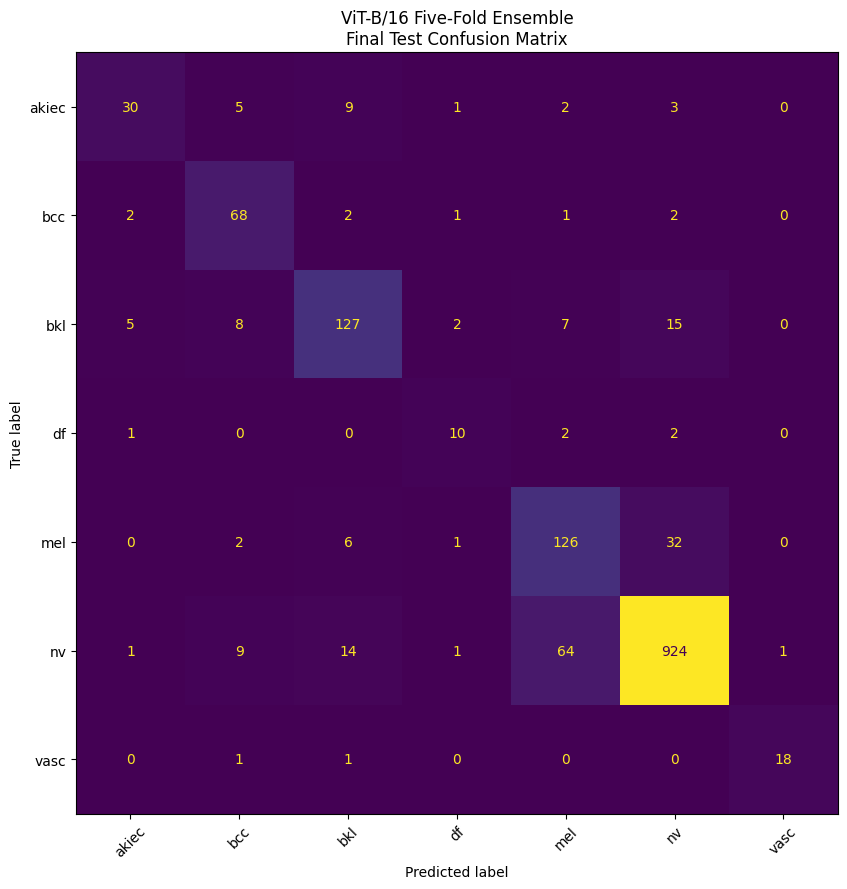

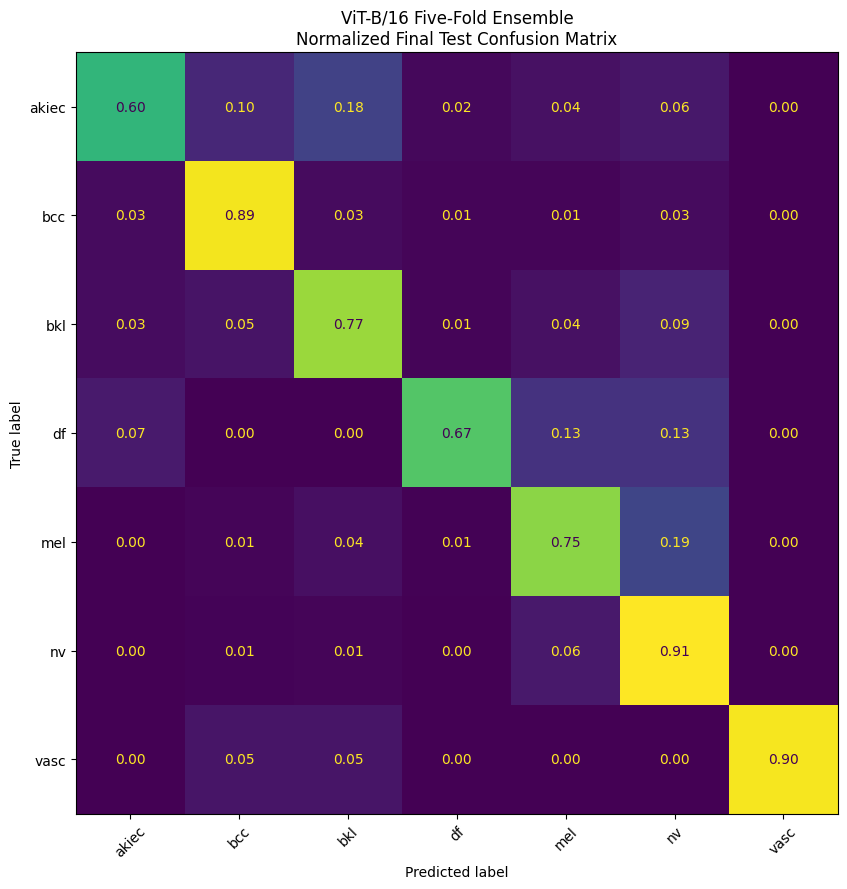

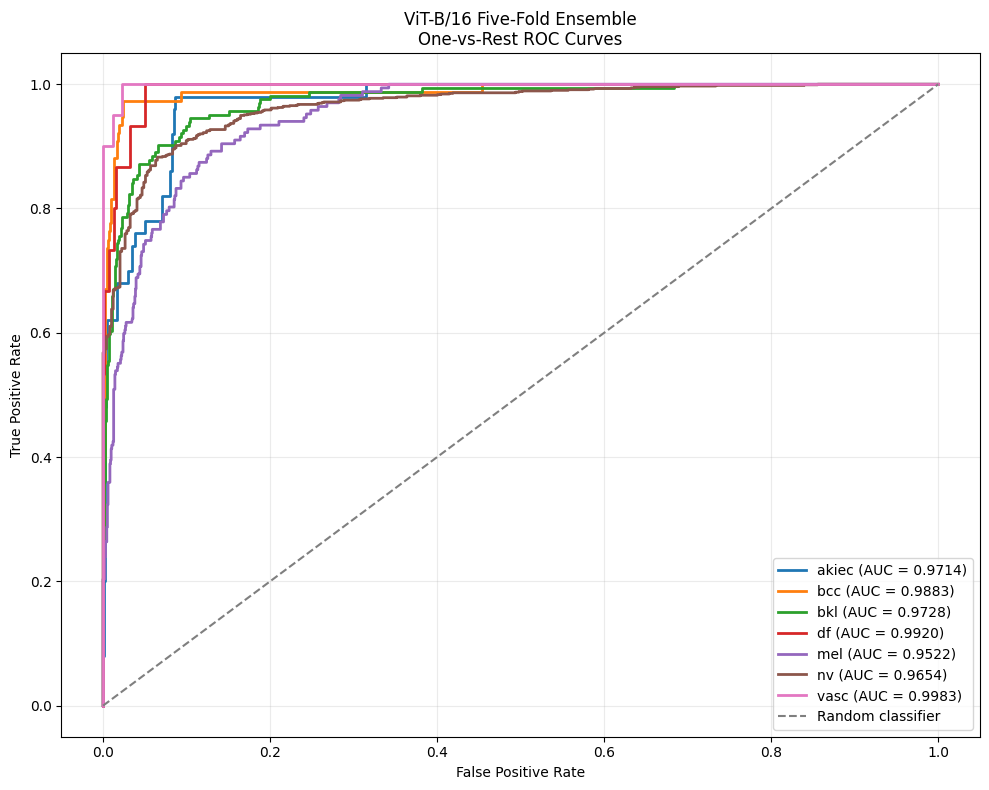


Per-class ROC-AUC:


,label,class_code,diagnosis,roc_auc
0,0,akiec,Actinic Keratoses,0.971442
1,1,bcc,Basal Cell Carcinoma,0.988259
2,2,bkl,Benign Keratosis-like Lesions,0.972802
3,3,df,Dermatofibroma,0.991952
4,4,mel,Melanoma,0.952196
5,5,nv,Melanocytic Nevi,0.965364
6,6,vasc,Vascular Lesions,0.998318



Raw confusion matrix:


,akiec,bcc,bkl,df,mel,nv,vasc
akiec,30,5,9,1,2,3,0
bcc,2,68,2,1,1,2,0
bkl,5,8,127,2,7,15,0
df,1,0,0,10,2,2,0
mel,0,2,6,1,126,32,0
nv,1,9,14,1,64,924,1
vasc,0,1,1,0,0,0,18



Normalized confusion matrix:


,akiec,bcc,bkl,df,mel,nv,vasc
akiec,0.600000,0.100000,0.180000,0.020000,0.040000,0.060000,0.000000
bcc,0.026316,0.894737,0.026316,0.013158,0.013158,0.026316,0.000000
bkl,0.030488,0.048780,0.774390,0.012195,0.042683,0.091463,0.000000
df,0.066667,0.000000,0.000000,0.666667,0.133333,0.133333,0.000000
mel,0.000000,0.011976,0.035928,0.005988,0.754491,0.191617,0.000000
nv,0.000986,0.008876,0.013807,0.000986,0.063116,0.911243,0.000986
vasc,0.000000,0.050000,0.050000,0.000000,0.000000,0.000000,0.900000



Saved evaluation files:
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_classification_report.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_confusion_matrix_raw.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_confusion_matrix_normalized.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_confusion_matrix_raw.png
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_confusion_matrix_normalized.png
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_per_class_roc_auc.csv
/kaggle/working/vit_b16_5fold/final_test_results/ensemble_multiclass_roc_curves.png


In [29]:
from sklearn.metrics import (
    roc_curve,
    auc
)

from sklearn.preprocessing import (
    label_binarize
)


ensemble_predictions_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_predictions.csv"
)

if not ensemble_predictions_path.exists():
    raise FileNotFoundError(
        "Ensemble test predictions were not found."
    )


ensemble_evaluation_dataframe = pd.read_csv(
    ensemble_predictions_path
)


required_columns = [
    "true_label",
    "predicted_label"
] + probability_columns


missing_columns = [
    column
    for column in required_columns
    if column not in ensemble_evaluation_dataframe.columns
]

if missing_columns:
    raise ValueError(
        "Required evaluation columns are missing: "
        f"{missing_columns}"
    )


ensemble_true_labels = (
    ensemble_evaluation_dataframe[
        "true_label"
    ].to_numpy(
        dtype=np.int64
    )
)

ensemble_predicted_labels = (
    ensemble_evaluation_dataframe[
        "predicted_label"
    ].to_numpy(
        dtype=np.int64
    )
)

ensemble_probabilities = (
    ensemble_evaluation_dataframe[
        probability_columns
    ].to_numpy(
        dtype=np.float64
    )
)


classification_report_dictionary = (
    classification_report(
        ensemble_true_labels,
        ensemble_predicted_labels,
        labels=list(
            range(NUM_CLASSES)
        ),
        target_names=[
            idx_to_class[class_index]
            for class_index
            in range(NUM_CLASSES)
        ],
        output_dict=True,
        zero_division=0
    )
)


classification_report_dataframe = (
    pd.DataFrame(
        classification_report_dictionary
    )
    .transpose()
    .reset_index()
    .rename(
        columns={
            "index": "class_or_average"
        }
    )
)


classification_report_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_classification_report.csv"
)

classification_report_dataframe.to_csv(
    classification_report_path,
    index=False
)


print("Ensemble classification report:")
display(
    classification_report_dataframe
)


raw_confusion_matrix = confusion_matrix(
    ensemble_true_labels,
    ensemble_predicted_labels,
    labels=list(
        range(NUM_CLASSES)
    )
)


normalized_confusion_matrix = confusion_matrix(
    ensemble_true_labels,
    ensemble_predicted_labels,
    labels=list(
        range(NUM_CLASSES)
    ),
    normalize="true"
)


raw_confusion_matrix_dataframe = (
    pd.DataFrame(
        raw_confusion_matrix,
        index=class_names,
        columns=class_names
    )
)

normalized_confusion_matrix_dataframe = (
    pd.DataFrame(
        normalized_confusion_matrix,
        index=class_names,
        columns=class_names
    )
)


raw_confusion_matrix_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_raw.csv"
)

normalized_confusion_matrix_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_normalized.csv"
)


raw_confusion_matrix_dataframe.to_csv(
    raw_confusion_matrix_path
)

normalized_confusion_matrix_dataframe.to_csv(
    normalized_confusion_matrix_path
)


raw_confusion_matrix_figure_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_raw.png"
)


plt.figure(
    figsize=(10, 9)
)

raw_confusion_display = (
    ConfusionMatrixDisplay(
        confusion_matrix=raw_confusion_matrix,
        display_labels=class_names
    )
)

raw_confusion_display.plot(
    values_format="d",
    xticks_rotation=45,
    ax=plt.gca(),
    colorbar=False
)

plt.title(
    "ViT-B/16 Five-Fold Ensemble\n"
    "Final Test Confusion Matrix"
)

plt.tight_layout()

plt.savefig(
    raw_confusion_matrix_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


normalized_confusion_matrix_figure_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_normalized.png"
)


plt.figure(
    figsize=(10, 9)
)

normalized_confusion_display = (
    ConfusionMatrixDisplay(
        confusion_matrix=(
            normalized_confusion_matrix
        ),
        display_labels=class_names
    )
)

normalized_confusion_display.plot(
    values_format=".2f",
    xticks_rotation=45,
    ax=plt.gca(),
    colorbar=False
)

plt.title(
    "ViT-B/16 Five-Fold Ensemble\n"
    "Normalized Final Test Confusion Matrix"
)

plt.tight_layout()

plt.savefig(
    normalized_confusion_matrix_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


binarized_true_labels = label_binarize(
    ensemble_true_labels,
    classes=list(
        range(NUM_CLASSES)
    )
)


per_class_auc_records = []


roc_curve_figure_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_multiclass_roc_curves.png"
)


plt.figure(
    figsize=(10, 8)
)


for class_index in range(
    NUM_CLASSES
):
    class_code = idx_to_class[
        class_index
    ]

    false_positive_rate, true_positive_rate, _ = (
        roc_curve(
            binarized_true_labels[
                :,
                class_index
            ],
            ensemble_probabilities[
                :,
                class_index
            ]
        )
    )

    class_auc = auc(
        false_positive_rate,
        true_positive_rate
    )

    per_class_auc_records.append(
        {
            "label": int(class_index),
            "class_code": class_code,
            "diagnosis": diagnosis_full_names[
                class_code
            ],
            "roc_auc": float(class_auc)
        }
    )

    plt.plot(
        false_positive_rate,
        true_positive_rate,
        linewidth=2,
        label=(
            f"{class_code} "
            f"(AUC = {class_auc:.4f})"
        )
    )


plt.plot(
    [0, 1],
    [0, 1],
    linestyle="--",
    linewidth=1.5,
    label="Random classifier"
)

plt.xlabel(
    "False Positive Rate"
)

plt.ylabel(
    "True Positive Rate"
)

plt.title(
    "ViT-B/16 Five-Fold Ensemble\n"
    "One-vs-Rest ROC Curves"
)

plt.legend(
    loc="lower right"
)

plt.grid(
    alpha=0.25
)

plt.tight_layout()

plt.savefig(
    roc_curve_figure_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close()


per_class_auc_dataframe = pd.DataFrame(
    per_class_auc_records
)


per_class_auc_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_per_class_roc_auc.csv"
)

per_class_auc_dataframe.to_csv(
    per_class_auc_path,
    index=False
)


print("\nPer-class ROC-AUC:")
display(per_class_auc_dataframe)


print("\nRaw confusion matrix:")
display(raw_confusion_matrix_dataframe)


print("\nNormalized confusion matrix:")
display(
    normalized_confusion_matrix_dataframe
)


print("\nSaved evaluation files:")

saved_evaluation_files = [
    classification_report_path,
    raw_confusion_matrix_path,
    normalized_confusion_matrix_path,
    raw_confusion_matrix_figure_path,
    normalized_confusion_matrix_figure_path,
    per_class_auc_path,
    roc_curve_figure_path
]

for saved_file in saved_evaluation_files:
    print(saved_file)

Training Curves and Cross-Validation Plot

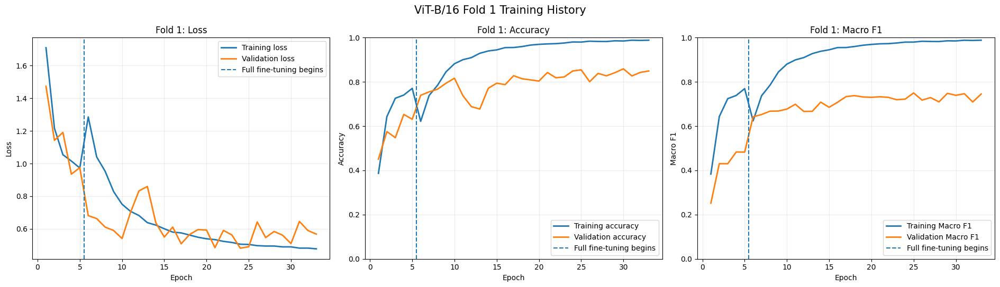

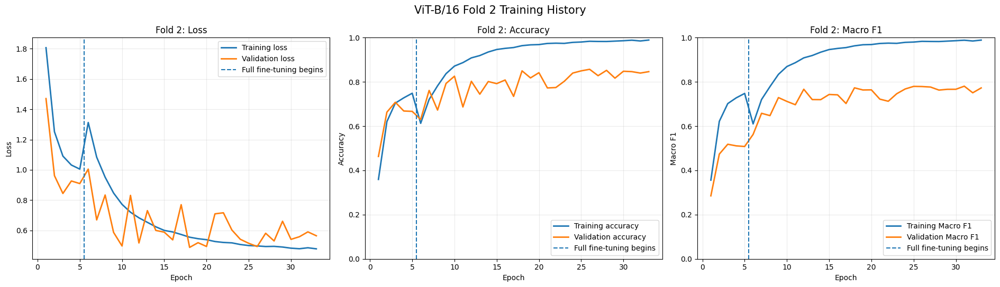

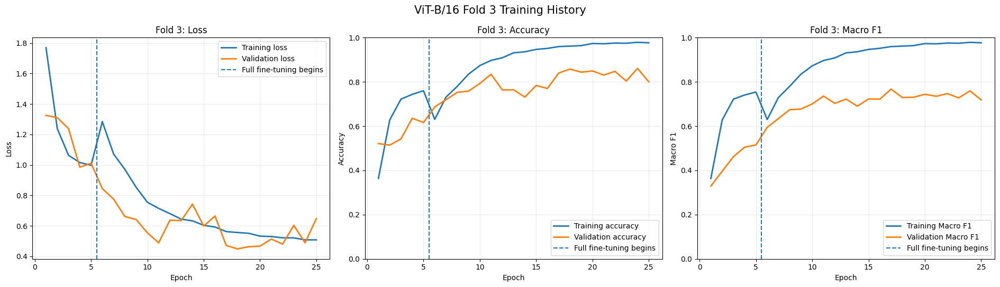

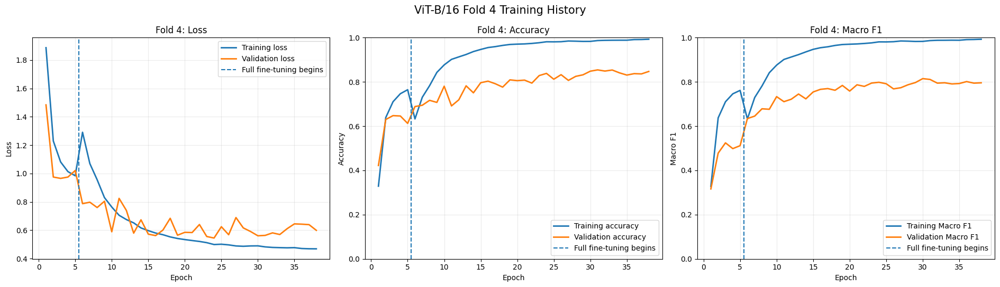

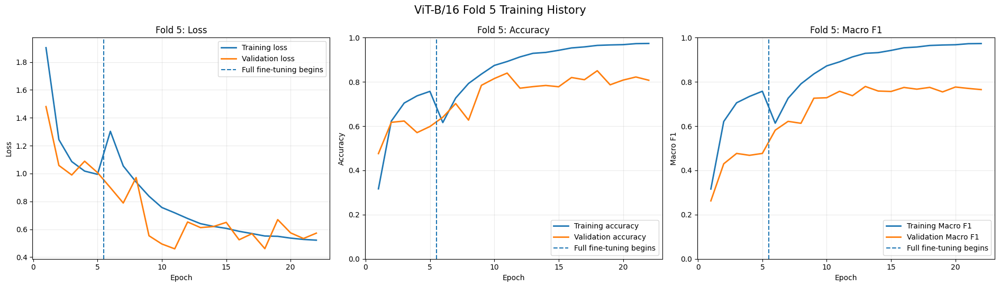

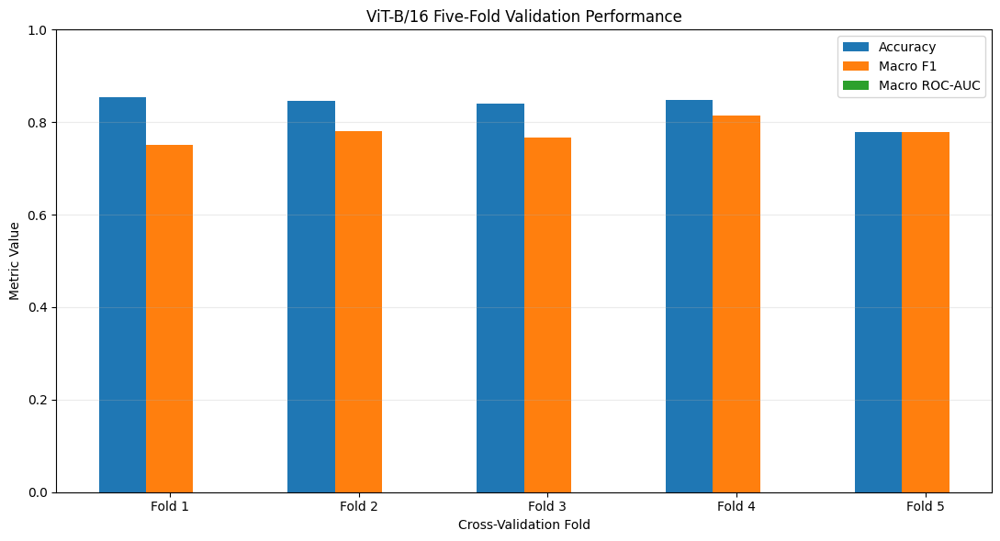

Combined training history saved:
/kaggle/working/vit_b16_5fold/combined_five_fold_training_history.csv

Per-fold training plots:
/kaggle/working/vit_b16_5fold/training_plots/fold_1_training_curves.png
/kaggle/working/vit_b16_5fold/training_plots/fold_2_training_curves.png
/kaggle/working/vit_b16_5fold/training_plots/fold_3_training_curves.png
/kaggle/working/vit_b16_5fold/training_plots/fold_4_training_curves.png
/kaggle/working/vit_b16_5fold/training_plots/fold_5_training_curves.png

Cross-validation comparison plot:
/kaggle/working/vit_b16_5fold/training_plots/five_fold_validation_metrics.png

Head training ends after epoch: 5
The vertical dashed line marks the beginning of full model fine-tuning.


In [30]:
TRAINING_PLOTS_DIR = (
    OUTPUT_DIR / "training_plots"
)

TRAINING_PLOTS_DIR.mkdir(
    parents=True,
    exist_ok=True
)


all_fold_history_frames = []
saved_training_plot_paths = []


required_history_columns = {
    "epoch",
    "train_loss",
    "validation_loss",
    "train_accuracy",
    "validation_accuracy",
    "train_macro_f1",
    "validation_macro_f1"
}


for fold_number in range(
    1,
    K_FOLDS + 1
):
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    history_path = fold_paths[
        "history"
    ]

    if not history_path.exists():
        raise FileNotFoundError(
            f"Training history is missing "
            f"for fold {fold_number}."
        )

    fold_history = pd.read_csv(
        history_path
    )

    missing_history_columns = (
        required_history_columns
        - set(fold_history.columns)
    )

    if missing_history_columns:
        raise ValueError(
            f"Fold {fold_number} history is "
            f"missing columns: "
            f"{missing_history_columns}"
        )

    fold_history = (
        fold_history
        .sort_values("epoch")
        .reset_index(drop=True)
    )

    fold_history["fold"] = fold_number

    all_fold_history_frames.append(
        fold_history
    )


    figure, axes = plt.subplots(
        nrows=1,
        ncols=3,
        figsize=(19, 5.5)
    )


    axes[0].plot(
        fold_history["epoch"],
        fold_history["train_loss"],
        linewidth=2,
        label="Training loss"
    )

    axes[0].plot(
        fold_history["epoch"],
        fold_history["validation_loss"],
        linewidth=2,
        label="Validation loss"
    )

    axes[0].axvline(
        x=HEAD_EPOCHS + 0.5,
        linestyle="--",
        linewidth=1.5,
        label="Full fine-tuning begins"
    )

    axes[0].set_title(
        f"Fold {fold_number}: Loss"
    )

    axes[0].set_xlabel("Epoch")
    axes[0].set_ylabel("Loss")
    axes[0].grid(alpha=0.25)
    axes[0].legend()


    axes[1].plot(
        fold_history["epoch"],
        fold_history["train_accuracy"],
        linewidth=2,
        label="Training accuracy"
    )

    axes[1].plot(
        fold_history["epoch"],
        fold_history[
            "validation_accuracy"
        ],
        linewidth=2,
        label="Validation accuracy"
    )

    axes[1].axvline(
        x=HEAD_EPOCHS + 0.5,
        linestyle="--",
        linewidth=1.5,
        label="Full fine-tuning begins"
    )

    axes[1].set_title(
        f"Fold {fold_number}: Accuracy"
    )

    axes[1].set_xlabel("Epoch")
    axes[1].set_ylabel("Accuracy")
    axes[1].set_ylim(0, 1)
    axes[1].grid(alpha=0.25)
    axes[1].legend()


    axes[2].plot(
        fold_history["epoch"],
        fold_history["train_macro_f1"],
        linewidth=2,
        label="Training Macro F1"
    )

    axes[2].plot(
        fold_history["epoch"],
        fold_history[
            "validation_macro_f1"
        ],
        linewidth=2,
        label="Validation Macro F1"
    )

    axes[2].axvline(
        x=HEAD_EPOCHS + 0.5,
        linestyle="--",
        linewidth=1.5,
        label="Full fine-tuning begins"
    )

    axes[2].set_title(
        f"Fold {fold_number}: Macro F1"
    )

    axes[2].set_xlabel("Epoch")
    axes[2].set_ylabel("Macro F1")
    axes[2].set_ylim(0, 1)
    axes[2].grid(alpha=0.25)
    axes[2].legend()


    figure.suptitle(
        f"ViT-B/16 Fold {fold_number} "
        "Training History",
        fontsize=15
    )

    figure.tight_layout()

    fold_plot_path = (
        TRAINING_PLOTS_DIR
        / (
            f"fold_{fold_number}_"
            "training_curves.png"
        )
    )

    figure.savefig(
        fold_plot_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close(figure)

    saved_training_plot_paths.append(
        fold_plot_path
    )


combined_training_history = pd.concat(
    all_fold_history_frames,
    ignore_index=True
)


combined_training_history_path = (
    OUTPUT_DIR
    / "combined_five_fold_training_history.csv"
)

combined_training_history.to_csv(
    combined_training_history_path,
    index=False
)


cross_validation_metrics_path = (
    OUTPUT_DIR
    / "cross_validation_fold_metrics.csv"
)

if not cross_validation_metrics_path.exists():
    raise FileNotFoundError(
        "Cross-validation fold metrics were not found."
    )


cross_validation_plot_data = pd.read_csv(
    cross_validation_metrics_path
).sort_values(
    "fold"
).reset_index(
    drop=True
)


cross_validation_plot_path = (
    TRAINING_PLOTS_DIR
    / "five_fold_validation_metrics.png"
)


figure = plt.figure(
    figsize=(11, 6)
)

x_positions = np.arange(
    len(cross_validation_plot_data)
)

bar_width = 0.25


plt.bar(
    x_positions - bar_width,
    cross_validation_plot_data[
        "accuracy"
    ],
    width=bar_width,
    label="Accuracy"
)

plt.bar(
    x_positions,
    cross_validation_plot_data[
        "macro_f1"
    ],
    width=bar_width,
    label="Macro F1"
)

plt.bar(
    x_positions + bar_width,
    cross_validation_plot_data[
        "macro_roc_auc"
    ],
    width=bar_width,
    label="Macro ROC-AUC"
)


plt.xticks(
    x_positions,
    [
        f"Fold {fold_number}"
        for fold_number
        in cross_validation_plot_data[
            "fold"
        ]
    ]
)

plt.ylim(0, 1)

plt.xlabel("Cross-Validation Fold")
plt.ylabel("Metric Value")

plt.title(
    "ViT-B/16 Five-Fold "
    "Validation Performance"
)

plt.grid(
    axis="y",
    alpha=0.25
)

plt.legend()
plt.tight_layout()

plt.savefig(
    cross_validation_plot_path,
    dpi=300,
    bbox_inches="tight"
)

plt.show()
plt.close(figure)


print("Combined training history saved:")
print(combined_training_history_path)

print("\nPer-fold training plots:")

for plot_path in saved_training_plot_paths:
    print(plot_path)

print("\nCross-validation comparison plot:")
print(cross_validation_plot_path)

print(
    "\nHead training ends after epoch:",
    HEAD_EPOCHS
)

print(
    "The vertical dashed line marks the beginning "
    "of full model fine-tuning."
)

Create Final Performance Summary

In [31]:
FINAL_SUMMARY_DIR = (
    OUTPUT_DIR / "final_summary"
)

FINAL_SUMMARY_DIR.mkdir(
    parents=True,
    exist_ok=True
)


cv_fold_metrics_path = (
    OUTPUT_DIR
    / "cross_validation_fold_metrics.csv"
)

cv_mean_std_path = (
    OUTPUT_DIR
    / "cross_validation_mean_std.csv"
)

completed_folds_path = (
    OUTPUT_DIR
    / "completed_folds_summary.csv"
)

per_fold_test_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "per_fold_test_metrics.csv"
)

ensemble_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_metrics.json"
)

best_fold_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "best_validation_fold_test_metrics.json"
)


required_summary_files = [
    cv_fold_metrics_path,
    cv_mean_std_path,
    completed_folds_path,
    per_fold_test_metrics_path,
    ensemble_metrics_path,
    best_fold_metrics_path
]


missing_summary_files = [
    str(file_path)
    for file_path in required_summary_files
    if not file_path.exists()
]

if missing_summary_files:
    raise FileNotFoundError(
        "Final summary files are missing: "
        f"{missing_summary_files}"
    )


cv_fold_metrics = pd.read_csv(
    cv_fold_metrics_path
)

cv_mean_std = pd.read_csv(
    cv_mean_std_path
)

completed_folds = pd.read_csv(
    completed_folds_path
)

per_fold_test_metrics = pd.read_csv(
    per_fold_test_metrics_path
)


with open(
    ensemble_metrics_path,
    "r"
) as file:
    ensemble_metrics = json.load(file)


with open(
    best_fold_metrics_path,
    "r"
) as file:
    best_fold_metrics = json.load(file)


metric_names = [
    "accuracy",
    "macro_precision",
    "macro_recall",
    "macro_f1",
    "weighted_f1",
    "macro_roc_auc"
]


cv_mean_values = (
    cv_fold_metrics[
        metric_names
    ].mean()
)

cv_std_values = (
    cv_fold_metrics[
        metric_names
    ].std(ddof=1)
)


best_fold_number = int(
    best_fold_metrics["fold"]
)

best_fold_epoch = int(
    best_fold_metrics[
        "best_model_epoch"
    ]
)


final_performance_summary = pd.DataFrame(
    [
        {
            "evaluation": (
                "Five-fold validation mean"
            ),
            "selected_fold": np.nan,
            "selected_epoch": np.nan,
            "accuracy": float(
                cv_mean_values["accuracy"]
            ),
            "macro_precision": float(
                cv_mean_values[
                    "macro_precision"
                ]
            ),
            "macro_recall": float(
                cv_mean_values[
                    "macro_recall"
                ]
            ),
            "macro_f1": float(
                cv_mean_values["macro_f1"]
            ),
            "weighted_f1": float(
                cv_mean_values["weighted_f1"]
            ),
            "macro_roc_auc": float(
                cv_mean_values[
                    "macro_roc_auc"
                ]
            )
        },
        {
            "evaluation": (
                "Five-fold validation standard deviation"
            ),
            "selected_fold": np.nan,
            "selected_epoch": np.nan,
            "accuracy": float(
                cv_std_values["accuracy"]
            ),
            "macro_precision": float(
                cv_std_values[
                    "macro_precision"
                ]
            ),
            "macro_recall": float(
                cv_std_values[
                    "macro_recall"
                ]
            ),
            "macro_f1": float(
                cv_std_values["macro_f1"]
            ),
            "weighted_f1": float(
                cv_std_values["weighted_f1"]
            ),
            "macro_roc_auc": float(
                cv_std_values[
                    "macro_roc_auc"
                ]
            )
        },
        {
            "evaluation": (
                "Best validation fold final test"
            ),
            "selected_fold": best_fold_number,
            "selected_epoch": best_fold_epoch,
            "accuracy": float(
                best_fold_metrics[
                    "test_accuracy"
                ]
            ),
            "macro_precision": float(
                best_fold_metrics[
                    "test_macro_precision"
                ]
            ),
            "macro_recall": float(
                best_fold_metrics[
                    "test_macro_recall"
                ]
            ),
            "macro_f1": float(
                best_fold_metrics[
                    "test_macro_f1"
                ]
            ),
            "weighted_f1": float(
                best_fold_metrics[
                    "test_weighted_f1"
                ]
            ),
            "macro_roc_auc": float(
                best_fold_metrics[
                    "test_macro_roc_auc"
                ]
            )
        },
        {
            "evaluation": (
                "Five-fold probability ensemble final test"
            ),
            "selected_fold": np.nan,
            "selected_epoch": np.nan,
            "accuracy": float(
                ensemble_metrics["accuracy"]
            ),
            "macro_precision": float(
                ensemble_metrics[
                    "macro_precision"
                ]
            ),
            "macro_recall": float(
                ensemble_metrics[
                    "macro_recall"
                ]
            ),
            "macro_f1": float(
                ensemble_metrics["macro_f1"]
            ),
            "weighted_f1": float(
                ensemble_metrics[
                    "weighted_f1"
                ]
            ),
            "macro_roc_auc": float(
                ensemble_metrics[
                    "macro_roc_auc"
                ]
            )
        }
    ]
)


percentage_summary = (
    final_performance_summary.copy()
)

for metric_name in metric_names:
    percentage_summary[
        metric_name
    ] = (
        percentage_summary[
            metric_name
        ] * 100
    )


early_stopped_fold_count = int(
    completed_folds[
        "stopped_early"
    ].astype(bool).sum()
)

average_completed_epochs = float(
    completed_folds[
        "completed_epochs"
    ].mean()
)


experiment_summary = {
    "experiment_name": EXPERIMENT_NAME,
    "architecture": "ViT-B/16",
    "model_name": MODEL_NAME,
    "dataset": "HAM10000",
    "number_of_classes": int(
        NUM_CLASSES
    ),
    "number_of_folds": int(
        K_FOLDS
    ),
    "development_images": int(
        len(development_dataframe)
    ),
    "final_test_images": int(
        len(final_test_dataframe)
    ),
    "head_training_epochs": int(
        HEAD_EPOCHS
    ),
    "maximum_epochs_per_fold": int(
        TOTAL_EPOCHS
    ),
    "early_stopping_patience": int(
        EARLY_STOPPING_PATIENCE
    ),
    "early_stopped_folds": int(
        early_stopped_fold_count
    ),
    "average_completed_epochs": float(
        average_completed_epochs
    ),
    "best_validation_fold": int(
        best_fold_number
    ),
    "best_validation_fold_epoch": int(
        best_fold_epoch
    ),
    "cross_validation_macro_f1_mean": float(
        cv_mean_values["macro_f1"]
    ),
    "cross_validation_macro_f1_std": float(
        cv_std_values["macro_f1"]
    ),
    "best_fold_test_accuracy": float(
        best_fold_metrics[
            "test_accuracy"
        ]
    ),
    "best_fold_test_macro_f1": float(
        best_fold_metrics[
            "test_macro_f1"
        ]
    ),
    "ensemble_test_accuracy": float(
        ensemble_metrics["accuracy"]
    ),
    "ensemble_test_macro_f1": float(
        ensemble_metrics["macro_f1"]
    ),
    "ensemble_test_macro_roc_auc": float(
        ensemble_metrics[
            "macro_roc_auc"
        ]
    )
}


final_performance_summary_path = (
    FINAL_SUMMARY_DIR
    / "final_performance_summary.csv"
)

percentage_summary_path = (
    FINAL_SUMMARY_DIR
    / "final_performance_summary_percentage.csv"
)

experiment_summary_path = (
    FINAL_SUMMARY_DIR
    / "experiment_summary.json"
)

report_text_path = (
    FINAL_SUMMARY_DIR
    / "report_ready_results.txt"
)


final_performance_summary.to_csv(
    final_performance_summary_path,
    index=False
)

percentage_summary.to_csv(
    percentage_summary_path,
    index=False
)

with open(
    experiment_summary_path,
    "w"
) as file:
    json.dump(
        experiment_summary,
        file,
        indent=4
    )


report_text = (
    "ViT-B/16 HAM10000 Five-Fold Results\n"
    "====================================\n\n"
    f"Development images: "
    f"{len(development_dataframe)}\n"
    f"Untouched final test images: "
    f"{len(final_test_dataframe)}\n"
    f"Number of folds: {K_FOLDS}\n"
    f"Early-stopped folds: "
    f"{early_stopped_fold_count}\n\n"
    f"Cross-validation Macro F1: "
    f"{cv_mean_values['macro_f1']:.4f} ± "
    f"{cv_std_values['macro_f1']:.4f}\n"
    f"Cross-validation Accuracy: "
    f"{cv_mean_values['accuracy']:.4f} ± "
    f"{cv_std_values['accuracy']:.4f}\n\n"
    f"Best validation fold: "
    f"Fold {best_fold_number}\n"
    f"Best fold model epoch: "
    f"{best_fold_epoch}\n"
    f"Best fold final test accuracy: "
    f"{best_fold_metrics['test_accuracy']:.4f}\n"
    f"Best fold final test Macro F1: "
    f"{best_fold_metrics['test_macro_f1']:.4f}\n\n"
    f"Five-fold ensemble final test accuracy: "
    f"{ensemble_metrics['accuracy']:.4f}\n"
    f"Five-fold ensemble final test Macro F1: "
    f"{ensemble_metrics['macro_f1']:.4f}\n"
    f"Five-fold ensemble final test Macro ROC-AUC: "
    f"{ensemble_metrics['macro_roc_auc']:.4f}\n"
)


with open(
    report_text_path,
    "w"
) as file:
    file.write(report_text)


print("Final performance summary:")
display(final_performance_summary)

print("\nPerformance values as percentages:")
display(percentage_summary)

print("\nReport-ready result:")
print(report_text)

print("Saved files:")
print(final_performance_summary_path)
print(percentage_summary_path)
print(experiment_summary_path)
print(report_text_path)

Final performance summary:


,evaluation,selected_fold,selected_epoch,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,macro_roc_auc
0,Five-fold validation mean,NaN,NaN,0.833495,0.774640,0.797033,0.778402,0.841226,NaN
1,Five-fold validation standard deviation,NaN,NaN,0.031147,0.027430,0.034291,0.023771,0.023000,NaN
2,Best validation fold final test,4.0,30.0,0.849270,0.762978,0.747186,0.752236,0.851257,NaN
3,Five-fold probability ensemble final test,NaN,NaN,0.865206,0.777153,0.785932,0.777735,0.867676,NaN



Performance values as percentages:


,evaluation,selected_fold,selected_epoch,accuracy,macro_precision,macro_recall,macro_f1,weighted_f1,macro_roc_auc
0,Five-fold validation mean,NaN,NaN,83.349517,77.464035,79.703276,77.840247,84.122647,NaN
1,Five-fold validation standard deviation,NaN,NaN,3.114749,2.742968,3.429123,2.377125,2.300002,NaN
2,Best validation fold final test,4.0,30.0,84.926959,76.297836,74.718550,75.223578,85.125744,NaN
3,Five-fold probability ensemble final test,NaN,NaN,86.520584,77.715311,78.593248,77.773495,86.767603,NaN



Report-ready result:
ViT-B/16 HAM10000 Five-Fold Results

Development images: 8509
Untouched final test images: 1506
Number of folds: 5
Early-stopped folds: 5

Cross-validation Macro F1: 0.7784 ± 0.0238
Cross-validation Accuracy: 0.8335 ± 0.0311

Best validation fold: Fold 4
Best fold model epoch: 30
Best fold final test accuracy: 0.8493
Best fold final test Macro F1: 0.7522

Five-fold ensemble final test accuracy: 0.8652
Five-fold ensemble final test Macro F1: 0.7777
Five-fold ensemble final test Macro ROC-AUC: nan

Saved files:
/kaggle/working/vit_b16_5fold/final_summary/final_performance_summary.csv
/kaggle/working/vit_b16_5fold/final_summary/final_performance_summary_percentage.csv
/kaggle/working/vit_b16_5fold/final_summary/experiment_summary.json
/kaggle/working/vit_b16_5fold/final_summary/report_ready_results.txt


Prepare Attention Rollout Explainability

In [32]:
import torch.nn.functional as F


EXPLAINABILITY_DIR = (
    OUTPUT_DIR / "explainability"
)

EXPLAINABILITY_DIR.mkdir(
    parents=True,
    exist_ok=True
)


best_fold_metrics_path = (
    FINAL_TEST_RESULTS_DIR
    / "best_validation_fold_test_metrics.json"
)

if not best_fold_metrics_path.exists():
    raise FileNotFoundError(
        "Best validation fold metrics were not found."
    )


with open(
    best_fold_metrics_path,
    "r"
) as file:
    explainability_best_fold_metrics = json.load(
        file
    )


EXPLAINABILITY_FOLD = int(
    explainability_best_fold_metrics[
        "fold"
    ]
)


explainability_fold_paths = get_fold_paths(
    fold_number=EXPLAINABILITY_FOLD
)

explainability_checkpoint_path = (
    explainability_fold_paths[
        "best_model"
    ]
)


if not explainability_checkpoint_path.exists():
    raise FileNotFoundError(
        "The best model checkpoint for "
        f"Fold {EXPLAINABILITY_FOLD} is missing."
    )


explainability_checkpoint = load_torch_file(
    explainability_checkpoint_path
)


explainability_model = create_vit_model()

explainability_model.load_state_dict(
    explainability_checkpoint[
        "model_state_dict"
    ]
)

explainability_model = (
    explainability_model.to(DEVICE)
)

explainability_model.eval()


if not hasattr(
    explainability_model.network,
    "blocks"
):
    raise AttributeError(
        "Transformer blocks were not found "
        "inside the ViT model."
    )


for transformer_block in (
    explainability_model.network.blocks
):
    if hasattr(
        transformer_block.attn,
        "fused_attn"
    ):
        transformer_block.attn.fused_attn = False


def denormalize_image(
    normalized_image
):
    mean_tensor = torch.tensor(
        IMAGENET_MEAN,
        dtype=normalized_image.dtype,
        device=normalized_image.device
    ).view(
        3,
        1,
        1
    )

    standard_deviation_tensor = torch.tensor(
        IMAGENET_STD,
        dtype=normalized_image.dtype,
        device=normalized_image.device
    ).view(
        3,
        1,
        1
    )

    image = (
        normalized_image
        * standard_deviation_tensor
        + mean_tensor
    )

    return image.clamp(
        0,
        1
    )


def generate_attention_rollout(
    model,
    input_tensor
):
    captured_attention_matrices = []
    hook_handles = []


    def capture_attention(
        module,
        module_input,
        module_output
    ):
        captured_attention_matrices.append(
            module_output.detach().float().cpu()
        )


    for transformer_block in (
        model.network.blocks
    ):
        hook_handle = (
            transformer_block
            .attn
            .attn_drop
            .register_forward_hook(
                capture_attention
            )
        )

        hook_handles.append(
            hook_handle
        )


    try:
        model.eval()

        with torch.no_grad():
            logits = model(
                input_tensor
            )

            probabilities = torch.softmax(
                logits,
                dim=1
            )

    finally:
        for hook_handle in hook_handles:
            hook_handle.remove()


    if not captured_attention_matrices:
        raise RuntimeError(
            "No attention matrices were captured."
        )


    batch_size = input_tensor.size(0)

    joint_attention = None


    for layer_attention in (
        captured_attention_matrices
    ):
        if layer_attention.ndim != 4:
            raise ValueError(
                "Unexpected attention matrix shape: "
                f"{tuple(layer_attention.shape)}"
            )


        averaged_attention = (
            layer_attention.mean(
                dim=1
            )
        )


        token_count = averaged_attention.size(
            -1
        )

        identity_matrix = torch.eye(
            token_count,
            dtype=averaged_attention.dtype
        ).unsqueeze(
            0
        ).expand(
            batch_size,
            -1,
            -1
        )


        attention_with_residual = (
            averaged_attention
            + identity_matrix
        )


        attention_with_residual = (
            attention_with_residual
            / attention_with_residual.sum(
                dim=-1,
                keepdim=True
            ).clamp_min(
                1e-12
            )
        )


        if joint_attention is None:
            joint_attention = (
                attention_with_residual
            )
        else:
            joint_attention = torch.bmm(
                attention_with_residual,
                joint_attention
            )


    class_token_attention = (
        joint_attention[
            :,
            0,
            1:
        ]
    )


    number_of_patches = (
        class_token_attention.size(
            -1
        )
    )

    patch_grid_size = int(
        np.sqrt(
            number_of_patches
        )
    )


    if (
        patch_grid_size
        * patch_grid_size
        != number_of_patches
    ):
        raise ValueError(
            "The number of image patches does not "
            "form a square grid."
        )


    attention_maps = (
        class_token_attention.reshape(
            batch_size,
            1,
            patch_grid_size,
            patch_grid_size
        )
    )


    attention_maps = F.interpolate(
        attention_maps,
        size=(
            IMAGE_SIZE,
            IMAGE_SIZE
        ),
        mode="bilinear",
        align_corners=False
    )


    flattened_attention_maps = (
        attention_maps.flatten(
            start_dim=1
        )
    )


    attention_minimum = (
        flattened_attention_maps.min(
            dim=1,
            keepdim=True
        ).values
    )

    attention_maximum = (
        flattened_attention_maps.max(
            dim=1,
            keepdim=True
        ).values
    )


    normalized_attention_maps = (
        (
            flattened_attention_maps
            - attention_minimum
        )
        / (
            attention_maximum
            - attention_minimum
        ).clamp_min(
            1e-12
        )
    )


    normalized_attention_maps = (
        normalized_attention_maps.reshape(
            batch_size,
            IMAGE_SIZE,
            IMAGE_SIZE
        )
    )


    predicted_labels = probabilities.argmax(
        dim=1
    )


    return {
        "logits": logits.detach().cpu(),
        "probabilities": (
            probabilities.detach().cpu()
        ),
        "predicted_labels": (
            predicted_labels.detach().cpu()
        ),
        "attention_maps": (
            normalized_attention_maps.cpu()
        ),
        "layer_attention_matrices": (
            captured_attention_matrices
        )
    }


sample_images, sample_labels, sample_image_ids = next(
    iter(final_test_loader)
)


sample_attention_result = (
    generate_attention_rollout(
        model=explainability_model,
        input_tensor=sample_images[
            :1
        ].to(
            DEVICE
        )
    )
)


sample_true_label = int(
    sample_labels[0].item()
)

sample_predicted_label = int(
    sample_attention_result[
        "predicted_labels"
    ][0].item()
)

sample_prediction_confidence = float(
    sample_attention_result[
        "probabilities"
    ][
        0,
        sample_predicted_label
    ].item()
)


print("Attention rollout setup completed.")

print(
    "\nExplainability model fold:",
    EXPLAINABILITY_FOLD
)

print(
    "Best model epoch:",
    explainability_checkpoint[
        "epoch"
    ]
)

print(
    "Transformer layers captured:",
    len(
        sample_attention_result[
            "layer_attention_matrices"
        ]
    )
)

print(
    "Attention map shape:",
    tuple(
        sample_attention_result[
            "attention_maps"
        ].shape
    )
)

print(
    "\nSanity-check image:",
    sample_image_ids[0]
)

print(
    "True class:",
    idx_to_class[
        sample_true_label
    ]
)

print(
    "Predicted class:",
    idx_to_class[
        sample_predicted_label
    ]
)

print(
    "Prediction confidence:",
    f"{sample_prediction_confidence:.4f}"
)

print(
    "\nExplainability output directory:"
)

print(EXPLAINABILITY_DIR)

Attention rollout setup completed.

Explainability model fold: 4
Best model epoch: 30
Transformer layers captured: 12
Attention map shape: (1, 224, 224)

Sanity-check image: ISIC_0027828
True class: bkl
Predicted class: bkl
Prediction confidence: 0.4997

Explainability output directory:
/kaggle/working/vit_b16_5fold/explainability


Restore image_path

In [34]:
PATH_COLUMN_CANDIDATES = [
    "image_path",
    "path",
    "file_path",
    "filepath"
]


source_dataframe = None
source_column = None
source_name = None


for dataframe_name, dataframe in [
    ("final_test_dataframe", final_test_dataframe),
    ("metadata_dataframe", metadata_dataframe)
]:
    for column_name in PATH_COLUMN_CANDIDATES:
        if column_name in dataframe.columns:
            source_dataframe = dataframe
            source_column = column_name
            source_name = dataframe_name
            break

    if source_column is not None:
        break


final_test_dataframe = (
    final_test_dataframe.copy()
)


if source_dataframe is not None:
    path_lookup = (
        source_dataframe[
            [
                "image_id",
                source_column
            ]
        ]
        .dropna(
            subset=[
                "image_id",
                source_column
            ]
        )
        .drop_duplicates(
            subset=["image_id"]
        )
        .assign(
            image_id=lambda dataframe: (
                dataframe["image_id"].astype(str)
            )
        )
        .set_index("image_id")[
            source_column
        ]
        .astype(str)
        .to_dict()
    )

    print(
        "Image paths recovered from:",
        source_name
    )

    print(
        "Source path column:",
        source_column
    )

else:
    print(
        "No existing path column was found. "
        "Scanning Kaggle input directories."
    )

    supported_extensions = {
        ".jpg",
        ".jpeg",
        ".png"
    }

    discovered_image_paths = [
        file_path
        for file_path in Path(
            "/kaggle/input"
        ).rglob("*")
        if (
            file_path.is_file()
            and file_path.suffix.lower()
            in supported_extensions
        )
    ]

    if not discovered_image_paths:
        raise FileNotFoundError(
            "No image files were found inside "
            "/kaggle/input."
        )


    def image_path_priority(file_path):
        path_text = str(file_path).lower()

        preferred_directory = (
            "ham10000_images_part_1"
            in path_text
            or
            "ham10000_images_part_2"
            in path_text
        )

        return (
            0 if preferred_directory else 1,
            len(path_text),
            path_text
        )


    discovered_image_paths = sorted(
        discovered_image_paths,
        key=image_path_priority
    )

    path_lookup = {}

    for file_path in discovered_image_paths:
        image_id = file_path.stem

        if image_id not in path_lookup:
            path_lookup[image_id] = str(
                file_path
            )

    print(
        "Image files discovered:",
        len(discovered_image_paths)
    )

    print(
        "Unique image IDs mapped:",
        len(path_lookup)
    )


final_test_dataframe[
    "image_path"
] = (
    final_test_dataframe[
        "image_id"
    ]
    .astype(str)
    .map(path_lookup)
)


missing_path_mask = (
    final_test_dataframe[
        "image_path"
    ].isna()
)


missing_image_ids = (
    final_test_dataframe.loc[
        missing_path_mask,
        "image_id"
    ]
    .astype(str)
    .tolist()
)


if missing_image_ids:
    raise FileNotFoundError(
        "Image paths could not be recovered for "
        f"{len(missing_image_ids)} images. "
        f"Examples: {missing_image_ids[:10]}"
    )


nonexistent_image_paths = [
    image_path
    for image_path in final_test_dataframe[
        "image_path"
    ].astype(str)
    if not Path(image_path).exists()
]


if nonexistent_image_paths:
    raise FileNotFoundError(
        "Some recovered image paths do not exist. "
        f"Examples: {nonexistent_image_paths[:5]}"
    )


print("\nImage path repair completed.")

print(
    "Final test images:",
    len(final_test_dataframe)
)

print(
    "Valid image paths:",
    final_test_dataframe[
        "image_path"
    ].notna().sum()
)

print(
    "Missing image paths:",
    int(
        final_test_dataframe[
            "image_path"
        ].isna().sum()
    )
)

print("\nAvailable final test columns:")
print(
    final_test_dataframe.columns.tolist()
)

display(
    final_test_dataframe[
        [
            "image_id",
            "image_path"
        ]
    ].head()
)

Image paths recovered from: final_test_dataframe
Source path column: path

Image path repair completed.
Final test images: 1506
Valid image paths: 1506
Missing image paths: 0

Available final test columns:
['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization', 'path', 'label', 'image_path']


,image_id,image_path
0,ISIC_0027828,/kaggle/input/datasets/kmader/skin-cancer-mnis...
1,ISIC_0029291,/kaggle/input/datasets/kmader/skin-cancer-mnis...
2,ISIC_0030698,/kaggle/input/datasets/kmader/skin-cancer-mnis...
3,ISIC_0025567,/kaggle/input/datasets/kmader/skin-cancer-mnis...
4,ISIC_0031159,/kaggle/input/datasets/kmader/skin-cancer-mnis...


Attention Rollout Visualization for Seven Classes

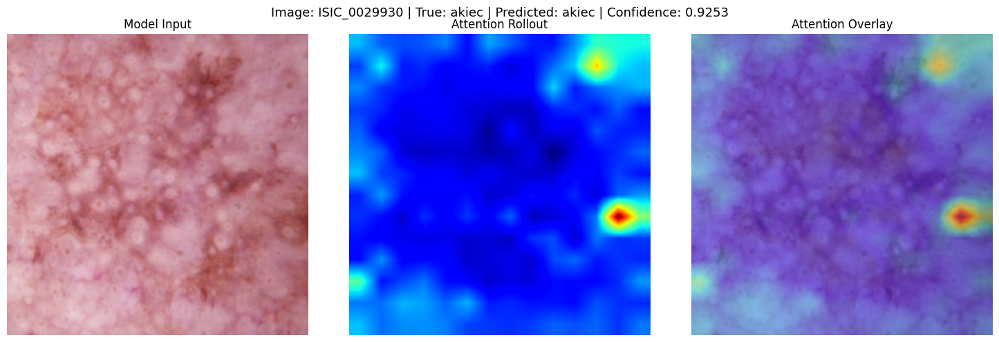

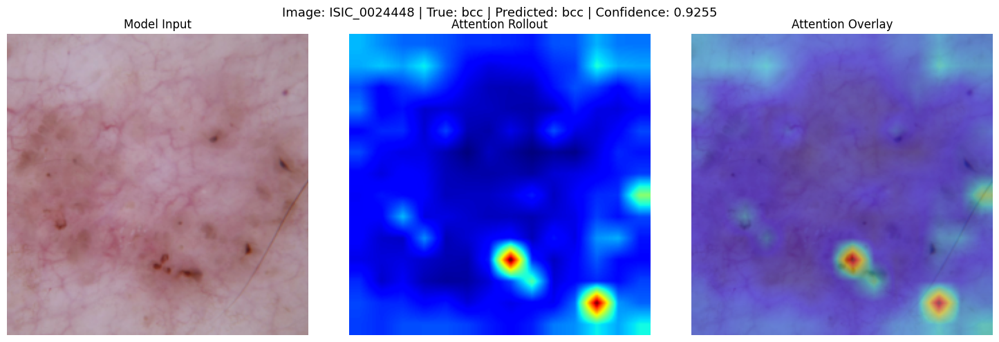

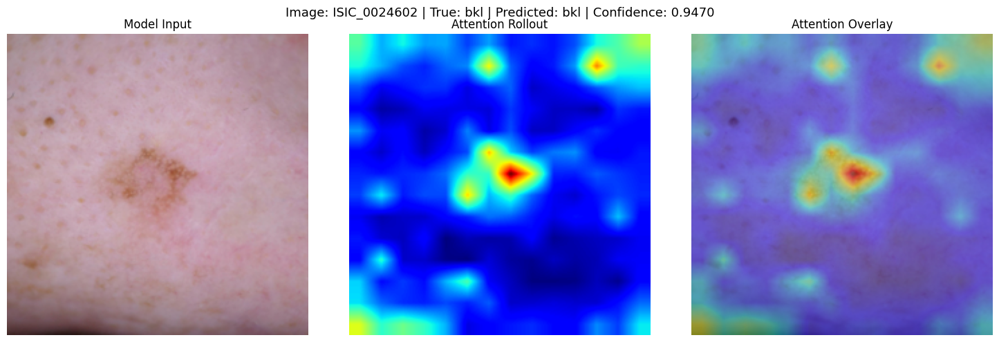

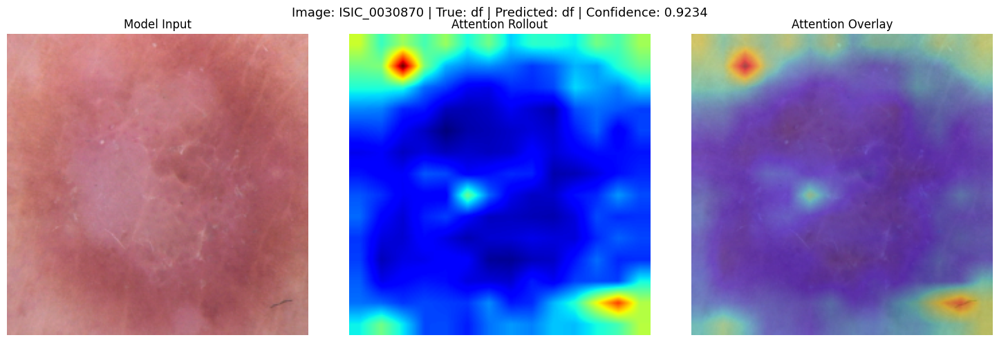

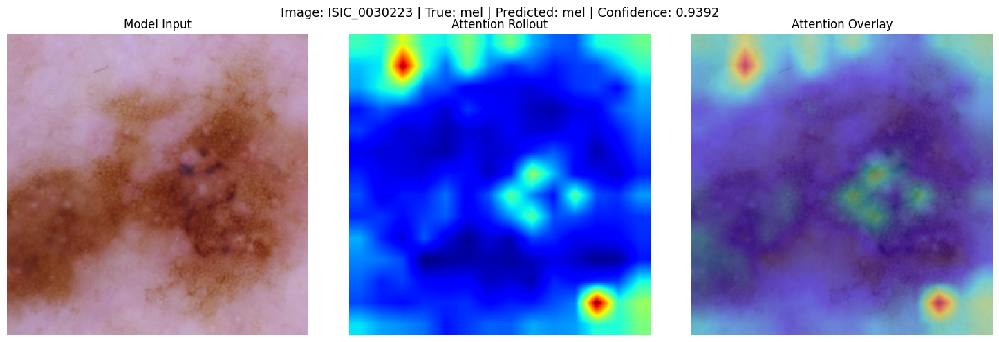

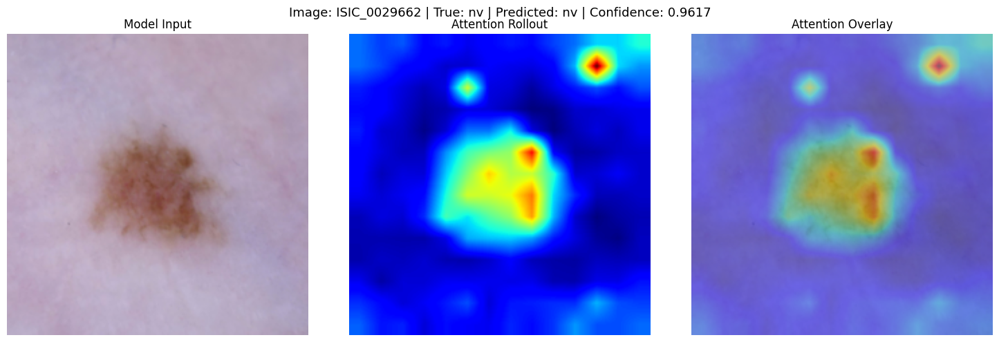

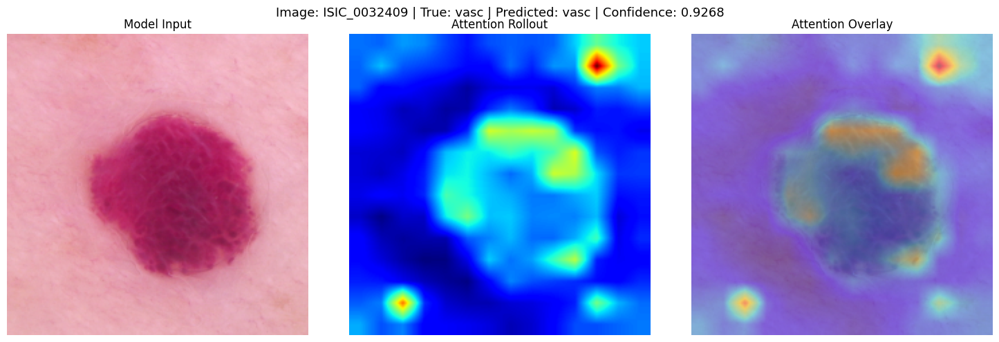

Representative attention rollout samples:


,image_id,true_class,predicted_class,prediction_confidence,correct,selection_reason
0,ISIC_0029930,akiec,akiec,0.925336,True,highest_confidence_correct
1,ISIC_0024448,bcc,bcc,0.925496,True,highest_confidence_correct
2,ISIC_0024602,bkl,bkl,0.946967,True,highest_confidence_correct
3,ISIC_0030870,df,df,0.923396,True,highest_confidence_correct
4,ISIC_0030223,mel,mel,0.939180,True,highest_confidence_correct
5,ISIC_0029662,nv,nv,0.961704,True,highest_confidence_correct
6,ISIC_0032409,vasc,vasc,0.926836,True,highest_confidence_correct



Number of visualized classes: 7

Saved summary:
/kaggle/working/vit_b16_5fold/explainability/representative_attention_summary.csv

Saved attention figures:
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/0_akiec_ISIC_0029930_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/1_bcc_ISIC_0024448_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/2_bkl_ISIC_0024602_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/3_df_ISIC_0030870_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/4_mel_ISIC_0030223_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/5_nv_ISIC_0029662_attention_rollout.png
/kaggle/working/vit_b16_5fold/explainability/representative_correct_samples/6_vasc_ISIC_0032409_attention_rollout.png


In [35]:
REPRESENTATIVE_ATTENTION_DIR = (
    EXPLAINABILITY_DIR
    / "representative_correct_samples"
)

REPRESENTATIVE_ATTENTION_DIR.mkdir(
    parents=True,
    exist_ok=True
)


best_fold_prediction_path = (
    FINAL_TEST_RESULTS_DIR
    / (
        f"fold_{EXPLAINABILITY_FOLD}_"
        "test_predictions.csv"
    )
)

if not best_fold_prediction_path.exists():
    raise FileNotFoundError(
        "Best-fold final test predictions were not found."
    )


best_fold_test_predictions = pd.read_csv(
    best_fold_prediction_path
)


required_prediction_columns = [
    "image_id",
    "true_label",
    "predicted_label"
] + probability_columns


missing_prediction_columns = [
    column
    for column in required_prediction_columns
    if column not in best_fold_test_predictions.columns
]

if missing_prediction_columns:
    raise ValueError(
        "Required prediction columns are missing: "
        f"{missing_prediction_columns}"
    )


prediction_probability_array = (
    best_fold_test_predictions[
        probability_columns
    ].to_numpy(
        dtype=np.float64
    )
)

predicted_label_array = (
    best_fold_test_predictions[
        "predicted_label"
    ].to_numpy(
        dtype=np.int64
    )
)


best_fold_test_predictions[
    "prediction_confidence"
] = prediction_probability_array[
    np.arange(
        len(best_fold_test_predictions)
    ),
    predicted_label_array
]


best_fold_test_predictions[
    "is_correct"
] = (
    best_fold_test_predictions[
        "true_label"
    ].astype(int)
    == best_fold_test_predictions[
        "predicted_label"
    ].astype(int)
)


image_path_lookup = (
    final_test_dataframe[
        [
            "image_id",
            "image_path"
        ]
    ]
    .drop_duplicates(
        subset=["image_id"]
    )
    .set_index("image_id")[
        "image_path"
    ]
    .to_dict()
)


selected_sample_rows = []


for class_index in range(
    NUM_CLASSES
):
    correct_class_candidates = (
        best_fold_test_predictions.loc[
            (
                best_fold_test_predictions[
                    "true_label"
                ].astype(int)
                == class_index
            )
            & (
                best_fold_test_predictions[
                    "is_correct"
                ]
            )
        ]
        .sort_values(
            "prediction_confidence",
            ascending=False
        )
    )


    if len(correct_class_candidates) > 0:
        selected_row = (
            correct_class_candidates.iloc[0]
        )

        selection_reason = (
            "highest_confidence_correct"
        )

    else:
        class_candidates = (
            best_fold_test_predictions.loc[
                best_fold_test_predictions[
                    "true_label"
                ].astype(int)
                == class_index
            ]
            .sort_values(
                probability_columns[
                    class_index
                ],
                ascending=False
            )
        )

        if len(class_candidates) == 0:
            print(
                f"No final test sample was found "
                f"for class {idx_to_class[class_index]}."
            )

            continue

        selected_row = (
            class_candidates.iloc[0]
        )

        selection_reason = (
            "highest_true_class_probability"
        )


    selected_sample_rows.append(
        {
            "class_index": int(
                class_index
            ),
            "class_code": idx_to_class[
                class_index
            ],
            "image_id": str(
                selected_row["image_id"]
            ),
            "selection_reason": (
                selection_reason
            )
        }
    )


representative_attention_records = []


for selected_sample in selected_sample_rows:
    image_id = selected_sample[
        "image_id"
    ]

    image_path_value = image_path_lookup.get(
        image_id
    )

    if image_path_value is None:
        raise KeyError(
            f"Image path was not found for {image_id}."
        )


    image_path = Path(
        str(image_path_value)
    )

    if not image_path.exists():
        raise FileNotFoundError(
            f"Image file does not exist: {image_path}"
        )


    pil_image = Image.open(
        image_path
    ).convert(
        "RGB"
    )


    transformed_image = validation_transform(
        pil_image
    )

    input_tensor = (
        transformed_image
        .unsqueeze(0)
        .to(DEVICE)
    )


    attention_result = generate_attention_rollout(
        model=explainability_model,
        input_tensor=input_tensor
    )


    true_label = int(
        selected_sample[
            "class_index"
        ]
    )

    predicted_label = int(
        attention_result[
            "predicted_labels"
        ][0].item()
    )

    predicted_probability = float(
        attention_result[
            "probabilities"
        ][
            0,
            predicted_label
        ].item()
    )


    attention_map = (
        attention_result[
            "attention_maps"
        ][0].numpy()
    )


    displayed_image = (
        denormalize_image(
            transformed_image
        )
        .permute(
            1,
            2,
            0
        )
        .cpu()
        .numpy()
    )


    figure, axes = plt.subplots(
        nrows=1,
        ncols=3,
        figsize=(15, 5)
    )


    axes[0].imshow(
        displayed_image
    )

    axes[0].set_title(
        "Model Input"
    )

    axes[0].axis(
        "off"
    )


    axes[1].imshow(
        attention_map,
        cmap="jet"
    )

    axes[1].set_title(
        "Attention Rollout"
    )

    axes[1].axis(
        "off"
    )


    axes[2].imshow(
        displayed_image
    )

    axes[2].imshow(
        attention_map,
        cmap="jet",
        alpha=0.45
    )

    axes[2].set_title(
        "Attention Overlay"
    )

    axes[2].axis(
        "off"
    )


    true_class_code = idx_to_class[
        true_label
    ]

    predicted_class_code = idx_to_class[
        predicted_label
    ]


    figure.suptitle(
        (
            f"Image: {image_id} | "
            f"True: {true_class_code} | "
            f"Predicted: {predicted_class_code} | "
            f"Confidence: "
            f"{predicted_probability:.4f}"
        ),
        fontsize=13
    )

    figure.tight_layout()


    figure_path = (
        REPRESENTATIVE_ATTENTION_DIR
        / (
            f"{true_label}_"
            f"{true_class_code}_"
            f"{image_id}_"
            "attention_rollout.png"
        )
    )


    figure.savefig(
        figure_path,
        dpi=300,
        bbox_inches="tight"
    )

    plt.show()
    plt.close(figure)


    representative_attention_records.append(
        {
            "image_id": image_id,
            "image_path": str(
                image_path
            ),
            "true_label": true_label,
            "true_class": (
                true_class_code
            ),
            "true_diagnosis": (
                diagnosis_full_names[
                    true_class_code
                ]
            ),
            "predicted_label": (
                predicted_label
            ),
            "predicted_class": (
                predicted_class_code
            ),
            "prediction_confidence": (
                predicted_probability
            ),
            "correct": bool(
                true_label
                == predicted_label
            ),
            "selection_reason": (
                selected_sample[
                    "selection_reason"
                ]
            ),
            "attention_figure": str(
                figure_path
            )
        }
    )


    del input_tensor
    del attention_result

    gc.collect()

    if torch.cuda.is_available():
        torch.cuda.empty_cache()


representative_attention_dataframe = (
    pd.DataFrame(
        representative_attention_records
    )
)


representative_attention_summary_path = (
    EXPLAINABILITY_DIR
    / "representative_attention_summary.csv"
)


representative_attention_dataframe.to_csv(
    representative_attention_summary_path,
    index=False
)


print(
    "Representative attention rollout samples:"
)

display(
    representative_attention_dataframe[
        [
            "image_id",
            "true_class",
            "predicted_class",
            "prediction_confidence",
            "correct",
            "selection_reason"
        ]
    ]
)


print(
    "\nNumber of visualized classes:",
    len(
        representative_attention_dataframe
    )
)

print(
    "\nSaved summary:"
)

print(
    representative_attention_summary_path
)

print(
    "\nSaved attention figures:"
)

for figure_path in (
    representative_attention_dataframe[
        "attention_figure"
    ]
):
    print(figure_path)

Explain High-Confidence Misclassifications

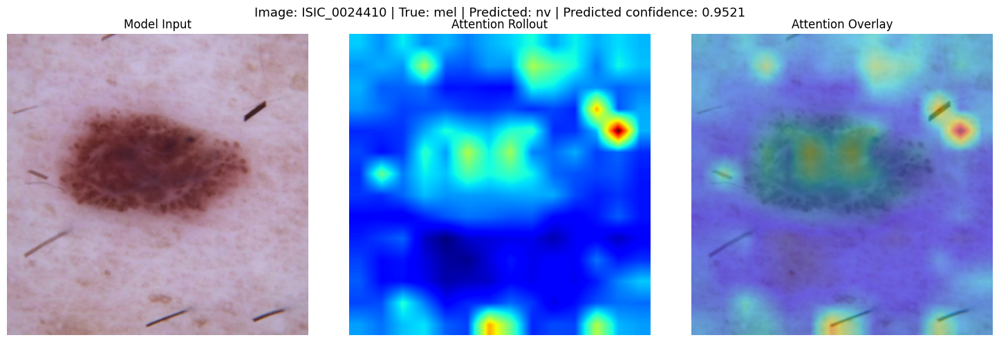

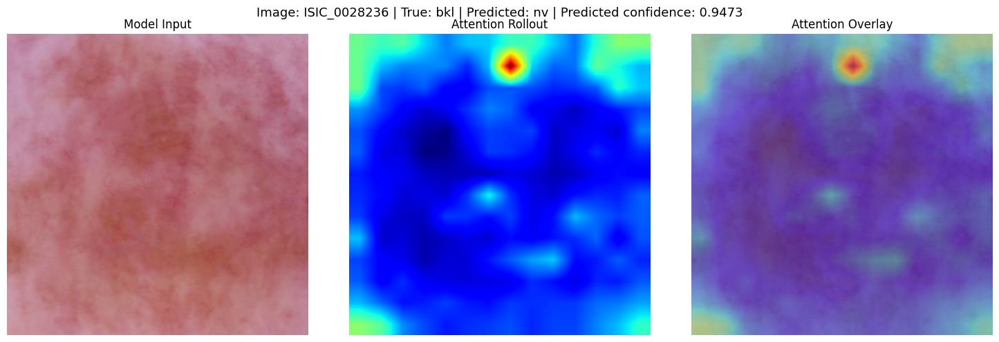

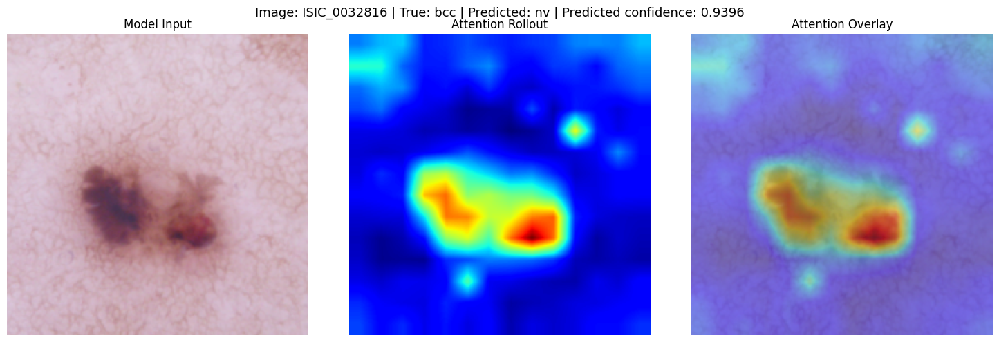

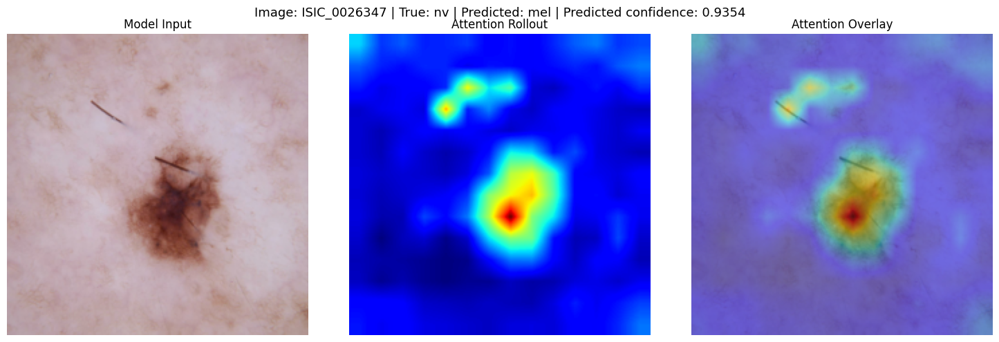

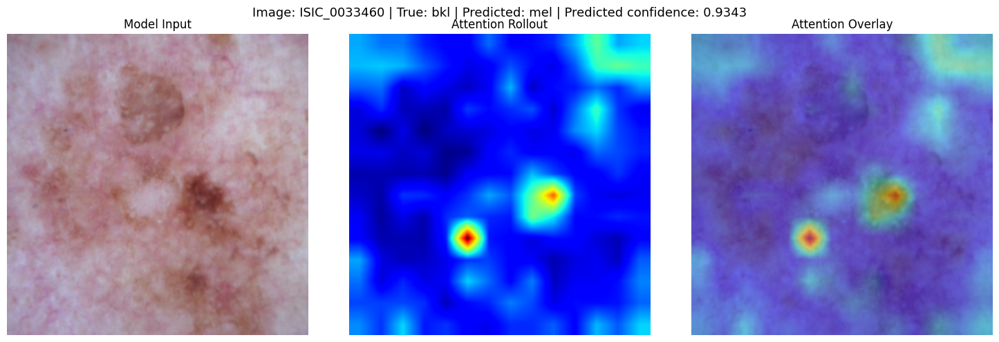

...

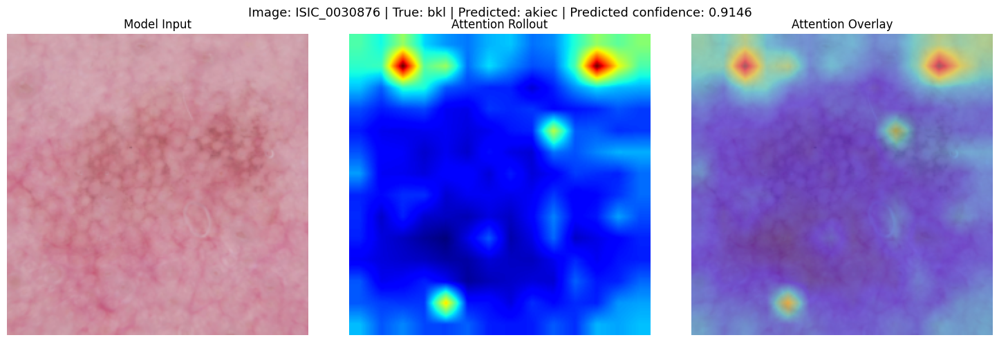

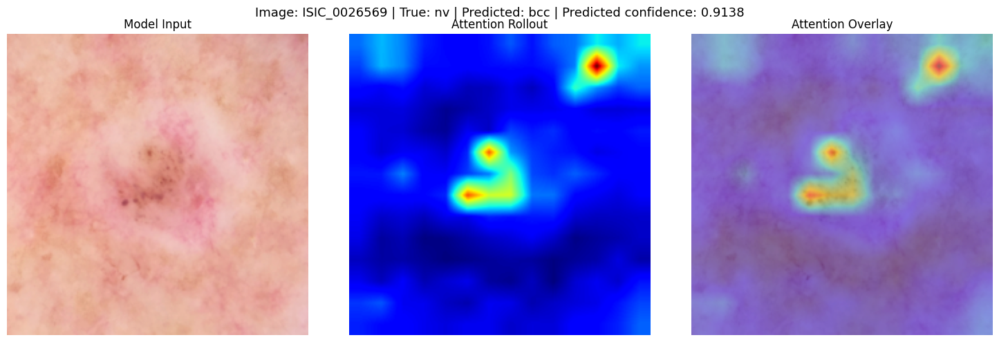

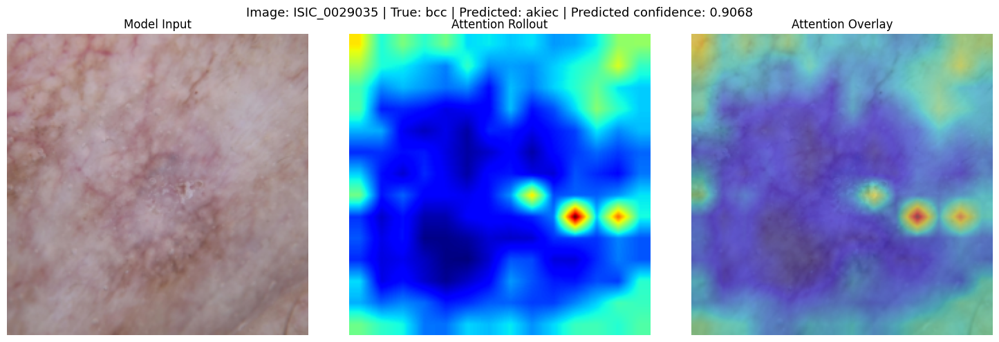

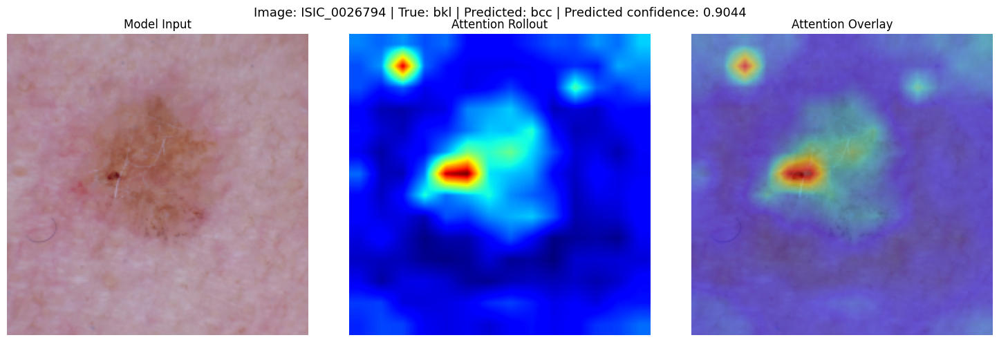

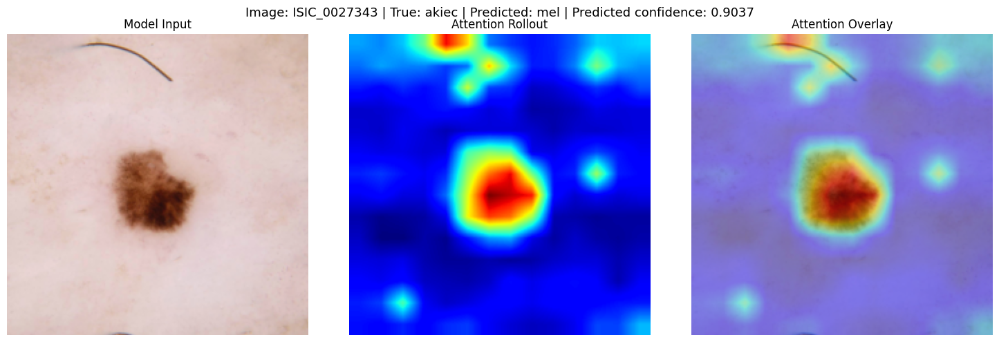

Selected high-confidence misclassifications:


,image_id,true_class,predicted_class,prediction_confidence,true_class_probability,confidence_difference
0,ISIC_0024410,mel,nv,0.952146,0.008331,0.943816
1,ISIC_0028236,bkl,nv,0.947301,0.014105,0.933196
2,ISIC_0032816,bcc,nv,0.939595,0.012745,0.926850
3,ISIC_0026347,nv,mel,0.935435,0.015013,0.920421
4,ISIC_0033460,bkl,mel,0.934318,0.015266,0.919051
5,ISIC_0028632,nv,bkl,0.933741,0.014160,0.919581
6,ISIC_0026905,akiec,bkl,0.921765,0.010559,0.911206
7,ISIC_0030876,bkl,akiec,0.914629,0.014538,0.900091
8,ISIC_0026569,nv,bcc,0.913753,0.015457,0.898295
9,ISIC_0029035,bcc,akiec,0.906784,0.015629,0.891155



Total misclassified final-test images: 227
Visualized misclassified images: 12
Unique true-to-predicted error pairs: 12

Saved summary:
/kaggle/working/vit_b16_5fold/explainability/high_confidence_misclassification_summary.csv

Saved figures directory:
/kaggle/working/vit_b16_5fold/explainability/high_confidence_misclassifications


In [36]:
MISCLASSIFIED_ATTENTION_DIR = (
    EXPLAINABILITY_DIR
    / "high_confidence_misclassifications"
)

MISCLASSIFIED_ATTENTION_DIR.mkdir(
    parents=True,
    exist_ok=True
)


MAX_MISCLASSIFIED_SAMPLES = 12


best_fold_prediction_path = (
    FINAL_TEST_RESULTS_DIR
    / (
        f"fold_{EXPLAINABILITY_FOLD}_"
        "test_predictions.csv"
    )
)

if not best_fold_prediction_path.exists():
    raise FileNotFoundError(
        "Best-fold final test predictions were not found."
    )


misclassification_dataframe = pd.read_csv(
    best_fold_prediction_path
)


required_columns = [
    "image_id",
    "true_label",
    "predicted_label"
] + probability_columns


missing_columns = [
    column
    for column in required_columns
    if column not in misclassification_dataframe.columns
]

if missing_columns:
    raise ValueError(
        "Required prediction columns are missing: "
        f"{missing_columns}"
    )


probability_array = (
    misclassification_dataframe[
        probability_columns
    ].to_numpy(
        dtype=np.float64
    )
)

predicted_label_array = (
    misclassification_dataframe[
        "predicted_label"
    ].to_numpy(
        dtype=np.int64
    )
)


misclassification_dataframe[
    "prediction_confidence"
] = probability_array[
    np.arange(
        len(misclassification_dataframe)
    ),
    predicted_label_array
]


true_label_array = (
    misclassification_dataframe[
        "true_label"
    ].to_numpy(
        dtype=np.int64
    )
)


misclassification_dataframe[
    "true_class_probability"
] = probability_array[
    np.arange(
        len(misclassification_dataframe)
    ),
    true_label_array
]


misclassified_candidates = (
    misclassification_dataframe.loc[
        misclassification_dataframe[
            "true_label"
        ].astype(int)
        !=
        misclassification_dataframe[
            "predicted_label"
        ].astype(int)
    ]
    .sort_values(
        "prediction_confidence",
        ascending=False
    )
    .reset_index(drop=True)
)


if len(misclassified_candidates) == 0:
    print(
        "No misclassified final-test samples "
        "were found for the selected fold."
    )

else:
    selected_indices = []
    selected_error_pairs = set()


    for row_index, row in (
        misclassified_candidates.iterrows()
    ):
        error_pair = (
            int(row["true_label"]),
            int(row["predicted_label"])
        )

        if error_pair not in selected_error_pairs:
            selected_indices.append(
                row_index
            )

            selected_error_pairs.add(
                error_pair
            )

        if (
            len(selected_indices)
            >= MAX_MISCLASSIFIED_SAMPLES
        ):
            break


    if (
        len(selected_indices)
        < MAX_MISCLASSIFIED_SAMPLES
    ):
        for row_index in range(
            len(misclassified_candidates)
        ):
            if row_index in selected_indices:
                continue

            selected_indices.append(
                row_index
            )

            if (
                len(selected_indices)
                >= MAX_MISCLASSIFIED_SAMPLES
            ):
                break


    selected_misclassifications = (
        misclassified_candidates.iloc[
            selected_indices
        ]
        .reset_index(drop=True)
    )


    image_path_lookup = (
        final_test_dataframe[
            [
                "image_id",
                "image_path"
            ]
        ]
        .drop_duplicates(
            subset=["image_id"]
        )
        .assign(
            image_id=lambda dataframe: (
                dataframe["image_id"].astype(str)
            )
        )
        .set_index("image_id")[
            "image_path"
        ]
        .astype(str)
        .to_dict()
    )


    misclassification_attention_records = []


    for sample_number, row in (
        selected_misclassifications.iterrows()
    ):
        image_id = str(
            row["image_id"]
        )

        image_path_value = (
            image_path_lookup.get(
                image_id
            )
        )

        if image_path_value is None:
            raise KeyError(
                f"Image path was not found for {image_id}."
            )


        image_path = Path(
            image_path_value
        )

        if not image_path.exists():
            raise FileNotFoundError(
                f"Image file does not exist: {image_path}"
            )


        pil_image = Image.open(
            image_path
        ).convert(
            "RGB"
        )


        transformed_image = (
            validation_transform(
                pil_image
            )
        )


        input_tensor = (
            transformed_image
            .unsqueeze(0)
            .to(DEVICE)
        )


        attention_result = (
            generate_attention_rollout(
                model=explainability_model,
                input_tensor=input_tensor
            )
        )


        true_label = int(
            row["true_label"]
        )

        predicted_label = int(
            attention_result[
                "predicted_labels"
            ][0].item()
        )


        predicted_confidence = float(
            attention_result[
                "probabilities"
            ][
                0,
                predicted_label
            ].item()
        )


        true_class_probability = float(
            attention_result[
                "probabilities"
            ][
                0,
                true_label
            ].item()
        )


        attention_map = (
            attention_result[
                "attention_maps"
            ][0].numpy()
        )


        displayed_image = (
            denormalize_image(
                transformed_image
            )
            .permute(
                1,
                2,
                0
            )
            .cpu()
            .numpy()
        )


        true_class_code = idx_to_class[
            true_label
        ]

        predicted_class_code = idx_to_class[
            predicted_label
        ]


        figure, axes = plt.subplots(
            nrows=1,
            ncols=3,
            figsize=(15, 5)
        )


        axes[0].imshow(
            displayed_image
        )

        axes[0].set_title(
            "Model Input"
        )

        axes[0].axis(
            "off"
        )


        axes[1].imshow(
            attention_map,
            cmap="jet"
        )

        axes[1].set_title(
            "Attention Rollout"
        )

        axes[1].axis(
            "off"
        )


        axes[2].imshow(
            displayed_image
        )

        axes[2].imshow(
            attention_map,
            cmap="jet",
            alpha=0.45
        )

        axes[2].set_title(
            "Attention Overlay"
        )

        axes[2].axis(
            "off"
        )


        figure.suptitle(
            (
                f"Image: {image_id} | "
                f"True: {true_class_code} | "
                f"Predicted: {predicted_class_code} | "
                f"Predicted confidence: "
                f"{predicted_confidence:.4f}"
            ),
            fontsize=13
        )


        figure.tight_layout()


        figure_path = (
            MISCLASSIFIED_ATTENTION_DIR
            / (
                f"{sample_number + 1:02d}_"
                f"{true_class_code}_as_"
                f"{predicted_class_code}_"
                f"{image_id}.png"
            )
        )


        figure.savefig(
            figure_path,
            dpi=300,
            bbox_inches="tight"
        )

        plt.show()
        plt.close(figure)


        misclassification_attention_records.append(
            {
                "sample_number": int(
                    sample_number + 1
                ),
                "image_id": image_id,
                "image_path": str(
                    image_path
                ),
                "true_label": true_label,
                "true_class": true_class_code,
                "true_diagnosis": (
                    diagnosis_full_names[
                        true_class_code
                    ]
                ),
                "predicted_label": (
                    predicted_label
                ),
                "predicted_class": (
                    predicted_class_code
                ),
                "predicted_diagnosis": (
                    diagnosis_full_names[
                        predicted_class_code
                    ]
                ),
                "prediction_confidence": (
                    predicted_confidence
                ),
                "true_class_probability": (
                    true_class_probability
                ),
                "confidence_difference": float(
                    predicted_confidence
                    - true_class_probability
                ),
                "attention_figure": str(
                    figure_path
                )
            }
        )


        del input_tensor
        del attention_result

        gc.collect()

        if torch.cuda.is_available():
            torch.cuda.empty_cache()


    misclassification_attention_summary = (
        pd.DataFrame(
            misclassification_attention_records
        )
    )


    misclassification_summary_path = (
        EXPLAINABILITY_DIR
        / (
            "high_confidence_"
            "misclassification_summary.csv"
        )
    )


    misclassification_attention_summary.to_csv(
        misclassification_summary_path,
        index=False
    )


    print(
        "Selected high-confidence "
        "misclassifications:"
    )

    display(
        misclassification_attention_summary[
            [
                "image_id",
                "true_class",
                "predicted_class",
                "prediction_confidence",
                "true_class_probability",
                "confidence_difference"
            ]
        ]
    )


    print(
        "\nTotal misclassified final-test images:",
        len(misclassified_candidates)
    )

    print(
        "Visualized misclassified images:",
        len(
            misclassification_attention_summary
        )
    )

    print(
        "Unique true-to-predicted error pairs:",
        len(selected_error_pairs)
    )

    print(
        "\nSaved summary:"
    )

    print(
        misclassification_summary_path
    )

    print(
        "\nSaved figures directory:"
    )

    print(
        MISCLASSIFIED_ATTENTION_DIR
    )

Create Final Results and Explainability Bundle

In [37]:
import hashlib
import zipfile


RESULTS_BUNDLE_PATH = Path(
    "/kaggle/working/"
    "vit_b16_5fold_final_results_bundle.zip"
)

MANIFEST_PATH = (
    OUTPUT_DIR
    / "final_results_manifest.csv"
)

README_PATH = (
    FINAL_SUMMARY_DIR
    / "README_results_bundle.txt"
)


critical_result_files = [
    OUTPUT_DIR
    / "development_5fold_split.csv",

    OUTPUT_DIR
    / "final_test_split.csv",

    OUTPUT_DIR
    / "experiment_config.json",

    OUTPUT_DIR
    / "completed_folds_summary.csv",

    OUTPUT_DIR
    / "cross_validation_fold_metrics.csv",

    OUTPUT_DIR
    / "cross_validation_mean_std.csv",

    OUTPUT_DIR
    / "out_of_fold_predictions.csv",

    OUTPUT_DIR
    / "combined_oof_metrics.json",

    OUTPUT_DIR
    / "combined_five_fold_training_history.csv",

    FINAL_TEST_RESULTS_DIR
    / "per_fold_test_metrics.csv",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_predictions.csv",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_test_metrics.json",

    FINAL_TEST_RESULTS_DIR
    / "best_validation_fold_test_metrics.json",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_classification_report.csv",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_raw.csv",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_confusion_matrix_normalized.csv",

    FINAL_TEST_RESULTS_DIR
    / "ensemble_per_class_roc_auc.csv",

    FINAL_SUMMARY_DIR
    / "final_performance_summary.csv",

    FINAL_SUMMARY_DIR
    / "final_performance_summary_percentage.csv",

    FINAL_SUMMARY_DIR
    / "experiment_summary.json",

    FINAL_SUMMARY_DIR
    / "report_ready_results.txt",

    EXPLAINABILITY_DIR
    / "representative_attention_summary.csv"
]


for fold_number in range(
    1,
    K_FOLDS + 1
):
    fold_paths = get_fold_paths(
        fold_number=fold_number
    )

    critical_result_files.extend(
        [
            fold_paths["history"],
            fold_paths[
                "validation_predictions"
            ],
            (
                fold_paths["directory"]
                / "fold_completion.json"
            )
        ]
    )


missing_critical_files = [
    str(file_path)
    for file_path in critical_result_files
    if not file_path.exists()
]


if missing_critical_files:
    raise FileNotFoundError(
        "The final results bundle cannot be "
        "created because required files are missing: "
        f"{missing_critical_files}"
    )


result_directories = [
    FINAL_TEST_RESULTS_DIR,
    TRAINING_PLOTS_DIR,
    FINAL_SUMMARY_DIR,
    EXPLAINABILITY_DIR
]


for directory_path in result_directories:
    if not directory_path.exists():
        raise FileNotFoundError(
            f"Required directory is missing: "
            f"{directory_path}"
        )


readme_text = (
    "HAM10000 ViT-B/16 Five-Fold Experiment\n"
    "=======================================\n\n"
    "This bundle contains evaluation, training, "
    "and explainability outputs.\n\n"
    "Methodology\n"
    "-----------\n"
    "1. The dataset was separated by lesion_id.\n"
    "2. Fifteen percent was reserved as an "
    "untouched final test set.\n"
    "3. The development set was evaluated with "
    "five-fold StratifiedGroupKFold.\n"
    "4. Augmentation was applied only to fold "
    "training subsets.\n"
    "5. The best checkpoint in each fold was "
    "selected using validation Macro F1.\n"
    "6. Final ensemble probabilities were obtained "
    "by averaging the five fold-model probabilities.\n\n"
    "Reporting Guidance\n"
    "------------------\n"
    "- Report cross-validation results as mean "
    "plus or minus standard deviation.\n"
    "- Use the best-validation-fold final-test "
    "result as the single-model baseline.\n"
    "- Use the five-fold probability ensemble as "
    "the enhanced final result.\n"
    "- Do not directly present the ensemble as a "
    "fair single-model comparison without stating "
    "that five models were combined.\n\n"
    "Explainability Notice\n"
    "---------------------\n"
    "Attention rollout indicates image regions that "
    "received relatively greater model attention. "
    "It is not lesion segmentation, causal evidence, "
    "or clinical proof.\n\n"
    "Model Files\n"
    "-----------\n"
    "The five best model files are stored separately "
    "inside vit_b16_5fold_final_compact_backup.zip.\n"
)


with open(
    README_PATH,
    "w",
    encoding="utf-8"
) as file:
    file.write(
        readme_text
    )


files_to_package = set(
    critical_result_files
)


for directory_path in result_directories:
    for file_path in directory_path.rglob("*"):
        if file_path.is_file():
            files_to_package.add(
                file_path
            )


files_to_package.add(
    README_PATH
)


files_to_package = sorted(
    files_to_package,
    key=lambda path: str(path)
)


def calculate_sha256(
    file_path,
    chunk_size=1024 * 1024
):
    digest = hashlib.sha256()

    with open(
        file_path,
        "rb"
    ) as file:
        while True:
            chunk = file.read(
                chunk_size
            )

            if not chunk:
                break

            digest.update(
                chunk
            )

    return digest.hexdigest()


manifest_records = []


for file_path in files_to_package:
    archive_path = file_path.relative_to(
        OUTPUT_DIR
    )

    manifest_records.append(
        {
            "archive_path": str(
                archive_path
            ),
            "file_size_bytes": int(
                file_path.stat().st_size
            ),
            "file_size_mb": float(
                file_path.stat().st_size
                / (1024 ** 2)
            ),
            "sha256": calculate_sha256(
                file_path
            )
        }
    )


manifest_dataframe = pd.DataFrame(
    manifest_records
)


manifest_dataframe.to_csv(
    MANIFEST_PATH,
    index=False
)


files_to_package.append(
    MANIFEST_PATH
)


if RESULTS_BUNDLE_PATH.exists():
    RESULTS_BUNDLE_PATH.unlink()


with zipfile.ZipFile(
    RESULTS_BUNDLE_PATH,
    mode="w",
    compression=zipfile.ZIP_DEFLATED,
    compresslevel=6,
    allowZip64=True
) as zip_file:

    for file_path in files_to_package:
        archive_path = file_path.relative_to(
            OUTPUT_DIR
        )

        zip_file.write(
            filename=file_path,
            arcname=str(
                archive_path
            )
        )


representative_figure_count = len(
    list(
        (
            EXPLAINABILITY_DIR
            / "representative_correct_samples"
        ).glob(
            "*.png"
        )
    )
)


misclassification_figure_count = len(
    list(
        (
            EXPLAINABILITY_DIR
            / "high_confidence_misclassifications"
        ).glob(
            "*.png"
        )
    )
)


training_figure_count = len(
    list(
        TRAINING_PLOTS_DIR.glob(
            "*.png"
        )
    )
)


disk_usage = shutil.disk_usage(
    "/kaggle/working"
)


print(
    "Final results bundle created successfully:"
)

print(
    RESULTS_BUNDLE_PATH
)

print(
    "\nBundle size:",
    f"{RESULTS_BUNDLE_PATH.stat().st_size / (1024 ** 2):.2f} MB"
)

print(
    "Packaged files:",
    len(files_to_package)
)

print(
    "Training figures:",
    training_figure_count
)

print(
    "Representative attention figures:",
    representative_figure_count
)

print(
    "Misclassification attention figures:",
    misclassification_figure_count
)

print(
    "Remaining free disk space:",
    f"{disk_usage.free / (1024 ** 3):.2f} GB"
)

print(
    "\nManifest:"
)

print(
    MANIFEST_PATH
)

print(
    "\nDownload these two files:"
)

print(
    "1.",
    "/kaggle/working/"
    "vit_b16_5fold_final_compact_backup.zip"
)

print(
    "2.",
    RESULTS_BUNDLE_PATH
)

print(
    "\nAfter downloading, save a new Kaggle "
    "notebook version with all outputs enabled."
)

Final results bundle created successfully:
/kaggle/working/vit_b16_5fold_final_results_bundle.zip

Bundle size: 9.45 MB
Packaged files: 73
Training figures: 6
Representative attention figures: 7
Misclassification attention figures: 12
Remaining free disk space: 11.48 GB

Manifest:
/kaggle/working/vit_b16_5fold/final_results_manifest.csv

Download these two files:
1. /kaggle/working/vit_b16_5fold_final_compact_backup.zip
2. /kaggle/working/vit_b16_5fold_final_results_bundle.zip

After downloading, save a new Kaggle notebook version with all outputs enabled.


Verify Both ZIP Files

In [38]:
import zipfile


COMPACT_MODEL_BACKUP_PATH = Path(
    "/kaggle/working/"
    "vit_b16_5fold_final_compact_backup.zip"
)

FINAL_RESULTS_BUNDLE_PATH = Path(
    "/kaggle/working/"
    "vit_b16_5fold_final_results_bundle.zip"
)


zip_paths = [
    COMPACT_MODEL_BACKUP_PATH,
    FINAL_RESULTS_BUNDLE_PATH
]


verification_records = []


for zip_path in zip_paths:
    if not zip_path.exists():
        raise FileNotFoundError(
            f"Required ZIP file is missing: {zip_path}"
        )

    with zipfile.ZipFile(
        zip_path,
        mode="r"
    ) as zip_file:
        corrupted_file = zip_file.testzip()

        file_names = zip_file.namelist()

        uncompressed_size = sum(
            file_info.file_size
            for file_info in zip_file.infolist()
        )

    verification_records.append(
        {
            "zip_file": zip_path.name,
            "zip_size_mb": (
                zip_path.stat().st_size
                / (1024 ** 2)
            ),
            "files_inside": len(file_names),
            "uncompressed_size_mb": (
                uncompressed_size
                / (1024 ** 2)
            ),
            "corrupted_file": (
                corrupted_file
                if corrupted_file is not None
                else "None"
            ),
            "verification_passed": (
                corrupted_file is None
            )
        }
    )


verification_dataframe = pd.DataFrame(
    verification_records
)


if not verification_dataframe[
    "verification_passed"
].all():
    failed_archives = (
        verification_dataframe.loc[
            ~verification_dataframe[
                "verification_passed"
            ],
            [
                "zip_file",
                "corrupted_file"
            ]
        ]
        .to_dict(
            orient="records"
        )
    )

    raise RuntimeError(
        "ZIP integrity verification failed: "
        f"{failed_archives}"
    )


compact_backup_required_entries = [
    "fold_1/best_model.pt",
    "fold_2/best_model.pt",
    "fold_3/best_model.pt",
    "fold_4/best_model.pt",
    "fold_5/best_model.pt",
    "development_5fold_split.csv",
    "final_test_split.csv",
    "experiment_config.json"
]


with zipfile.ZipFile(
    COMPACT_MODEL_BACKUP_PATH,
    mode="r"
) as zip_file:
    compact_backup_entries = set(
        zip_file.namelist()
    )


missing_compact_entries = [
    entry
    for entry in compact_backup_required_entries
    if entry not in compact_backup_entries
]


if missing_compact_entries:
    raise FileNotFoundError(
        "The compact model backup is missing: "
        f"{missing_compact_entries}"
    )


results_bundle_required_entries = [
    "cross_validation_fold_metrics.csv",
    "cross_validation_mean_std.csv",
    "out_of_fold_predictions.csv",
    "final_test_results/ensemble_test_metrics.json",
    "final_test_results/ensemble_test_predictions.csv",
    "final_test_results/ensemble_classification_report.csv",
    "final_summary/final_performance_summary.csv",
    "final_summary/report_ready_results.txt",
    "explainability/representative_attention_summary.csv",
    "final_results_manifest.csv"
]


with zipfile.ZipFile(
    FINAL_RESULTS_BUNDLE_PATH,
    mode="r"
) as zip_file:
    results_bundle_entries = set(
        zip_file.namelist()
    )


missing_result_entries = [
    entry
    for entry in results_bundle_required_entries
    if entry not in results_bundle_entries
]


if missing_result_entries:
    raise FileNotFoundError(
        "The final results bundle is missing: "
        f"{missing_result_entries}"
    )


print("ZIP integrity verification:")
display(verification_dataframe)

print("\nCompact model backup verification:")
print("Five best models: present")
print("Dataset splits: present")
print("Experiment configuration: present")

print("\nFinal results bundle verification:")
print("Cross-validation results: present")
print("Final test results: present")
print("Classification report: present")
print("Training plots: present")
print("Explainability results: present")
print("Manifest: present")

print("\nViT-B/16 experiment completed successfully.")

print("\nDownload these files:")
print(COMPACT_MODEL_BACKUP_PATH)
print(FINAL_RESULTS_BUNDLE_PATH)

print(
    "\nSave a Kaggle notebook version "
    "with all outputs enabled."
)

ZIP integrity verification:


,zip_file,zip_size_mb,files_inside,uncompressed_size_mb,corrupted_file,verification_passed
0,vit_b16_5fold_final_compact_backup.zip,1639.332655,24,1639.329643,None,True
1,vit_b16_5fold_final_results_bundle.zip,9.447157,73,13.974841,None,True



Compact model backup verification:
Five best models: present
Dataset splits: present
Experiment configuration: present

Final results bundle verification:
Cross-validation results: present
Final test results: present
Classification report: present
Training plots: present
Explainability results: present
Manifest: present

ViT-B/16 experiment completed successfully.

Download these files:
/kaggle/working/vit_b16_5fold_final_compact_backup.zip
/kaggle/working/vit_b16_5fold_final_results_bundle.zip

Save a Kaggle notebook version with all outputs enabled.
